In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import datetime as dt
from datetime import datetime
import seaborn as sns
from scipy.optimize import curve_fit
import matplotlib.dates as mdates
import matplotlib as mpl

In [3]:
elon =  pd.read_csv('merged_data_elonmusk.csv' ,parse_dates=["date"])
#elon =  pd.read_csv('merged_data_elonmusk.csv')
CathieDWood =  pd.read_csv('merged_data_CathieDWood.csv',parse_dates=["date"])
chamath =  pd.read_csv('merged_data_chamath.csv',parse_dates=["date"])
LilMoonLambo =  pd.read_csv('merged_data_LilMoonLambo.csv',parse_dates=["date"])
tyler =  pd.read_csv('merged_data_tyler.csv',parse_dates=["date"])
UniswapD =  pd.read_csv('merged_data_UniswapD.csv',parse_dates=["date"])
VitalikButerin =  pd.read_csv('merged_data_VitalikButerin.csv',parse_dates=["date"])


#reverse data
elon_full =  pd.read_csv('merged_data_elonmusk_full.csv' ,parse_dates=["date"])
#elon =  pd.read_csv('merged_data_elonmusk.csv')
CathieDWood_full =  pd.read_csv('merged_data_CathieDWood_full.csv',parse_dates=["date"])
chamath_full =  pd.read_csv('merged_data_chamath_full.csv',parse_dates=["date"])
LilMoonLambo_full =  pd.read_csv('merged_data_LilMoonLambo_full.csv',parse_dates=["date"])
tyler_full =  pd.read_csv('merged_data_tyler_full.csv',parse_dates=["date"])
UniswapD_full =  pd.read_csv('merged_data_UniswapD_full.csv',parse_dates=["date"])
VitalikButerin_full =  pd.read_csv('merged_data_VitalikButerin_full.csv',parse_dates=["date"])

#polarity and subjectivity data
elon_pol =  pd.read_csv('elon_time_tweet_cleaned_btc_polar_sub_+-0.csv' ,parse_dates=["date"])
CathieDWood_pol =  pd.read_csv('CathieDWood_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])
chamath_pol =  pd.read_csv('chamath_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])
LilMoonLambo_pol =  pd.read_csv('LilMoonLambo_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])
tyler_pol =  pd.read_csv('tyler_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])
UniswapD_pol =  pd.read_csv('UniswapD_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])
VitalikButerin_pol =  pd.read_csv('VitalikButerin_time_tweet_cleaned_btc_polar_sub_+-0.csv',parse_dates=["date"])

In [3]:
elon.head(2)

,Unnamed: 0,Unnamed: 0_x,date,tweet,Unnamed: 0_y,Close,Volume,return% 1m,return% 10m,return% 30m,...,volume 6h,volume 12h,volume 1d,volat 1m,volat 10m,volat 30m,volat 1h,volat 3h,volat 6h,volat 12h
0,0,54,2021-07-19 19:38:00,"@jack @BitcoinMagazine @CathieDWood Sure, I ha...",3146,30685.65,0.339049,0.053673,0.013752,0.186146,...,323.277568,1133.838368,2437.075885,0.0,0.040946,0.057034,0.048093,0.045262,0.058355,0.088526
1,1,55,2021-07-19 19:26:00,@BitcoinMagazine @jack @CathieDWood During thi...,3158,30673.94,0.894879,0.075341,0.080785,0.247963,...,325.051277,1138.907788,2435.407276,0.0,0.033932,0.048331,0.048193,0.045017,0.057394,0.088330


In [4]:
CathieDWood

,Unnamed: 0,Unnamed: 0_x,date,tweet,Unnamed: 0_y,Close,Volume,return% 1m,return% 10m,return% 30m,...,volume 6h,volume 12h,volume 1d,volat 1m,volat 10m,volat 30m,volat 1h,volat 3h,volat 6h,volat 12h
0,0,1,2021-07-19 20:25:00,"@elonmusk @BitcoinMagazine @jack ""With so many...",3099,30718.48,1.351187,0.020899,0.053030,0.168596,...,324.003761,1101.542872,2447.130630,0.0,0.039231,0.040832,0.042205,0.042738,0.067282,0.088936
1,1,15,2021-04-22 04:07:00,"In a research collaboration with $SQ, @yassine...",129323,53917.30,1.221437,-0.139287,0.084184,0.310030,...,320.428541,898.369239,4422.677533,0.0,0.163593,0.136476,0.122098,0.112416,0.120823,0.121330
2,2,22,2021-04-11 12:58:00,The technologically-enabled innovation evolvin...,144630,59597.04,0.005397,0.094552,-0.024666,-0.013272,...,126.773968,352.580057,809.324055,0.0,0.077317,0.061037,0.074927,0.061159,0.058413,0.071384
3,3,50,2021-02-16 04:15:00,Companies disrupting the traditional world ord...,222902,49900.59,51.406600,-0.192623,-0.806483,-1.473009,...,583.252147,1505.091629,2756.446922,0.0,0.270127,0.192285,0.171789,0.136977,0.118845,0.163678
4,4,56,2021-01-21 17:09:00,As Chair of the Fed from February 2014 to Febr...,259556,31535.30,11.216149,0.337685,-0.909742,0.572470,...,1718.007189,4095.154119,5656.188060,0.0,0.271375,0.280174,0.239786,0.220934,0.243081,0.276238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,165,1721,2015-11-04 13:38:00,"Art Laffer, renowned economist, collaborated w...",2899787,496.25,0.109289,0.000000,0.000000,-3.073048,...,1101.054947,1463.258120,2148.196258,0.0,0.000000,0.582363,0.635646,0.499299,0.808327,1.227747
166,166,1722,2015-11-04 13:35:00,"Chris Burniske, ARK's Bitcoin analyst, talks a...",2899790,500.00,0.028928,0.000000,-0.750000,-3.420000,...,1099.583875,1462.529625,2148.225185,0.0,0.225000,0.591746,0.632444,0.493625,0.807827,1.216985
167,167,1729,2015-10-30 20:01:00,#Bitcoin regulations in the UK and Australia s...,2906604,327.77,0.000000,0.000000,0.000000,0.000000,...,248.564514,276.620684,306.906936,0.0,0.000000,0.000000,0.273621,0.243660,0.264718,0.216710
168,168,1740,2015-10-23 21:04:00,.@ARKInvest's #bitcoin analyst Chris Burniske ...,2916621,280.19,0.000000,0.000000,0.000000,0.010707,...,162.196564,264.348304,379.248394,0.0,0.000000,0.001922,0.001955,0.002911,0.002241,0.016262


In [5]:
#[datetime.strptime(i, "%Y-%m-%d %H:%M:%S") for i in elon.date] #Change string to timestamp

In [6]:
# function: just input 'return col name' and 'volat col name' will plot scatter
def elon_scatter(ret_col, volat_col, title):
    #t = np.array([datetime.strptime(i, "%Y-%m-%d %H:%M:%S") for i in elon.date]) #Angus' original code
    plt.figure(dpi=150)
    t = elon["date"]
    l1=plt.scatter(t,np.array(elon[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(elon[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
   

def CathieDWood_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = CathieDWood["date"]
    l1=plt.scatter(t,np.array(CathieDWood[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(CathieDWood[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
       
    
def chamath_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = chamath["date"]
    l1=plt.scatter(t,np.array(chamath[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(chamath[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
     
    
def LilMoonLambo_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = LilMoonLambo["date"]
    l1=plt.scatter(t,np.array(LilMoonLambo[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(LilMoonLambo[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
    
    
def tyler_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = tyler["date"]
    l1=plt.scatter(t,np.array(tyler[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(tyler[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
      
    
def UniswapD_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = UniswapD["date"]
    l1=plt.scatter(t,np.array(UniswapD[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(UniswapD[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
     
    
def VitalikButerin_scatter(ret_col, volat_col, title):
    plt.figure(dpi=150)
    t = VitalikButerin["date"]
    l1=plt.scatter(t,np.array(VitalikButerin[ret_col]),s=5,color='tab:orange', alpha=.7)
    l2=plt.scatter(t,np.array(VitalikButerin[volat_col]),s=5,color='tab:blue', alpha=.3, label='volat 10m')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
   

In [7]:
def elonBAR(col, title):
    plt.plot(dpi=150)
    t = elon["date"]
    plt.bar(t, np.array(elon[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    
    
    
def CathieDWoodBAR(col, title):
    plt.plot(dpi=150)
    t = CathieDWood["date"]
    plt.bar(t, np.array(CathieDWood[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    
def chamathBAR(col, title):
    plt.plot(dpi=150)
    t = chamath["date"]
    plt.bar(t, np.array(chamath[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45    
    
def LilMoonLamboBAR(col, title):
    plt.plot(dpi=150)
    t = LilMoonLambo["date"]
    plt.bar(t, np.array(LilMoonLambo[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    
def tylerBAR(col, title):
    plt.plot(dpi=150)
    t = tyler["date"]
    plt.bar(t, np.array(tyler[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    
def UniswapDBAR(col, title):
    plt.plot(dpi=150)
    t = UniswapD["date"]
    plt.bar(t, np.array(UniswapD[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    
def VitalikButerinBAR(col, title):
    plt.plot(dpi=150)
    t = VitalikButerin["date"]
    plt.bar(t, np.array(VitalikButerin[col]), width=10)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel('volume')
    plt.autoscale(enable=True, axis='x')
    fig.autofmt_xdate(rotation=45) #rotate the date string by 45
    

In [22]:
def elonPOL(ret_col, polarity_col, title):
    #t = np.array([datetime.strptime(i, "%Y-%m-%d %H:%M:%S") for i in elon.date]) #Angus' original code
    plt.figure(dpi=150)
    t = elon_pol["date"]
    fig, l1 = plt.subplots(dpi=150)
    l1.plot(t,np.array(elon_pol[ret_col]),color='tab:orange', alpha=.7)
    l2=l1.twinx()
    l2.bar(t,np.array(elon_pol[polarity_col]),color='tab:blue')
    plt.xlabel("date")
    plt.ylabel('returns(%)')
    plt.title(title)
    plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
    plt.autoscale(enable=True, axis='x')
    plt.autoscale(enable=True, axis='y')

<ipython-input-22-472b6b6a5235>:12: UserWarning: Legend does not support <matplotlib.axes._subplots.AxesSubplot object at 0x00000259CB0126A0> instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
<ipython-input-22-472b6b6a5235>:12: UserWarning: Legend does not support <matplotlib.axes._subplots.AxesSubplot object at 0x00000259CAD4EFA0> instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')


<Figure size 900x600 with 0 Axes>

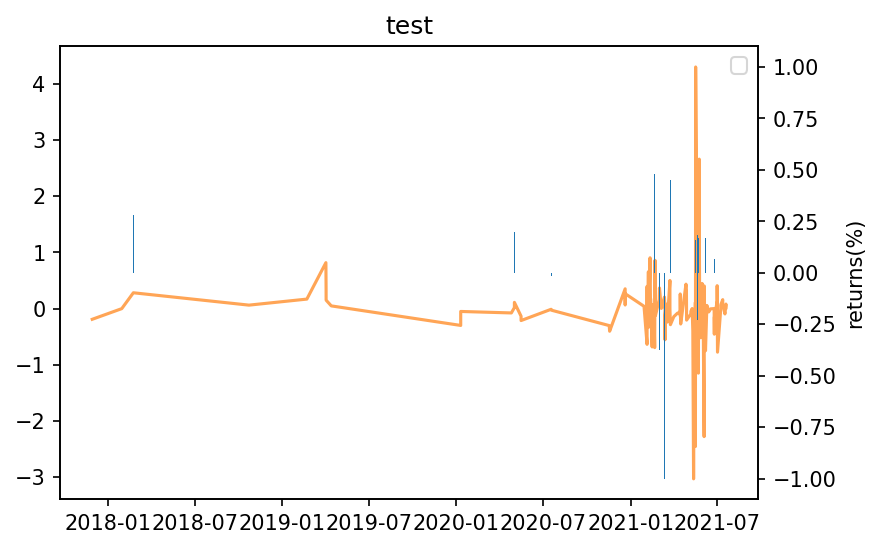

In [23]:
elonPOL('return% 10m', 'polarity','test')

# Elon Musk
## Scatter plot (time vs Return% / Volatility)

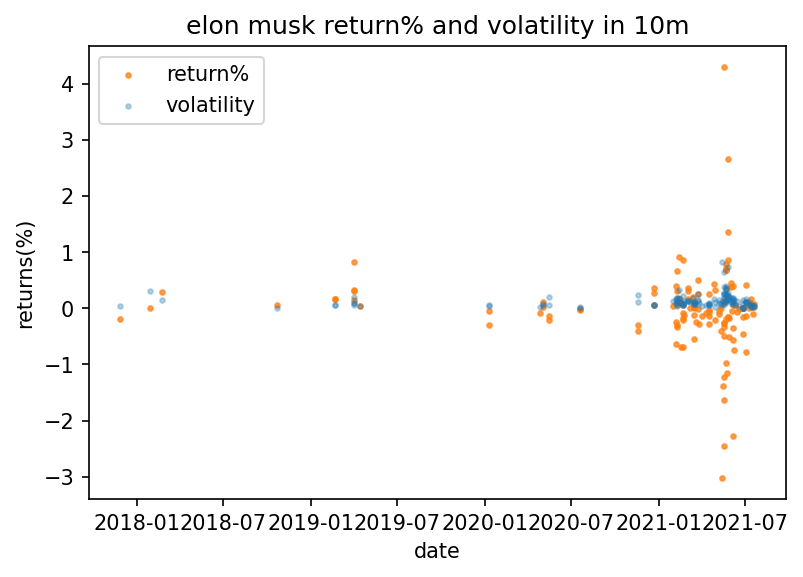

In [8]:
elon_scatter('return% 10m','volat 10m','elon musk return% and volatility in 10m') #10 minutes graph

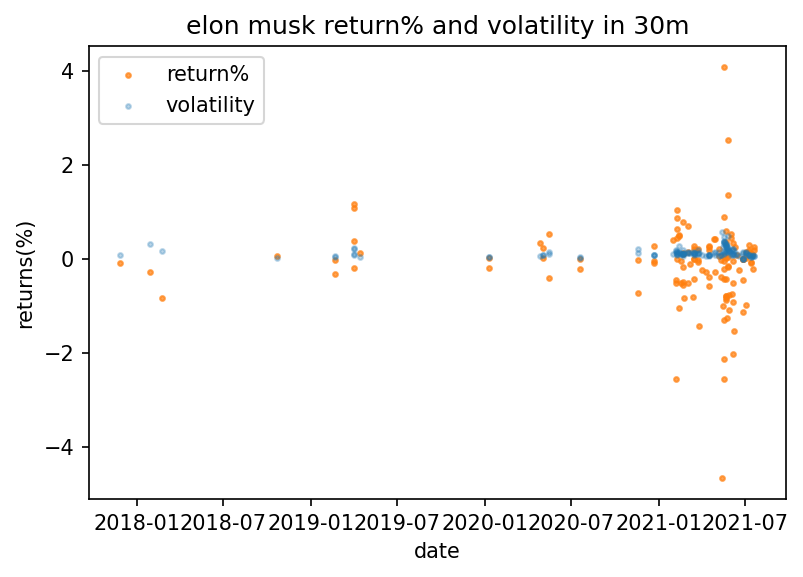

In [9]:
elon_scatter('return% 30m','volat 30m','elon musk return% and volatility in 30m')

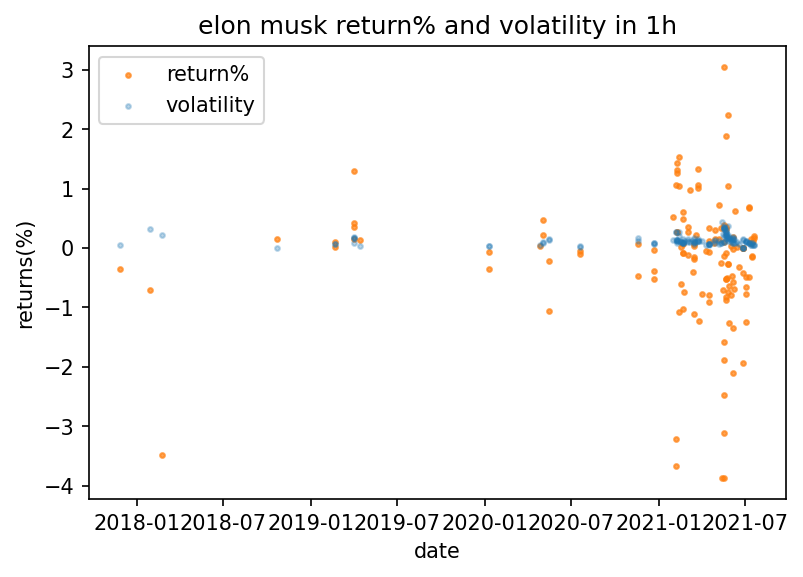

In [10]:
elon_scatter('return% 1h','volat 1h','elon musk return% and volatility in 1h')

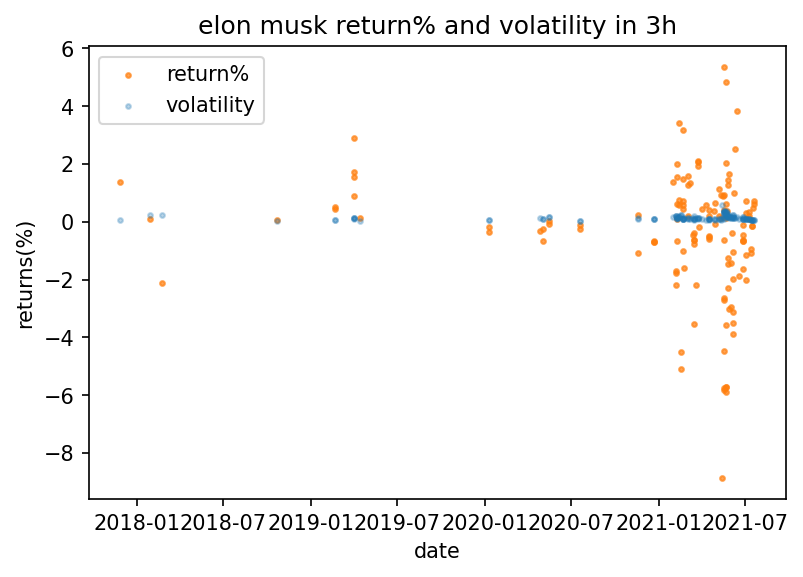

In [11]:
elon_scatter('return% 3h','volat 3h','elon musk return% and volatility in 3h')

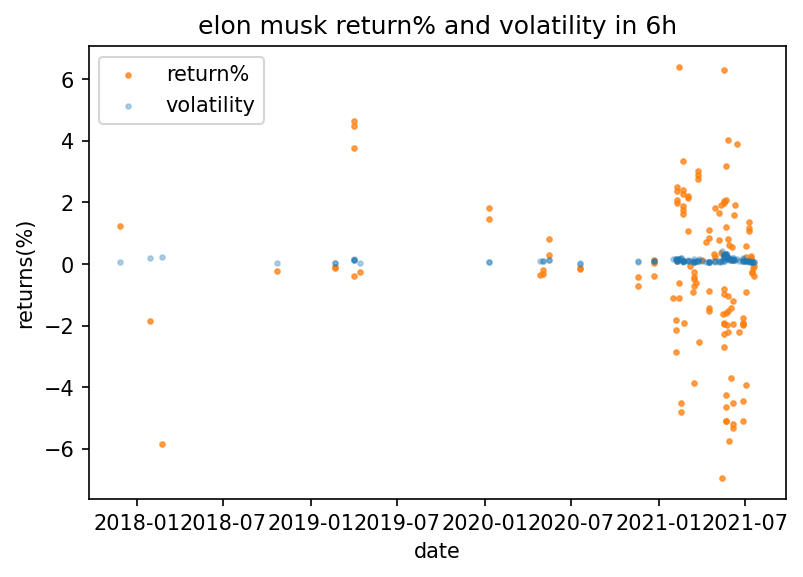

In [12]:
elon_scatter('return% 6h','volat 6h','elon musk return% and volatility in 6h')

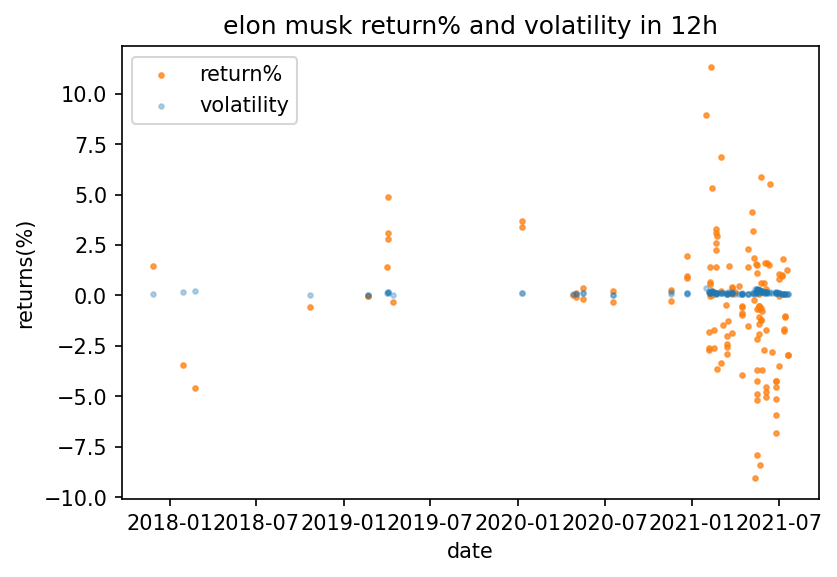

In [13]:
elon_scatter('return% 12h','volat 12h','elon musk return% and volatility in 12h')

## Volume graph

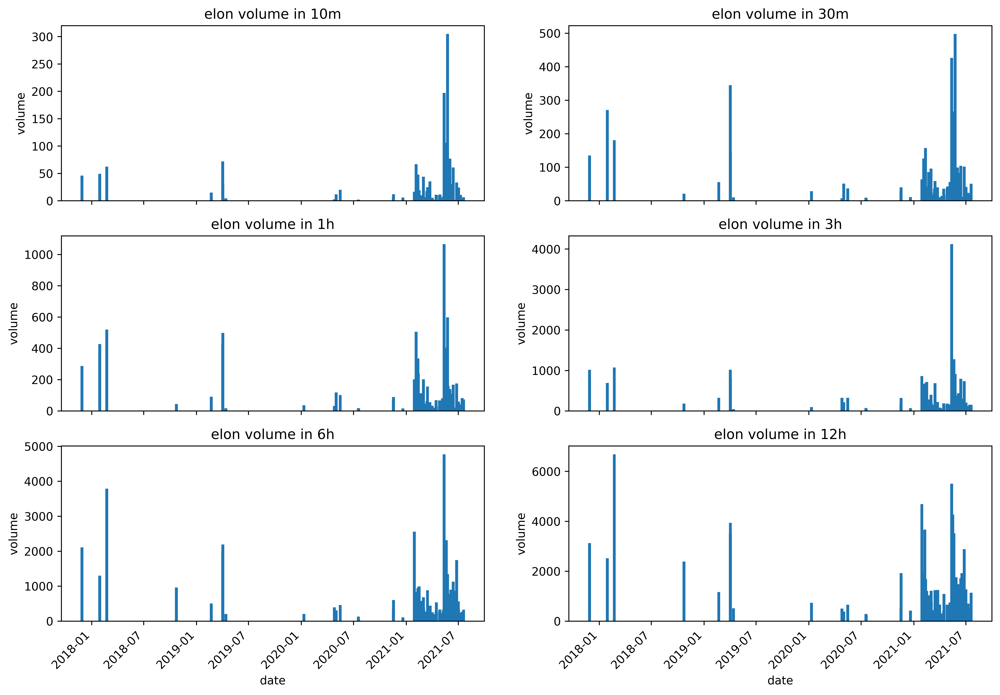

In [14]:
#elon vol 10m

fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
elonBAR('volume 10m', 'elon volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
elonBAR('volume 30m', 'elon volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
elonBAR('volume 1h', 'elon volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
elonBAR('volume 3h', 'elon volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
elonBAR('volume 6h', 'elon volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
elonBAR('volume 12h', 'elon volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merged Graph

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 10m')

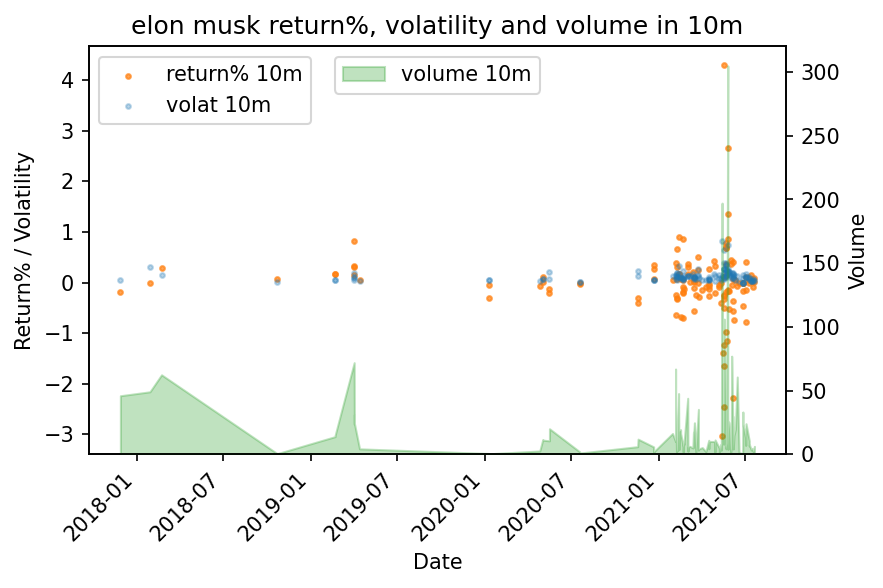

In [15]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 10m"] #return y-axis
y2 = elon2["volat 10m"] #volatility y-axis
y3 = elon2["volume 10m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 10m")

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 30m')

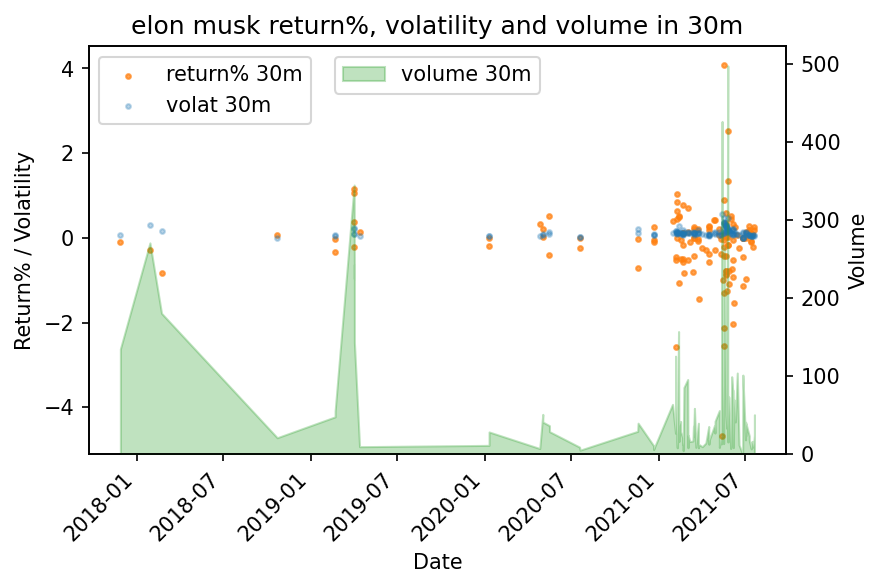

In [16]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 30m"] #return y-axis
y2 = elon2["volat 30m"] #volatility y-axis
y3 = elon2["volume 30m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 30m")

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 1h')

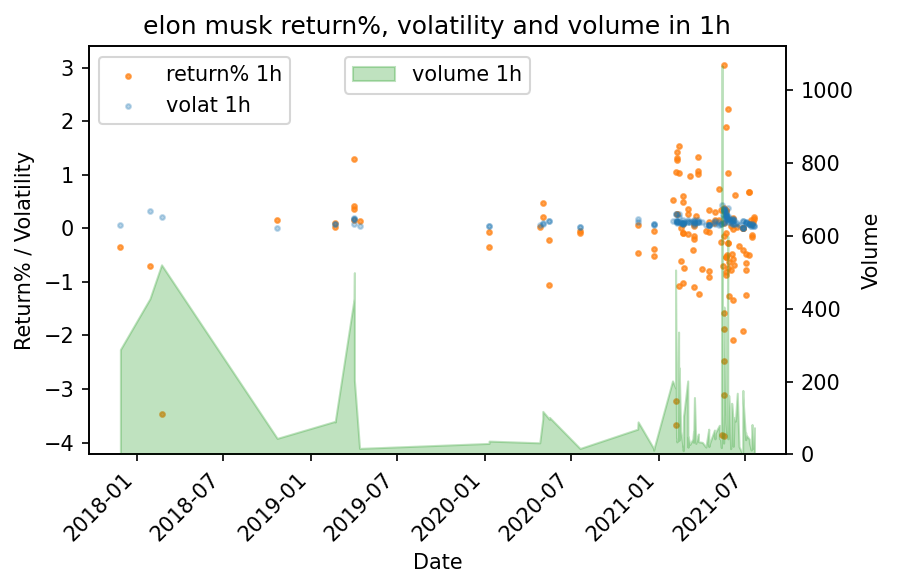

In [17]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 1h"] #return y-axis
y2 = elon2["volat 1h"] #volatility y-axis
y3 = elon2["volume 1h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 1h")

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 3h')

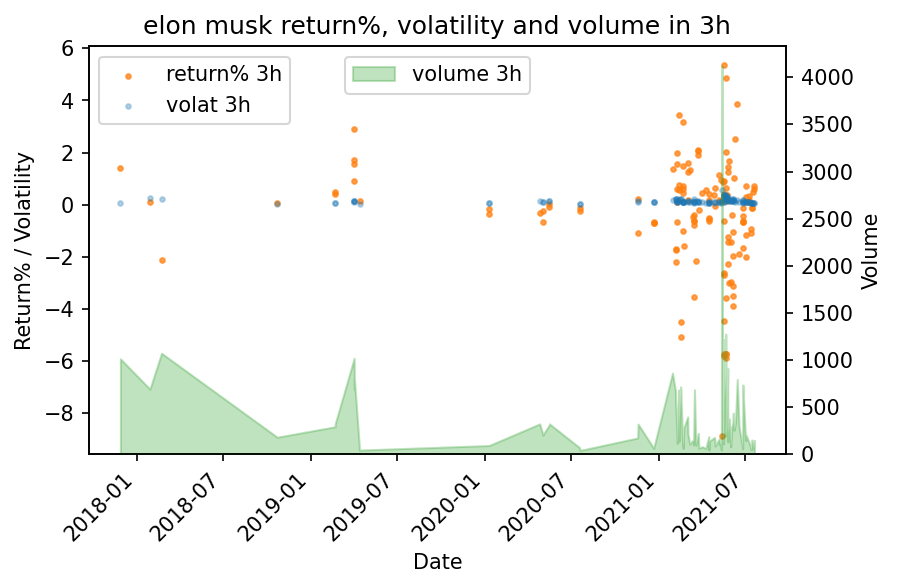

In [18]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 3h"] #return y-axis
y2 = elon2["volat 3h"] #volatility y-axis
y3 = elon2["volume 3h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 3h")

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 6h')

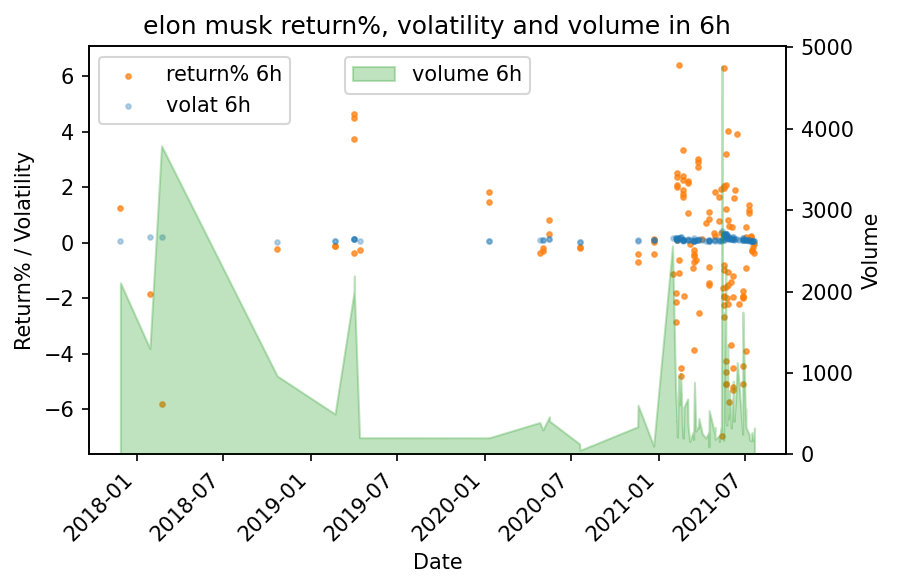

In [19]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 6h"] #return y-axis
y2 = elon2["volat 6h"] #volatility y-axis
y3 = elon2["volume 6h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 6h")

Text(0.5, 1.0, 'elon musk return%, volatility and volume in 12h')

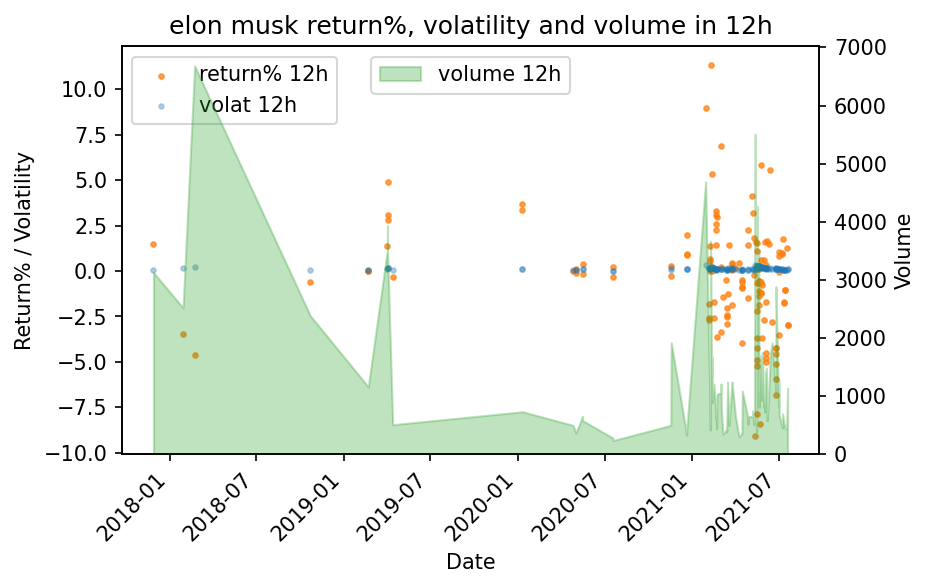

In [20]:
elon2 = elon #copy
x = elon2["date"] #x axis
y1 = elon2["return% 12h"] #return y-axis
y2 = elon2["volat 12h"] #volatility y-axis
y3 = elon2["volume 12h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk return%, volatility and volume in 12h")

## Volatility Ratio Graph

In [21]:
elon_full['volat ratio 10min'] = elon_full['volat 10m'] / elon_full['volat 10m_r'] #Make ratio column for volatility
elon_full['volat ratio 30min'] = elon_full['volat 30m'] / elon_full['volat 30m_r']
elon_full['volat ratio 1h'] = elon_full['volat 1h'] / elon_full['volat 1h_r']
elon_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,54,2021-07-19 19:38:00,"@jack @BitcoinMagazine @CathieDWood Sure, I ha...",3146,30685.65,0.339049,0.053673,0.013752,0.186146,...,1525.355129,0.0,0.030798,0.054301,0.062565,0.064134,0.079981,1.329510,1.050340,0.768686
1,1,55,2021-07-19 19:26:00,@BitcoinMagazine @jack @CathieDWood During thi...,3158,30673.94,0.894879,0.075341,0.080785,0.247963,...,1519.758121,0.0,0.072132,0.077528,0.074591,0.065526,0.081577,0.470412,0.623401,0.646105
2,2,73,2021-07-17 16:54:00,@AshleyIllusion1 @lexfridman Lil X is hodling ...,6184,31689.50,0.147193,0.030862,-0.095047,-0.223544,...,976.128571,0.0,0.037505,0.078490,0.073846,0.081809,0.084143,1.751703,0.890388,0.794538
3,3,119,2021-07-14 17:49:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10449,32844.99,0.079623,0.013853,0.023596,0.085827,...,1264.383861,0.0,0.057393,0.044697,0.046751,0.064416,0.079105,0.527970,1.138003,1.795811
4,4,120,2021-07-14 17:48:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10450,32856.18,0.570455,-0.034058,0.038349,0.101564,...,1264.726093,0.0,0.059512,0.044591,0.047886,0.064365,0.079173,0.471358,1.130255,1.755346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,131,7600,2019-02-21 10:45:00,"@coindesk That said, I still only own 0.25 BTC...",1202232,3890.00,0.001716,0.000000,0.169152,-0.023907,...,3091.103172,0.0,0.045188,0.038944,0.040784,0.070325,0.092343,1.215398,1.019248,1.867535
132,132,8410,2018-10-22 23:51:00,@vicentes @Grimezsz Wanna buy some Bitcoin? 😉😉...,1343484,6403.49,0.000000,0.041071,0.061685,0.061841,...,2725.680016,0.0,0.016725,0.013648,0.015037,0.019333,0.018829,0.786651,0.595908,0.559221
133,133,10082,2018-02-22 09:16:00,@DeadlyBananas @MichaelAVaughn Not sure. I let...,1689009,10520.40,2.672431,-0.151515,0.281738,-0.825159,...,9970.664885,0.0,0.191841,0.165358,0.186471,0.172542,0.154594,0.780718,0.954674,1.142265
134,134,10167,2018-01-29 01:28:00,"But wait, there’s more: the flamethrower is se...",1724037,11376.17,10.482588,0.000000,-0.000791,-0.285070,...,4311.731991,0.0,0.261090,0.181205,0.138961,0.138685,0.146285,1.143532,1.671202,2.277126


<ipython-input-22-06046cf09471>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


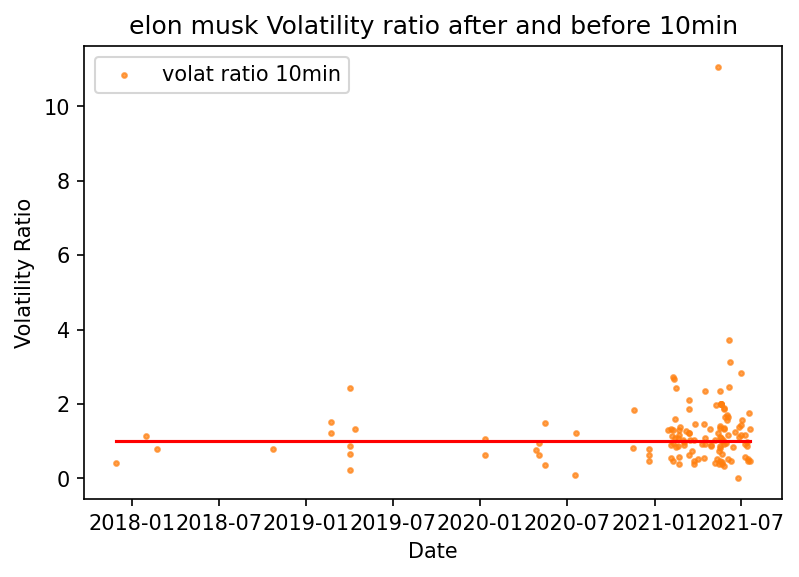

In [22]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volatility ratio after and before 10min")
fig.show()

<ipython-input-23-17a939aef01a>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


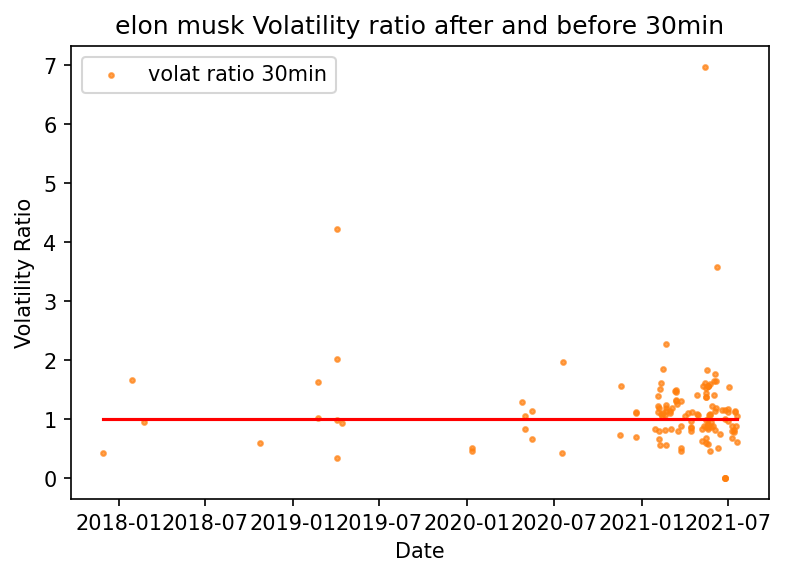

In [23]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volatility ratio after and before 30min")
fig.show()

<ipython-input-24-cf5382ff7ee4>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


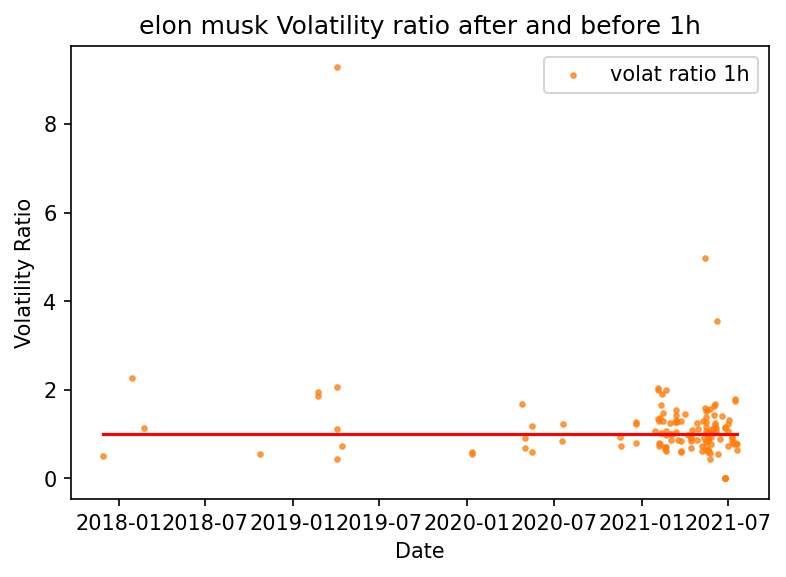

In [24]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [52]:
elon_full['volume ratio 10min'] = elon_full['volume 10m'] / elon_full['volume 10m_r'] #Make ratio column for volume
elon_full['volume ratio 30min'] = elon_full['volume 30m'] / elon_full['volume 30m_r']
elon_full['volume ratio 1h'] = elon_full['volume 1h'] / elon_full['volume 1h_r']
elon_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,return ratio 10min,return ratio 30min,return ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,54,2021-07-19 19:38:00,"@jack @BitcoinMagazine @CathieDWood Sure, I ha...",3146,30685.65,0.339049,0.053673,0.013752,0.186146,...,0.054301,0.062565,0.064134,0.079981,-0.211847,0.928479,-0.897783,1.218463,3.316103,1.612845
1,1,55,2021-07-19 19:26:00,@BitcoinMagazine @jack @CathieDWood During thi...,3158,30673.94,0.894879,0.075341,0.080785,0.247963,...,0.077528,0.074591,0.065526,0.081577,0.400129,2.048478,-1.284274,1.157996,1.742743,1.425035
2,2,73,2021-07-17 16:54:00,@AshleyIllusion1 @lexfridman Lil X is hodling ...,6184,31689.50,0.147193,0.030862,-0.095047,-0.223544,...,0.078490,0.073846,0.081809,0.084143,0.750374,1.031450,-0.668999,1.073792,0.515721,0.412511
3,3,119,2021-07-14 17:49:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10449,32844.99,0.079623,0.013853,0.023596,0.085827,...,0.044697,0.046751,0.064416,0.079105,1.108727,-2.761019,-0.834545,0.357888,0.626217,1.988940
4,4,120,2021-07-14 17:48:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10450,32856.18,0.570455,-0.034058,0.038349,0.101564,...,0.044591,0.047886,0.064365,0.079173,0.300716,3.112873,-1.586154,0.307200,0.634424,1.993259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,131,7600,2019-02-21 10:45:00,"@coindesk That said, I still only own 0.25 BTC...",1202232,3890.00,0.001716,0.000000,0.169152,-0.023907,...,0.038944,0.040784,0.070325,0.092343,-0.940000,0.170956,-0.193154,3.684908,1.085777,1.592004
132,132,8410,2018-10-22 23:51:00,@vicentes @Grimezsz Wanna buy some Bitcoin? 😉😉...,1343484,6403.49,0.000000,0.041071,0.061685,0.061841,...,0.013648,0.015037,0.019333,0.018829,-1.106443,-0.670051,-3.413428,0.515938,0.855979,1.402814
133,133,10082,2018-02-22 09:16:00,@DeadlyBananas @MichaelAVaughn Not sure. I let...,1689009,10520.40,2.672431,-0.151515,0.281738,-0.825159,...,0.165358,0.186471,0.172542,0.154594,-4.907285,9.042708,2.759771,1.017164,0.941887,1.800235
134,134,10167,2018-01-29 01:28:00,"But wait, there’s more: the flamethrower is se...",1724037,11376.17,10.482588,0.000000,-0.000791,-0.285070,...,0.181205,0.138961,0.138685,0.146285,0.000402,0.120634,0.252096,0.223549,0.939282,1.320162


<ipython-input-26-46e1ed3a4ee2>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


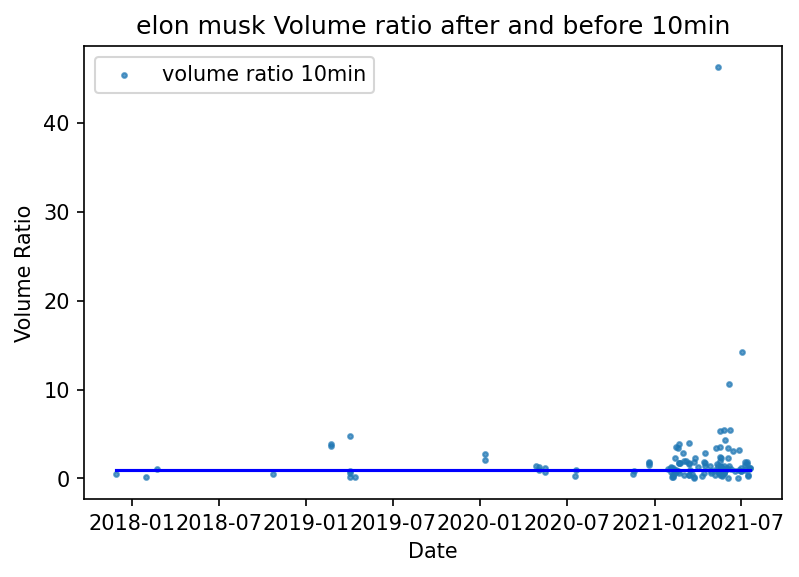

In [26]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volume ratio after and before 10min")
fig.show()

<ipython-input-27-cb20f0cc578d>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


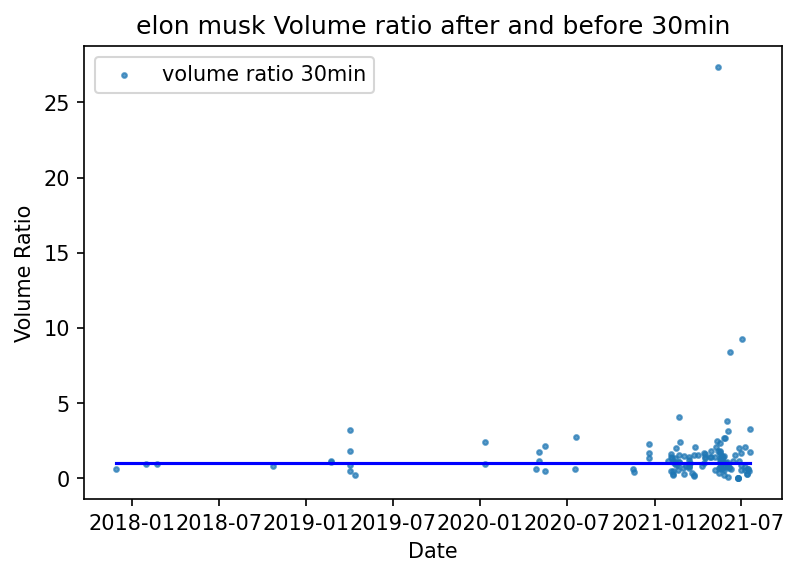

In [27]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volume ratio after and before 30min")
fig.show()

<ipython-input-53-c3d7c74b03a9>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


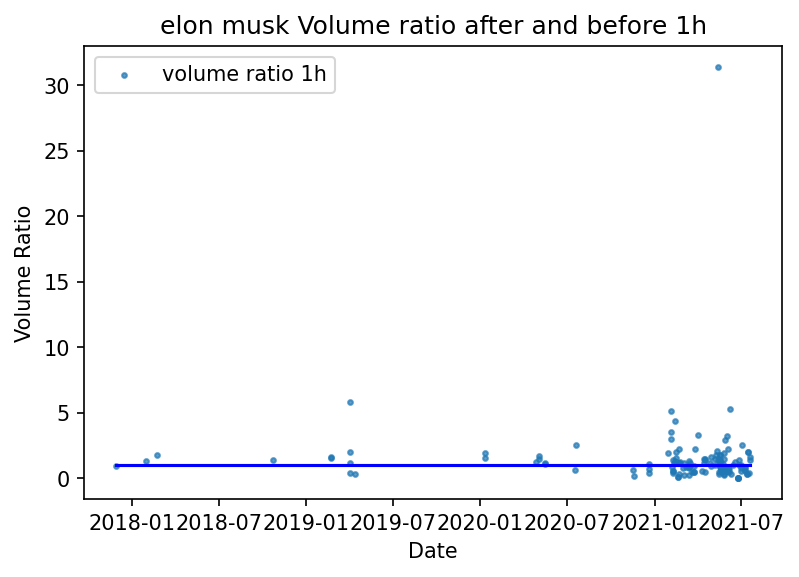

In [53]:
elon2 = elon_full #copy
x = elon2["date"] #x axis
y1 = elon2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("elon musk Volume ratio after and before 1h")
fig.show()

## Raturn%, Polarity and Subjectivity

In [103]:
elon_full['return ratio 10min'] = elon_full['return% 10m'] / elon_full['return% 10m_r'] #Make ratio column for volume
elon_full['return ratio 30min'] = elon_full['return% 30m'] / elon_full['return% 30m_r']
elon_full['return ratio 1h'] = elon_full['return% 1h'] / elon_full['return% 1h_r']

#Data sorting and merging
simple_elon_pol=elon_pol[['date','polarity','subjectivity','polarity2']]
elon_pol_full = pd.merge(elon_full, simple_elon_pol, on='date')


    
#giving conditions    
conditions = [(elon_pol_full['return ratio 10min']) > 1 & (elon_pol_full['polarity'] > 0), 
              (elon_pol_full['return ratio 10min']) < 1 & (elon_pol_full['polarity'] < 0), 
              elon_pol_full['polarity'] == 0]
              
#giving choice for each condition
choices = ['Both positive', 'Both Negative', '0 polarity']

#if none ofthem, it shows Both Different
elon_pol_full['compare 10min'] = np.select(conditions, choices, default='Both different')

elon_pol_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,return ratio 10min,return ratio 30min,return ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h,polarity,subjectivity,polarity2,compare 10min
0,0,54,2021-07-19 19:38:00,"@jack @BitcoinMagazine @CathieDWood Sure, I ha...",3146,30685.65,0.339049,0.053673,0.013752,0.186146,...,-0.211847,0.928479,-0.897783,1.218463,3.316103,1.612845,0.500000,0.888889,positive,Both Negative
1,1,55,2021-07-19 19:26:00,@BitcoinMagazine @jack @CathieDWood During thi...,3158,30673.94,0.894879,0.075341,0.080785,0.247963,...,0.400129,2.048478,-1.284274,1.157996,1.742743,1.425035,0.000000,1.000000,0,Both positive
2,2,73,2021-07-17 16:54:00,@AshleyIllusion1 @lexfridman Lil X is hodling ...,6184,31689.50,0.147193,0.030862,-0.095047,-0.223544,...,0.750374,1.031450,-0.668999,1.073792,0.515721,0.412511,0.000000,0.000000,0,Both positive
3,3,119,2021-07-14 17:49:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10449,32844.99,0.079623,0.013853,0.023596,0.085827,...,1.108727,-2.761019,-0.834545,0.357888,0.626217,1.988940,0.000000,0.000000,0,Both positive
4,4,120,2021-07-14 17:48:00,@doge_southern @SamTwits @TeslaOwnersEBay @Kri...,10450,32856.18,0.570455,-0.034058,0.038349,0.101564,...,0.300716,3.112873,-1.586154,0.307200,0.634424,1.993259,0.000000,0.000000,0,Both positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,131,7600,2019-02-21 10:45:00,"@coindesk That said, I still only own 0.25 BTC...",1202232,3890.00,0.001716,0.000000,0.169152,-0.023907,...,-0.940000,0.170956,-0.193154,3.684908,1.085777,1.592004,0.200000,0.666667,positive,Both Negative
136,132,8410,2018-10-22 23:51:00,@vicentes @Grimezsz Wanna buy some Bitcoin? 😉😉...,1343484,6403.49,0.000000,0.041071,0.061685,0.061841,...,-1.106443,-0.670051,-3.413428,0.515938,0.855979,1.402814,0.000000,0.000000,0,Both Negative
137,133,10082,2018-02-22 09:16:00,@DeadlyBananas @MichaelAVaughn Not sure. I let...,1689009,10520.40,2.672431,-0.151515,0.281738,-0.825159,...,-4.907285,9.042708,2.759771,1.017164,0.941887,1.800235,0.283333,0.796296,positive,Both Negative
138,134,10167,2018-01-29 01:28:00,"But wait, there’s more: the flamethrower is se...",1724037,11376.17,10.482588,0.000000,-0.000791,-0.285070,...,0.000402,0.120634,0.252096,0.223549,0.939282,1.320162,0.466667,0.600000,positive,Both different


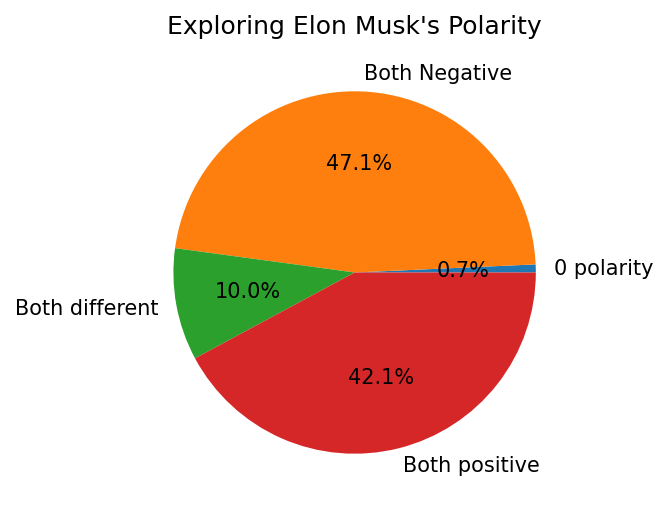

In [130]:
#Draw pie graph
labels=['0 polarity', 'Both Negative', 'Both different', 'Both positive'] #Label for the pie chart
count = elon_pol_full.groupby(['compare 10min']).count()['polarity']  #Count how many columns they have for each label


plt.figure(dpi=150)
plt.pie(count, labels=labels, autopct='%.1f%%') #plot pie graph
plt.title("Exploring Elon Musk's Polarity")
plt.show()


In [123]:
#elon_pol_full.groupby(['compare 10min']).count()['polarity']

compare 10min
0 polarity         1
Both Negative     66
Both different    14
Both positive     59
Name: polarity, dtype: int64

# CathieDWoodBAR
## Scatter plot (time vs Return% / Volatility)

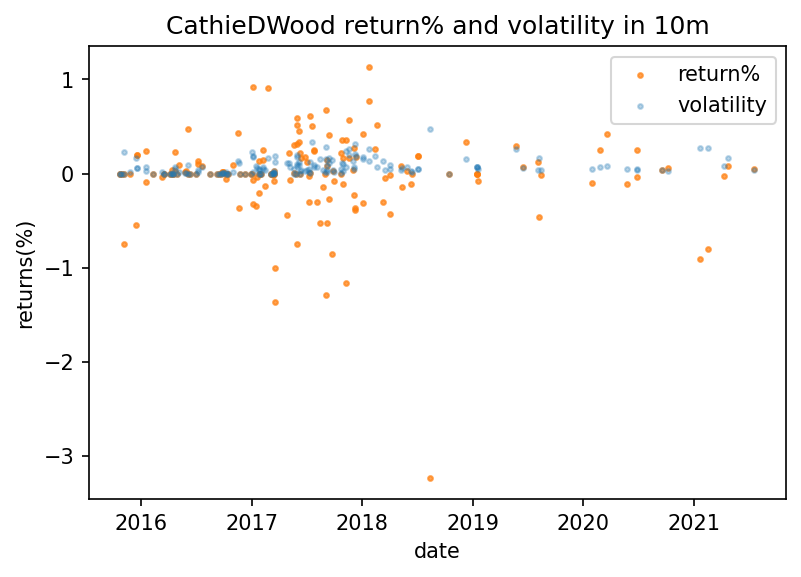

In [29]:
CathieDWood_scatter('return% 10m','volat 10m','CathieDWood return% and volatility in 10m')

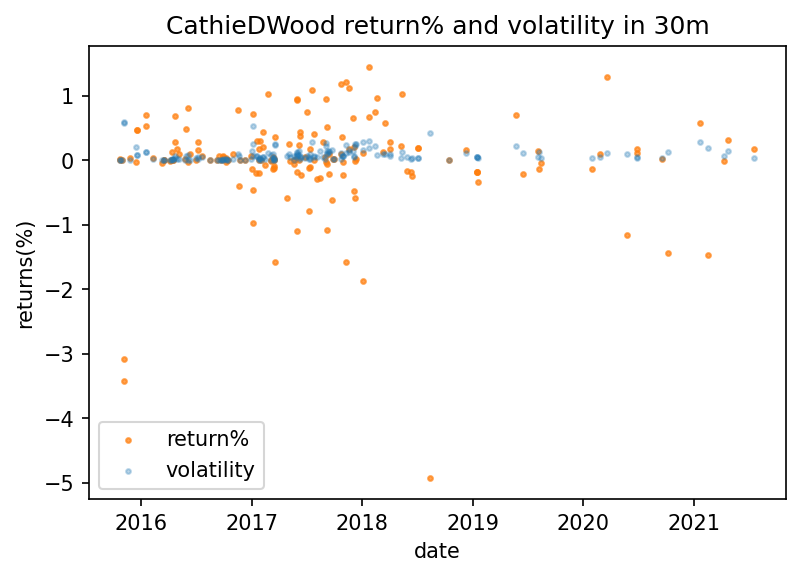

In [30]:
CathieDWood_scatter('return% 30m','volat 30m','CathieDWood return% and volatility in 30m')

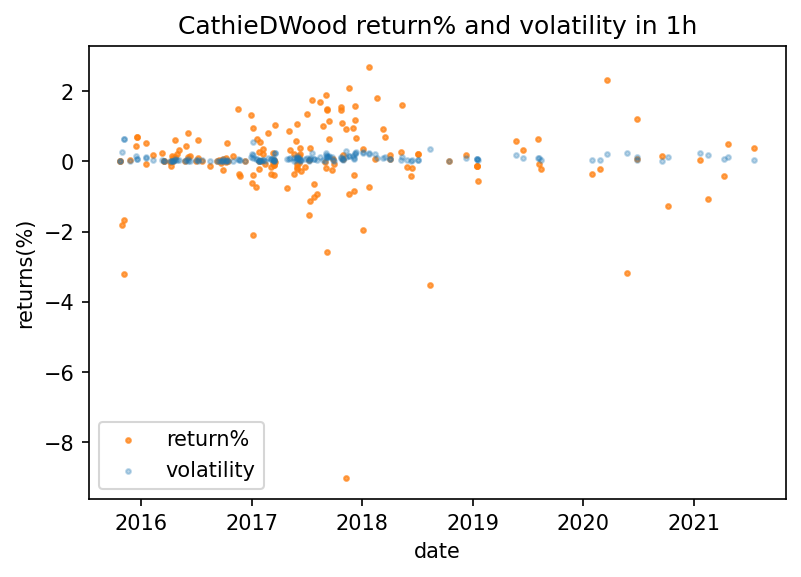

In [31]:
CathieDWood_scatter('return% 1h','volat 1h','CathieDWood return% and volatility in 1h')

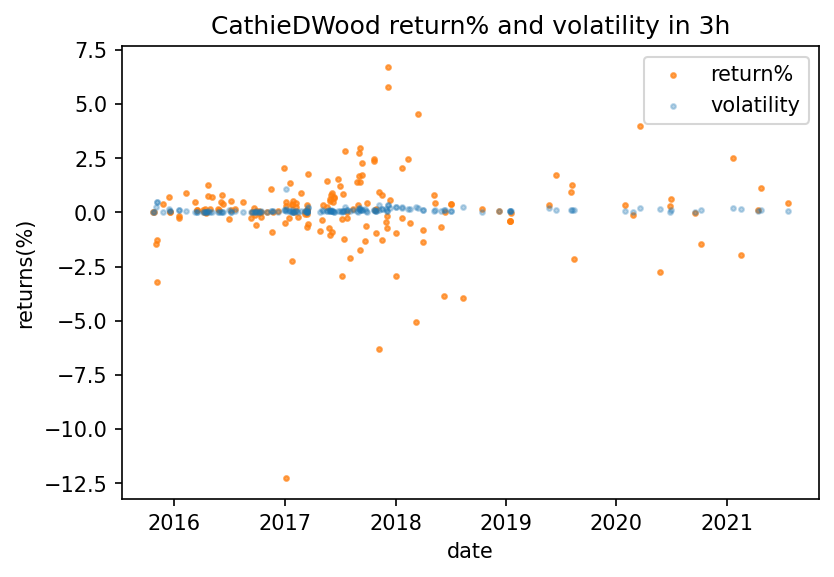

In [32]:
CathieDWood_scatter('return% 3h','volat 3h','CathieDWood return% and volatility in 3h')

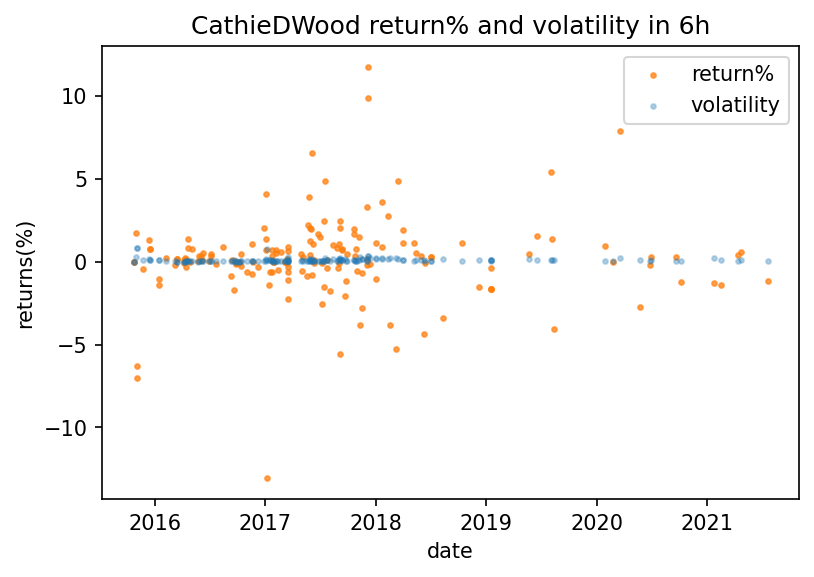

In [33]:
CathieDWood_scatter('return% 6h','volat 6h','CathieDWood return% and volatility in 6h')

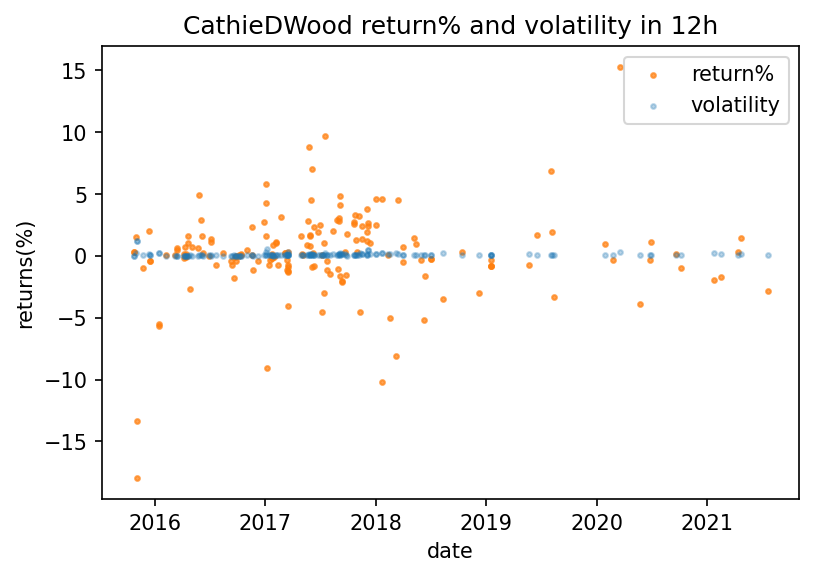

In [34]:
CathieDWood_scatter('return% 12h','volat 12h','CathieDWood return% and volatility in 12h')

## Volume Graph

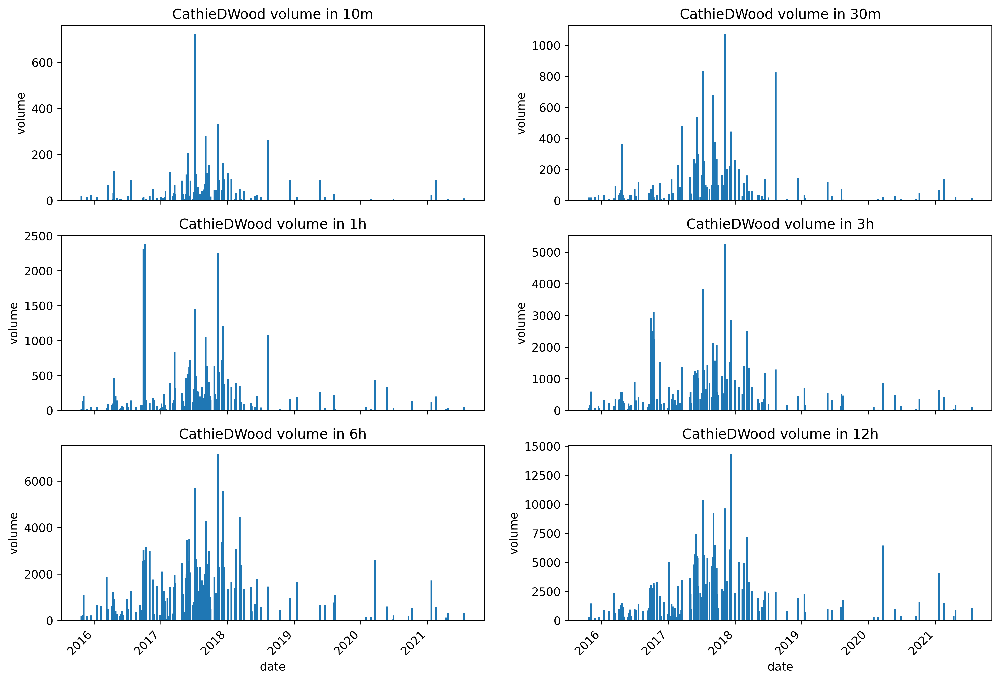

In [35]:
#elon vol 10m

fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
CathieDWoodBAR('volume 10m', 'CathieDWood volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
CathieDWoodBAR('volume 30m', 'CathieDWood volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
CathieDWoodBAR('volume 1h', 'CathieDWood volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
CathieDWoodBAR('volume 3h', 'CathieDWood volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
CathieDWoodBAR('volume 6h', 'CathieDWood volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
CathieDWoodBAR('volume 12h', 'CathieDWood volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merged Graph

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 10m')

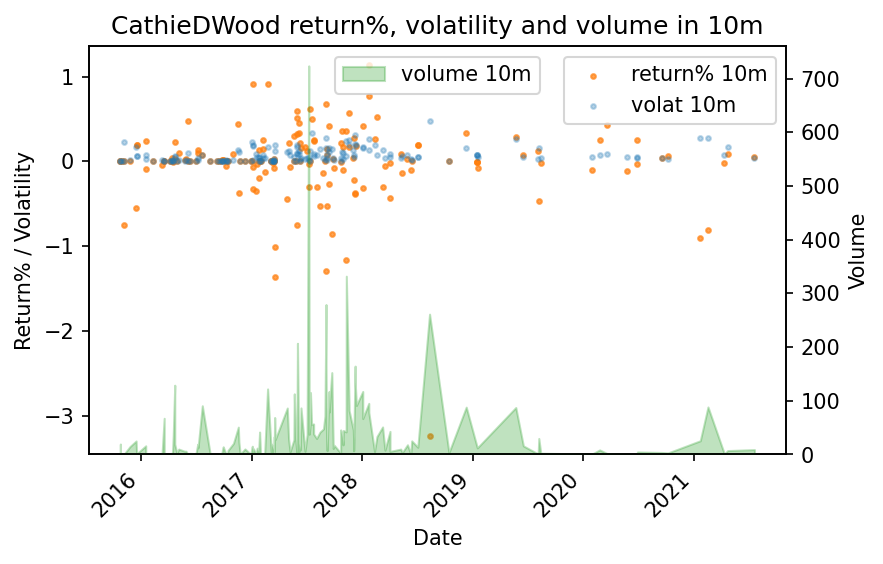

In [36]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 10m"] #return y-axis
y2 = CathieDWood2["volat 10m"] #volatility y-axis
y3 = CathieDWood2["volume 10m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 10m")

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 30m')

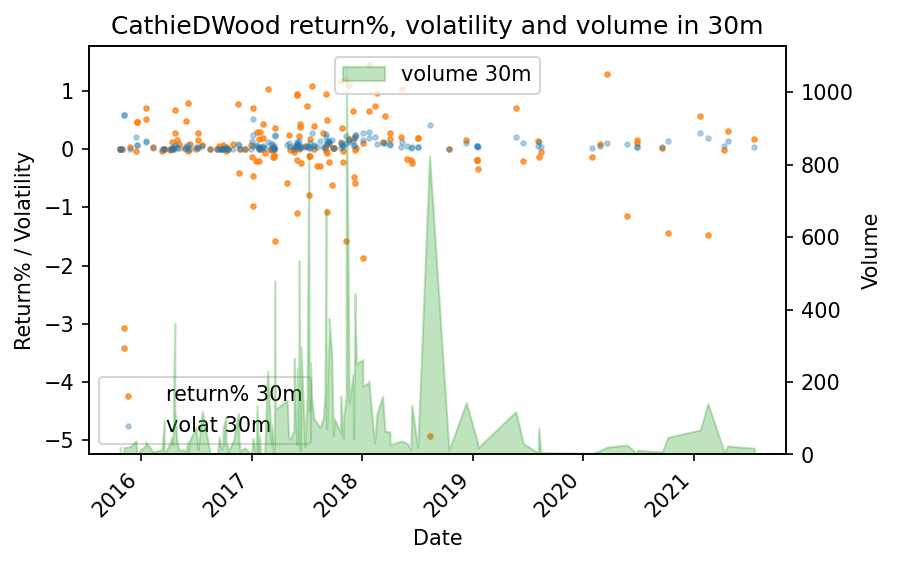

In [37]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 30m"] #return y-axis
y2 = CathieDWood2["volat 30m"] #volatility y-axis
y3 = CathieDWood2["volume 30m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 30m")

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 1h')

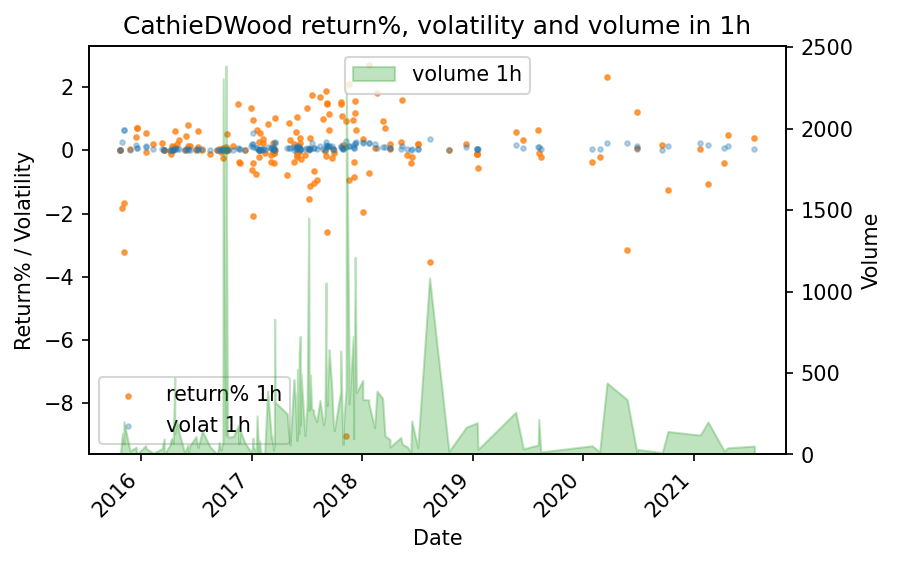

In [38]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 1h"] #return y-axis
y2 = CathieDWood2["volat 1h"] #volatility y-axis
y3 = CathieDWood2["volume 1h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 1h")

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 3h')

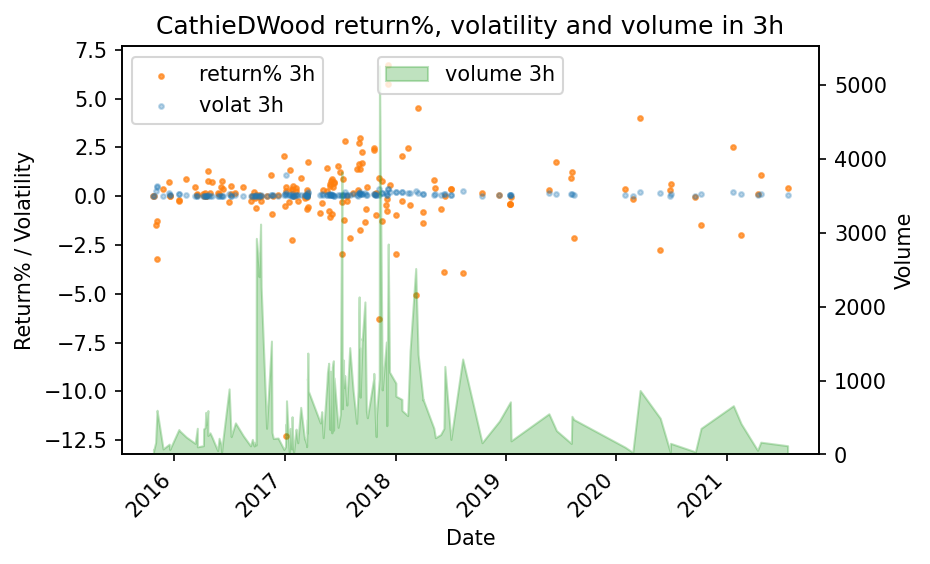

In [39]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 3h"] #return y-axis
y2 = CathieDWood2["volat 3h"] #volatility y-axis
y3 = CathieDWood2["volume 3h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 3h")

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 6h')

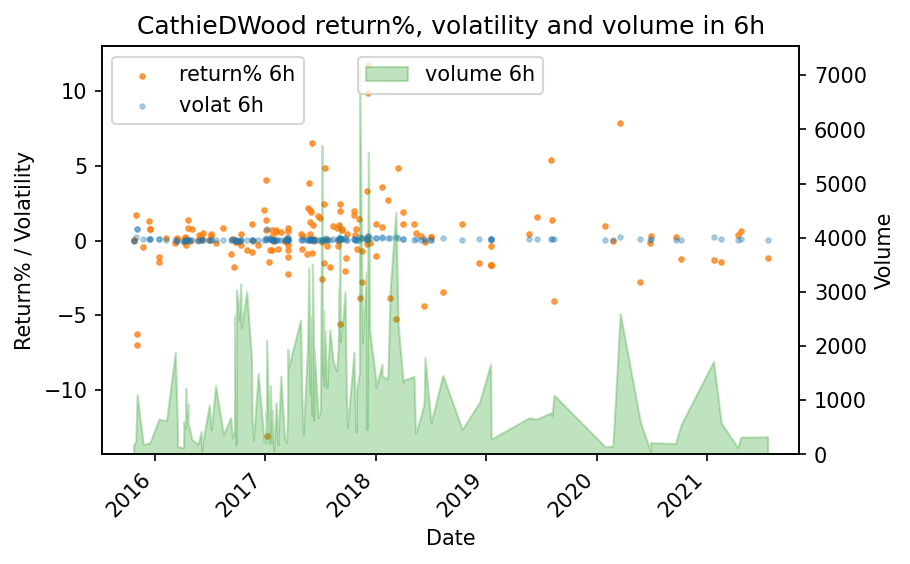

In [40]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 6h"] #return y-axis
y2 = CathieDWood2["volat 6h"] #volatility y-axis
y3 = CathieDWood2["volume 6h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 6h")

Text(0.5, 1.0, 'CathieDWood return%, volatility and volume in 12h')

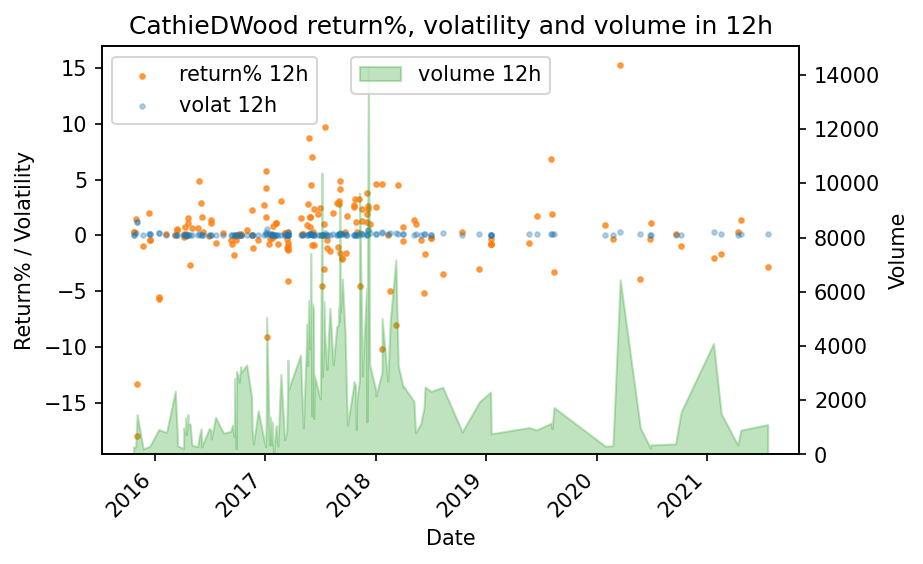

In [41]:
CathieDWood2 = CathieDWood #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["return% 12h"] #return y-axis
y2 = CathieDWood2["volat 12h"] #volatility y-axis
y3 = CathieDWood2["volume 12h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood return%, volatility and volume in 12h")

## Volatility Ratio Graph

In [42]:
CathieDWood_full['volat ratio 10min'] = CathieDWood_full['volat 10m'] / CathieDWood_full['volat 10m_r'] #Make ratio column for volatility
CathieDWood_full['volat ratio 30min'] = CathieDWood_full['volat 30m'] / CathieDWood_full['volat 30m_r']
CathieDWood_full['volat ratio 1h'] = CathieDWood_full['volat 1h'] / CathieDWood_full['volat 1h_r']
CathieDWood_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,1,2021-07-19 20:25:00,"@elonmusk @BitcoinMagazine @jack ""With so many...",3099,30718.48,1.351187,0.020899,0.053030,0.168596,...,1575.610090,0.0,0.024016,0.051955,0.050366,0.062185,0.068295,1.633528,0.785923,0.837965
1,1,15,2021-04-22 04:07:00,"In a research collaboration with $SQ, @yassine...",129323,53917.30,1.221437,-0.139287,0.084184,0.310030,...,2234.706609,0.0,0.217400,0.188645,0.172339,0.193283,0.180643,0.752496,0.723453,0.708476
2,2,22,2021-04-11 12:58:00,The technologically-enabled innovation evolvin...,144630,59597.04,0.005397,0.094552,-0.024666,-0.013272,...,767.416578,0.0,0.053001,0.072760,0.066263,0.071888,0.069235,1.458783,0.838880,1.130751
3,3,50,2021-02-16 04:15:00,Companies disrupting the traditional world ord...,222902,49900.59,51.406600,-0.192623,-0.806483,-1.473009,...,1795.605955,0.0,0.193464,0.153441,0.146702,0.120077,0.126786,1.396266,1.253152,1.171008
4,4,56,2021-01-21 17:09:00,As Chair of the Fed from February 2014 to Febr...,259556,31535.30,11.216149,0.337685,-0.909742,0.572470,...,4407.019504,0.0,0.307452,0.305983,0.272517,0.323483,0.302028,0.882659,0.915650,0.879893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,173,1721,2015-11-04 13:38:00,"Art Laffer, renowned economist, collaborated w...",2899787,496.25,0.109289,0.000000,0.000000,-3.073048,...,2935.859968,0.0,0.552441,0.470887,0.384331,0.411331,0.326048,0.000000,1.236735,1.653901
174,174,1722,2015-11-04 13:35:00,"Chris Burniske, ARK's Bitcoin analyst, talks a...",2899790,500.00,0.028928,0.000000,-0.750000,-3.420000,...,2951.358779,0.0,0.480046,0.448351,0.369147,0.410495,0.323382,0.468705,1.319829,1.713257
175,175,1729,2015-10-30 20:01:00,#Bitcoin regulations in the UK and Australia s...,2906604,327.77,0.000000,0.000000,0.000000,0.000000,...,2092.708380,0.0,0.236141,0.141278,0.151186,0.140329,0.195737,0.000000,0.000000,1.809831
176,176,1740,2015-10-23 21:04:00,.@ARKInvest's #bitcoin analyst Chris Burniske ...,2916621,280.19,0.000000,0.000000,0.000000,0.010707,...,597.068307,0.0,0.000000,0.000000,0.012905,0.016175,0.011604,NaN,inf,0.151468


<ipython-input-43-14cbf1d4452a>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


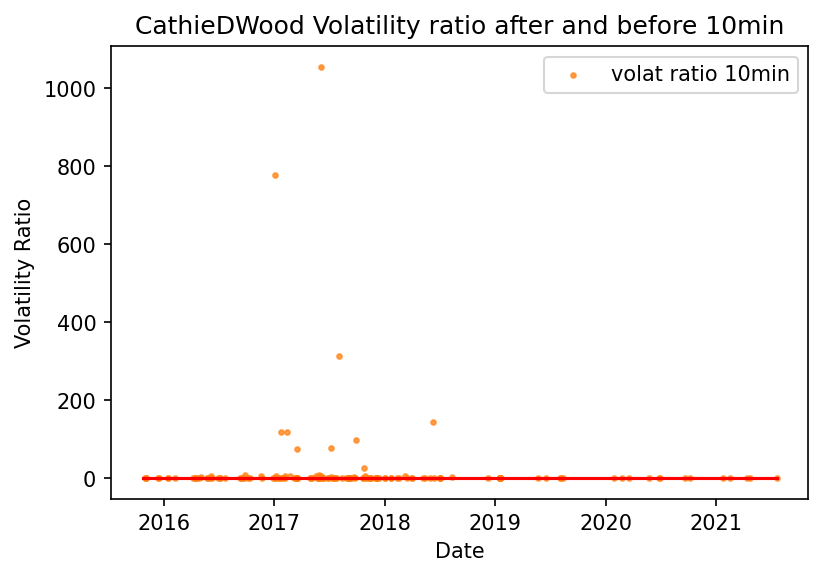

In [43]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volatility ratio after and before 10min")
fig.show()

<ipython-input-44-39c364095fcb>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


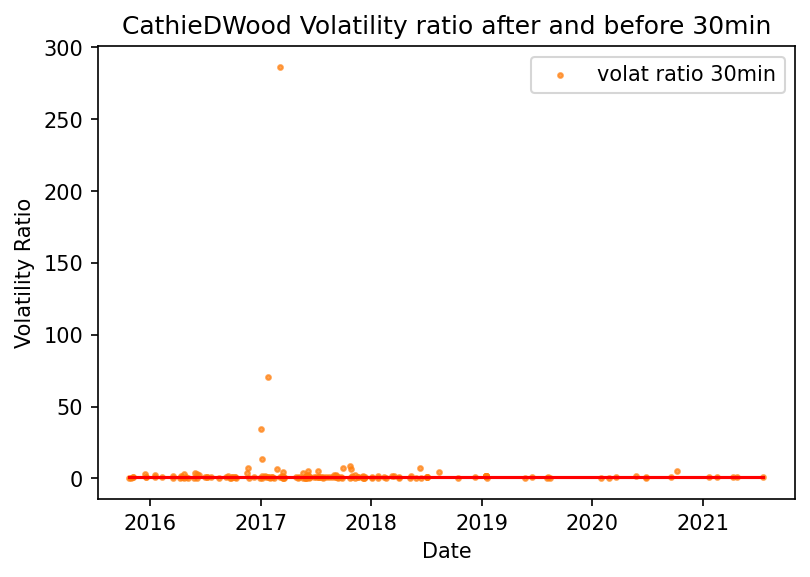

In [44]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volatility ratio after and before 30min")
fig.show()

<ipython-input-45-5a2aca6d2d3d>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


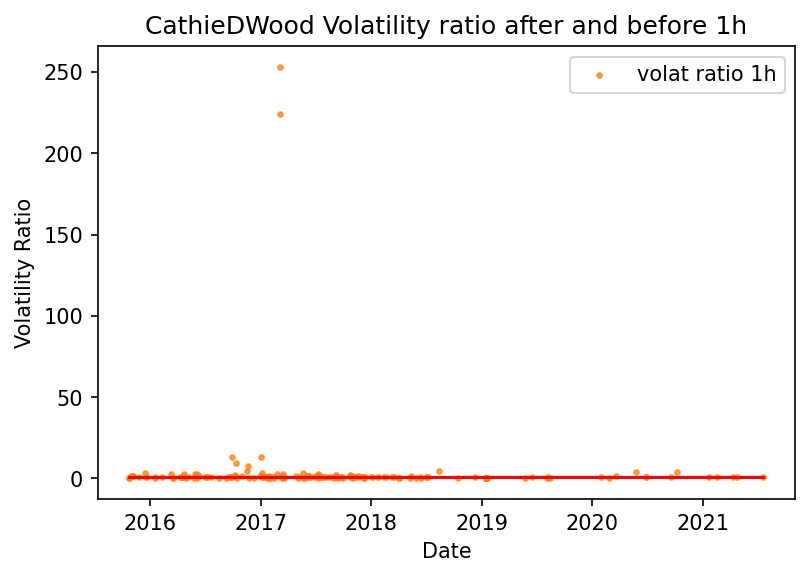

In [45]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [46]:
CathieDWood_full['volume ratio 10min'] = CathieDWood_full['volume 10m'] / CathieDWood_full['volume 10m_r'] #Make ratio column for volume
CathieDWood_full['volume ratio 30min'] = CathieDWood_full['volume 30m'] / CathieDWood_full['volume 30m_r']
CathieDWood_full['volume ratio 1h'] = CathieDWood_full['volume 1h'] / CathieDWood_full['volume 1h_r']
CathieDWood_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,1,2021-07-19 20:25:00,"@elonmusk @BitcoinMagazine @jack ""With so many...",3099,30718.48,1.351187,0.020899,0.053030,0.168596,...,0.051955,0.050366,0.062185,0.068295,1.633528,0.785923,0.837965,1.828192,0.347647,0.705239
1,1,15,2021-04-22 04:07:00,"In a research collaboration with $SQ, @yassine...",129323,53917.30,1.221437,-0.139287,0.084184,0.310030,...,0.188645,0.172339,0.193283,0.180643,0.752496,0.723453,0.708476,0.579137,0.710406,0.618134
2,2,22,2021-04-11 12:58:00,The technologically-enabled innovation evolvin...,144630,59597.04,0.005397,0.094552,-0.024666,-0.013272,...,0.072760,0.066263,0.071888,0.069235,1.458783,0.838880,1.130751,2.580036,2.205509,2.302753
3,3,50,2021-02-16 04:15:00,Companies disrupting the traditional world ord...,222902,49900.59,51.406600,-0.192623,-0.806483,-1.473009,...,0.153441,0.146702,0.120077,0.126786,1.396266,1.253152,1.171008,1.151591,1.247062,0.526611
4,4,56,2021-01-21 17:09:00,As Chair of the Fed from February 2014 to Febr...,259556,31535.30,11.216149,0.337685,-0.909742,0.572470,...,0.305983,0.272517,0.323483,0.302028,0.882659,0.915650,0.879893,0.261362,0.266595,0.315868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,173,1721,2015-11-04 13:38:00,"Art Laffer, renowned economist, collaborated w...",2899787,496.25,0.109289,0.000000,0.000000,-3.073048,...,0.470887,0.384331,0.411331,0.326048,0.000000,1.236735,1.653901,0.046470,1.191629,4.976214
174,174,1722,2015-11-04 13:35:00,"Chris Burniske, ARK's Bitcoin analyst, talks a...",2899790,500.00,0.028928,0.000000,-0.750000,-3.420000,...,0.448351,0.369147,0.410495,0.323382,0.468705,1.319829,1.713257,0.061634,0.623463,1.578561
175,175,1729,2015-10-30 20:01:00,#Bitcoin regulations in the UK and Australia s...,2906604,327.77,0.000000,0.000000,0.000000,0.000000,...,0.141278,0.151186,0.140329,0.195737,0.000000,0.000000,1.809831,0.000000,0.000000,0.407009
176,176,1740,2015-10-23 21:04:00,.@ARKInvest's #bitcoin analyst Chris Burniske ...,2916621,280.19,0.000000,0.000000,0.000000,0.010707,...,0.000000,0.012905,0.016175,0.011604,NaN,inf,0.151468,NaN,0.002062,0.001980


<ipython-input-47-b7d5a56fd202>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


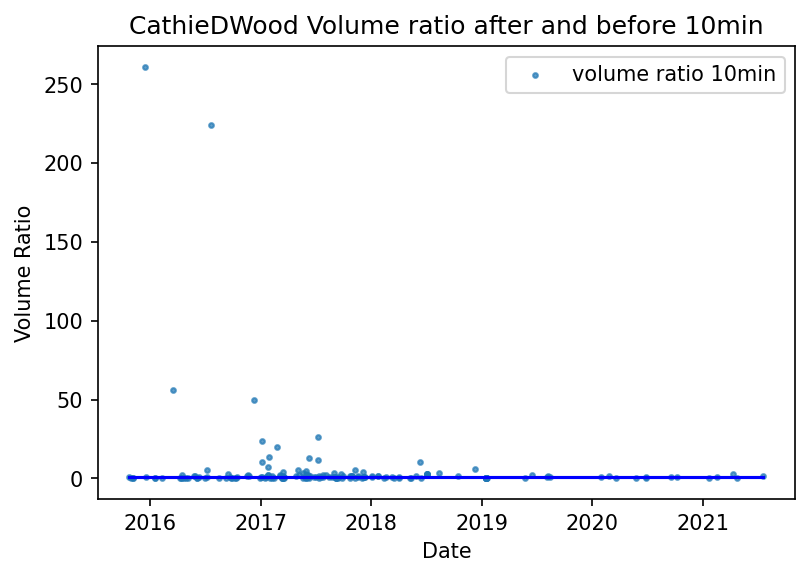

In [47]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volume ratio after and before 10min")
fig.show()

<ipython-input-48-3c36eed35687>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


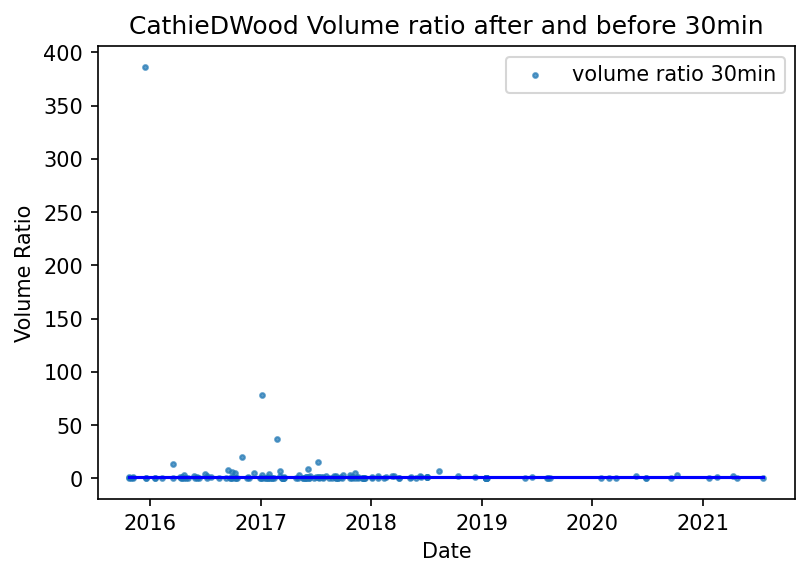

In [48]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volume ratio after and before 30min")
fig.show()

<ipython-input-49-3c9e6597f3fd>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


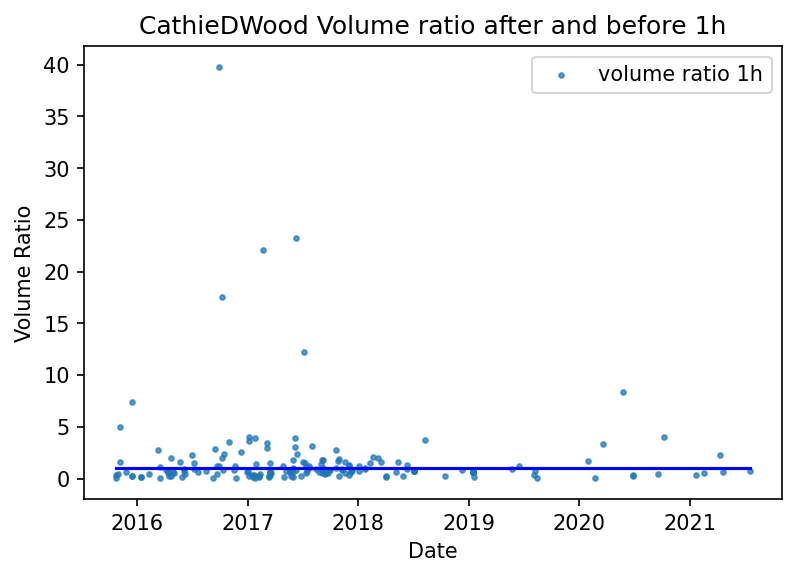

In [49]:
CathieDWood2 = CathieDWood_full #copy
x = CathieDWood2["date"] #x axis
y1 = CathieDWood2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("CathieDWood Volume ratio after and before 1h")
fig.show()

# chamath
## Scatter plot (time vs Return% / Volatility)

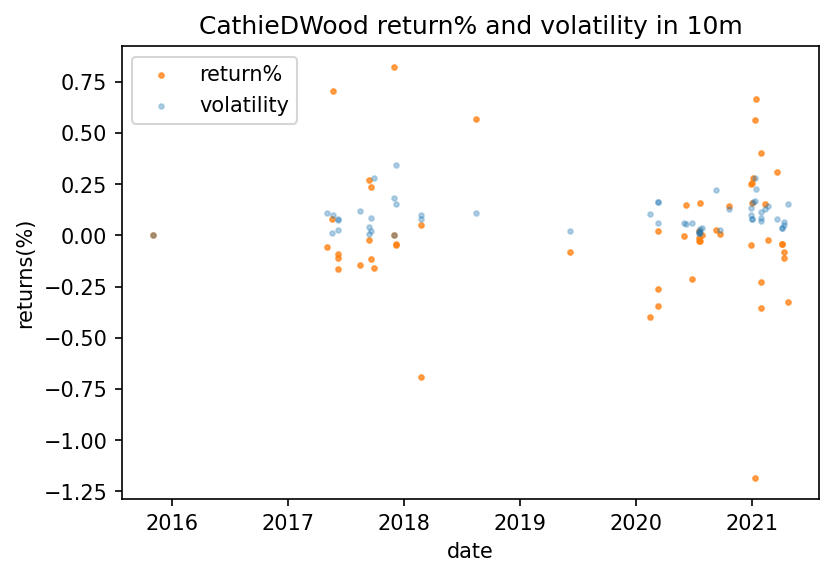

In [50]:
chamath_scatter('return% 10m','volat 10m','CathieDWood return% and volatility in 10m')

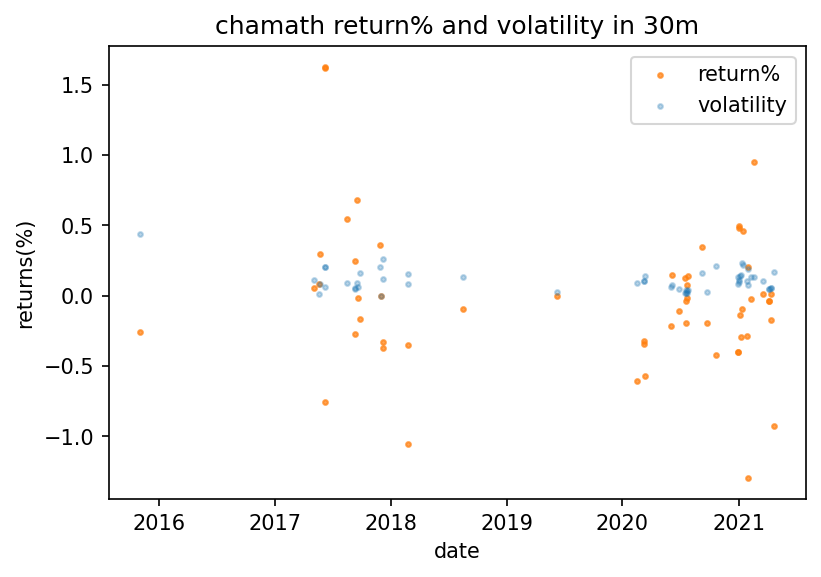

In [51]:
# chamath 30min return and volat
chamath_scatter('return% 30m','volat 30m','chamath return% and volatility in 30m')

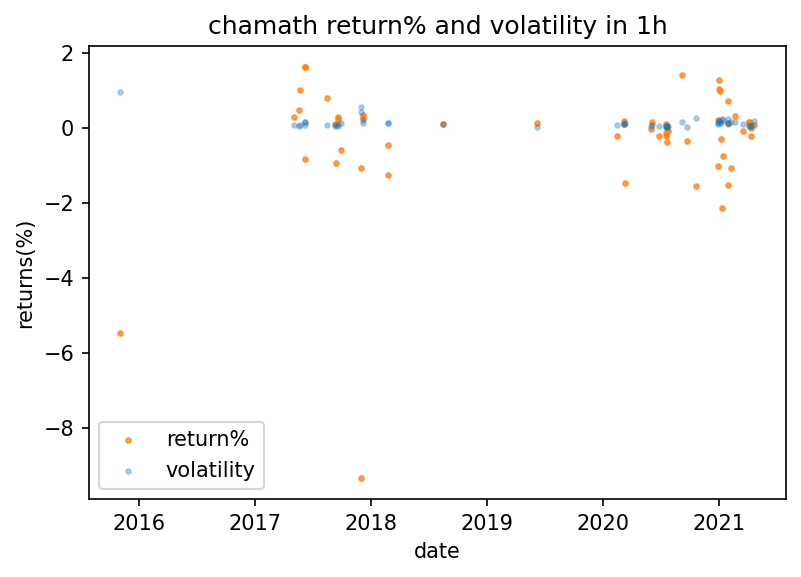

In [52]:
# chamath 1h return and volat
chamath_scatter('return% 1h','volat 1h','chamath return% and volatility in 1h')

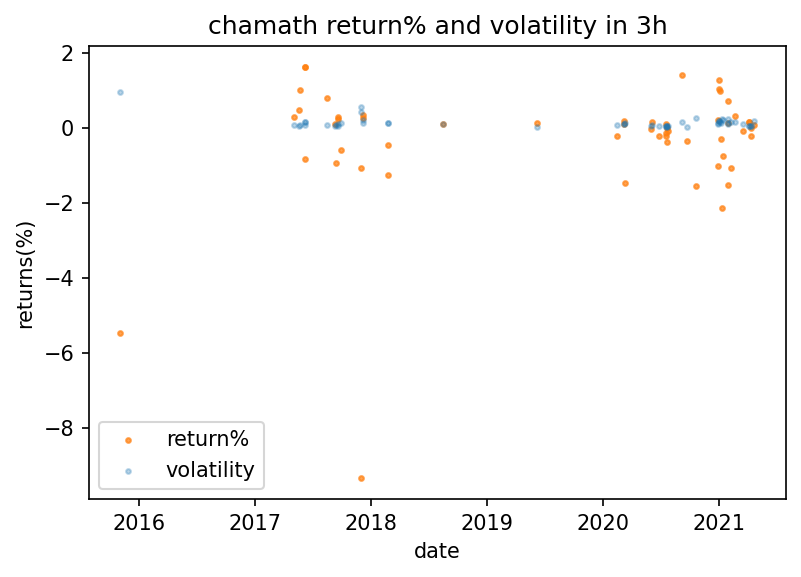

In [53]:
# chamath 1h return and volat
chamath_scatter('return% 1h','volat 1h','chamath return% and volatility in 3h')

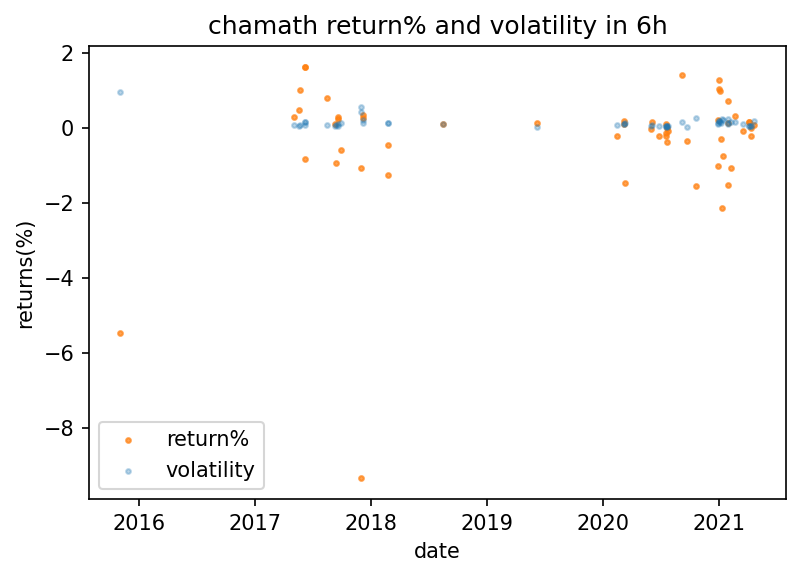

In [54]:
# chamath 1h return and volat
chamath_scatter('return% 1h','volat 1h','chamath return% and volatility in 6h')

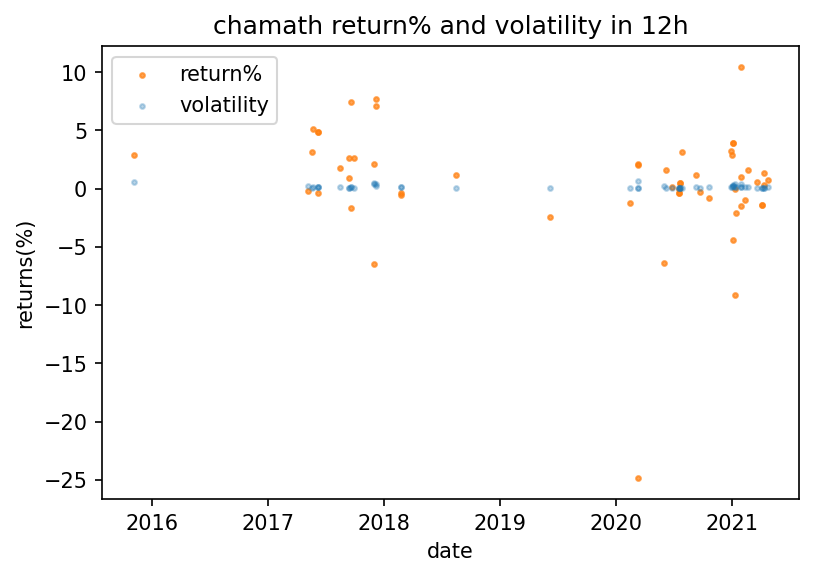

In [55]:
# chamath 1h return and volat
chamath_scatter('return% 12h','volat 12h','chamath return% and volatility in 12h')

## Volume Graph

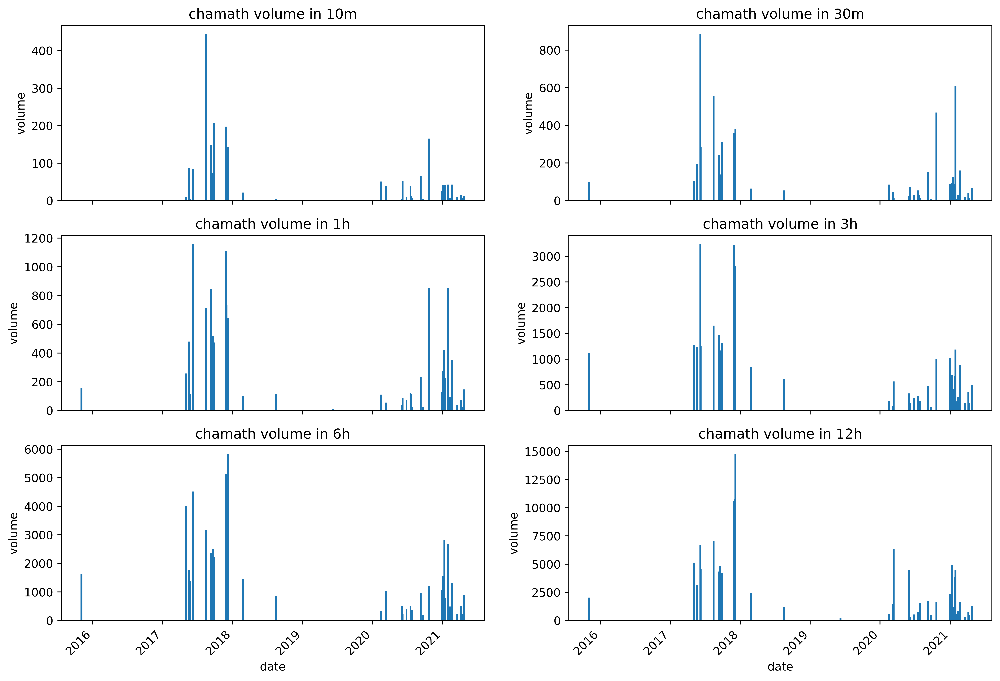

In [56]:
fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
chamathBAR('volume 10m', 'chamath volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
chamathBAR('volume 30m', 'chamath volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
chamathBAR('volume 1h', 'chamath volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
chamathBAR('volume 3h', 'chamath volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
chamathBAR('volume 6h', 'chamath volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
chamathBAR('volume 12h', 'chamath volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merge Graph

Text(0.5, 1.0, 'chamath return%, volatility and volume in 10m')

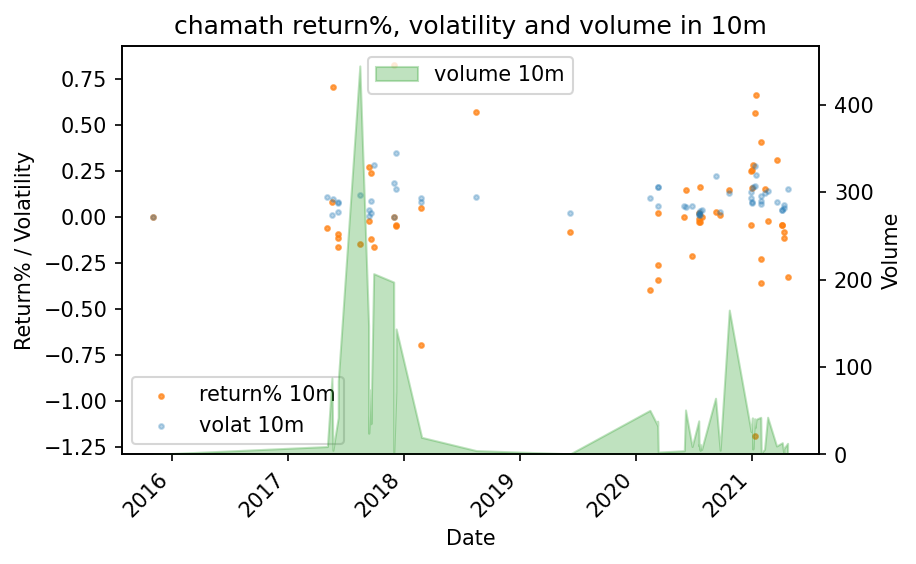

In [57]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 10m"] #return y-axis
y2 = chamath2["volat 10m"] #volatility y-axis
y3 = chamath2["volume 10m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 10m")

Text(0.5, 1.0, 'chamath return%, volatility and volume in 30m')

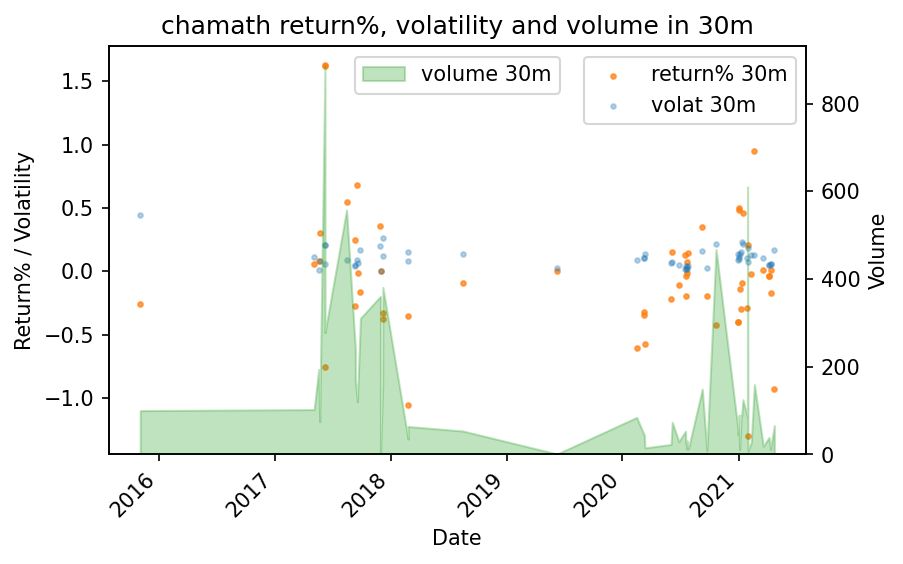

In [58]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 30m"] #return y-axis
y2 = chamath2["volat 30m"] #volatility y-axis
y3 = chamath2["volume 30m"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 30m")

Text(0.5, 1.0, 'chamath return%, volatility and volume in 1h')

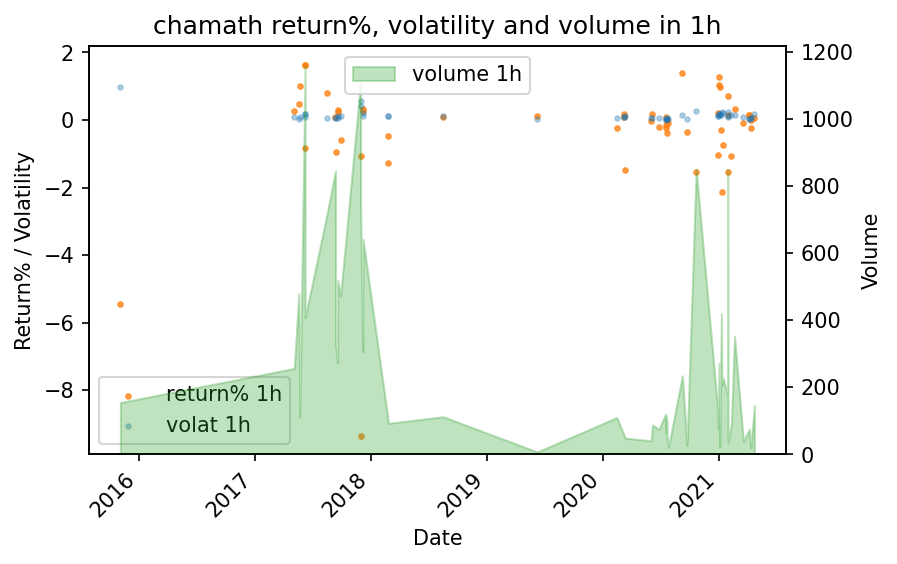

In [59]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 1h"] #return y-axis
y2 = chamath2["volat 1h"] #volatility y-axis
y3 = chamath2["volume 1h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 1h")

Text(0.5, 1.0, 'chamath return%, volatility and volume in 3h')

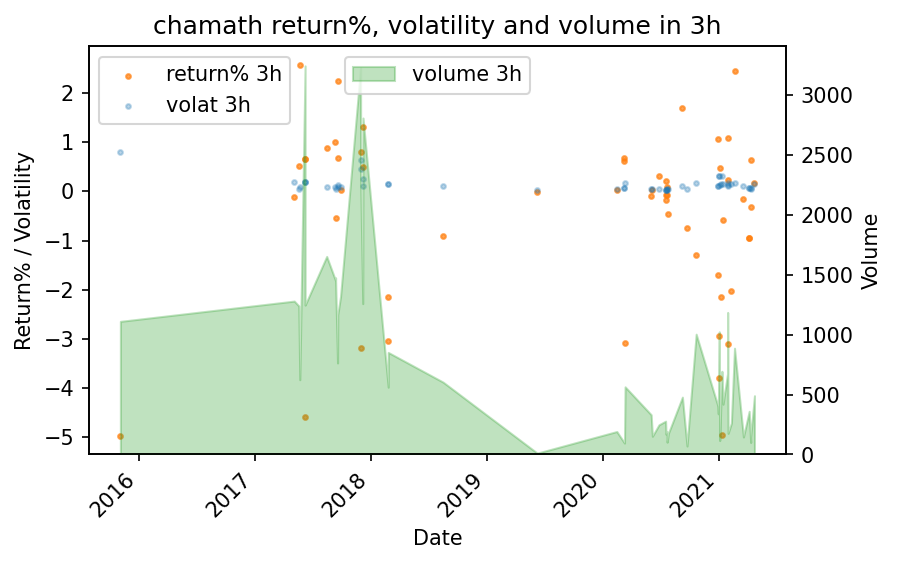

In [60]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 3h"] #return y-axis
y2 = chamath2["volat 3h"] #volatility y-axis
y3 = chamath2["volume 3h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 3h")

Text(0.5, 1.0, 'chamath return%, volatility and volume in 6h')

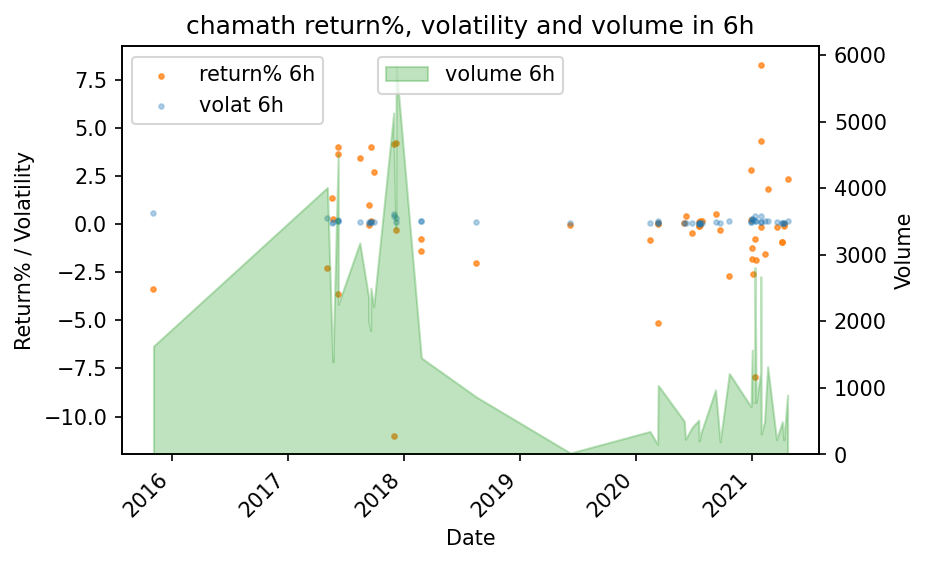

In [61]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 6h"] #return y-axis
y2 = chamath2["volat 6h"] #volatility y-axis
y3 = chamath2["volume 6h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 6h")

Text(0.5, 1.0, 'chamath return%, volatility and volume in 12h')

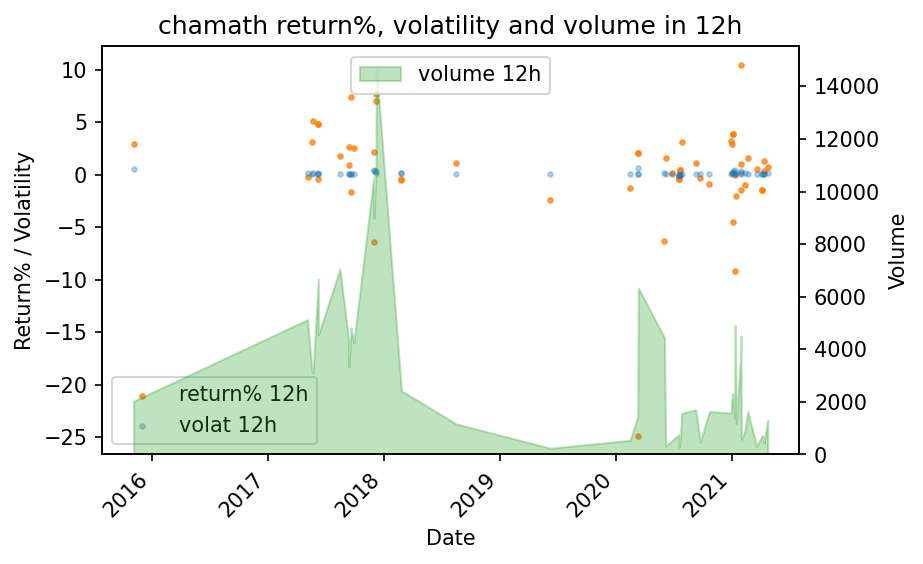

In [62]:
chamath2 = chamath #copy
x = chamath2["date"] #x axis
y1 = chamath2["return% 12h"] #return y-axis
y2 = chamath2["volat 12h"] #volatility y-axis
y3 = chamath2["volume 12h"] #volume y-aixs

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h') #draw scatter graph for return%
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h') #draw scatter graph for volatility
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='best')


ax2 = ax1.twinx() #merge with above graph
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h']) #draw stackplot graph for volume
plt.ylabel('Volume')
ax2.legend(loc='upper center')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath return%, volatility and volume in 12h")

## Volatility Ratio Graph

In [63]:
chamath_full['volat ratio 10min'] = chamath_full['volat 10m'] / chamath_full['volat 10m_r'] #Make ratio column for volatility
chamath_full['volat ratio 30min'] = chamath_full['volat 30m'] / chamath_full['volat 30m_r']
chamath_full['volat ratio 1h'] = chamath_full['volat 1h'] / chamath_full['volat 1h_r']
chamath_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,47,2021-04-23 14:52:00,"Distributed, open source products only become ...",127238,49717.48,0.486154,0.035802,-0.325399,-0.928265,...,5456.605795,0.0,0.134373,0.143535,0.173160,0.165788,0.166172,1.132537,1.178913,0.997238
1,1,66,2021-04-11 17:33:00,@msanvido @warriors 40% since June 2011 exclud...,144355,59865.67,2.874476,-0.006481,-0.079912,0.012077,...,699.830588,0.0,0.065314,0.056696,0.057986,0.056291,0.062634,0.966981,0.979204,0.821693
2,2,71,2021-04-11 16:19:00,Early in $FB (2007) Early in @warriors (2011) ...,144429,59660.56,0.311634,0.047418,-0.112922,-0.173046,...,687.829110,0.0,0.068973,0.072459,0.060719,0.063364,0.066622,0.704275,0.773892,0.875670
3,3,80,2021-04-06 22:41:00,"As it turned out, there was an important secre...",151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,897.539851,0.0,0.043958,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493
4,4,80,2021-04-06 22:41:00,"As it turned out, there was an important secre...",151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,897.539851,0.0,0.043958,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493
5,5,81,2021-04-06 22:41:00,They were investors in BTC with me but I didn’...,151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,897.539851,0.0,0.043958,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493
6,6,81,2021-04-06 22:41:00,They were investors in BTC with me but I didn’...,151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,897.539851,0.0,0.043958,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493
7,7,123,2021-03-19 21:38:00,@surferjimw @novogratz You’re a joke. Both Nov...,177225,58544.20,1.345245,-0.140373,0.307187,0.011888,...,1097.648099,0.0,0.058476,0.109608,0.135161,0.119635,0.105322,1.351931,0.970909,0.683362
8,8,184,2021-02-19 18:29:00,Anyone know the current price of a certain cry...,217728,54880.00,0.640846,-0.033072,-0.021082,0.952861,...,2493.722108,0.0,0.099080,0.086865,0.087606,0.129829,0.108566,1.442789,1.506606,1.681714
9,9,213,2021-02-09 21:11:00,Loss porn: In 2014 I bought an empty lot in La...,231961,47239.02,0.094874,-0.156375,0.153581,-0.021317,...,4031.800473,0.0,0.116831,0.133354,0.129253,0.131407,0.159429,1.099381,0.972695,1.244671


<ipython-input-64-a8572361425a>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


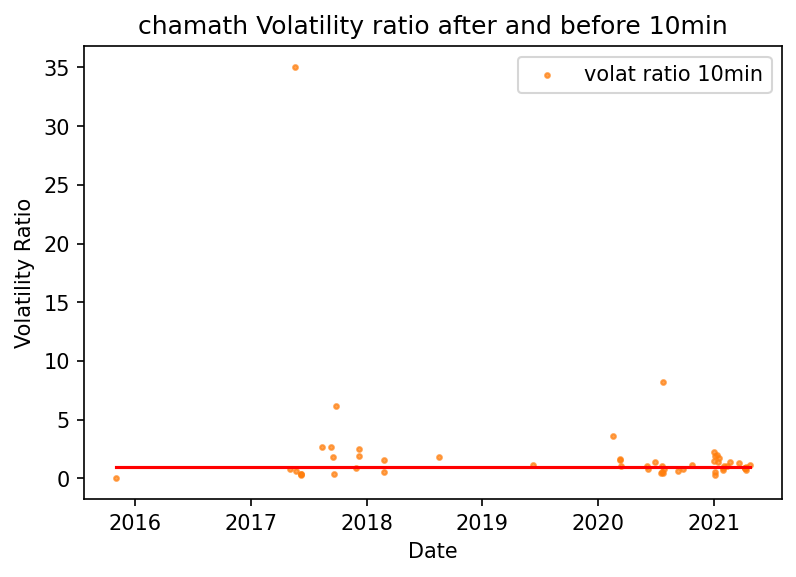

In [64]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volatility ratio after and before 10min")
fig.show()

<ipython-input-65-88b4b109075f>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


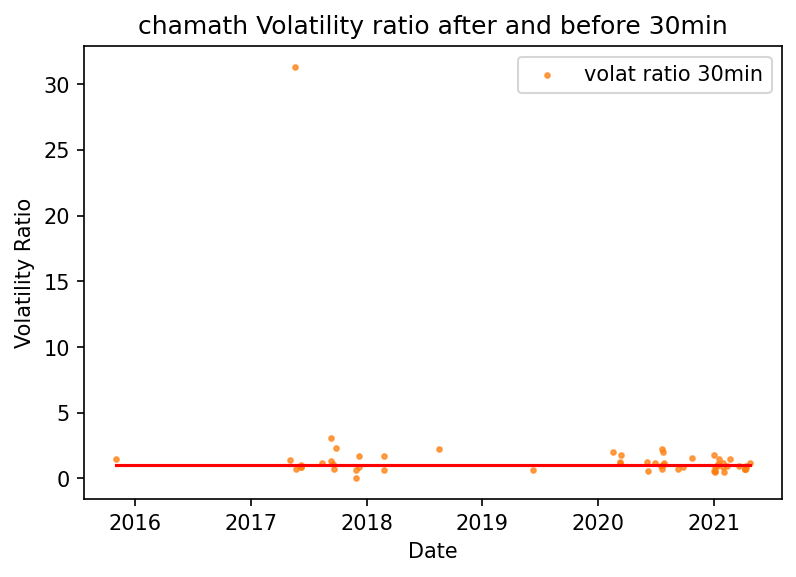

In [65]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volatility ratio after and before 30min")
fig.show()

<ipython-input-66-5818f7bb8990>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


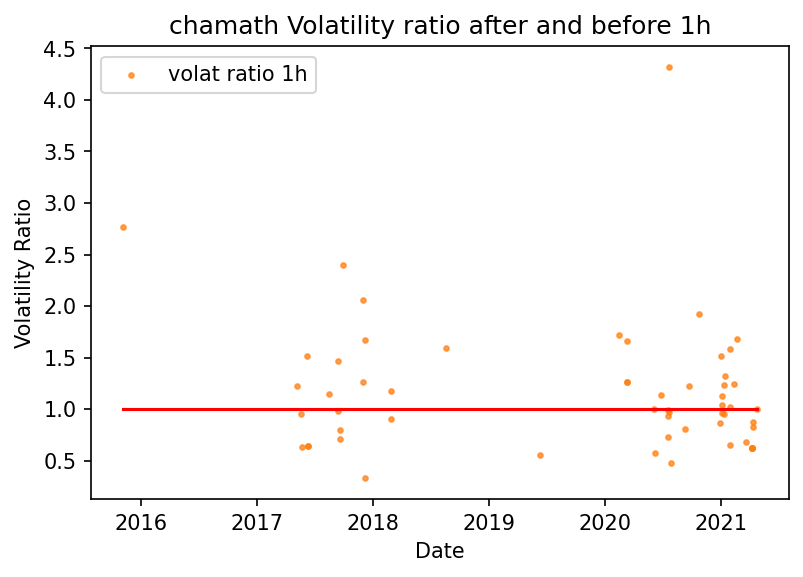

In [66]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [67]:
chamath_full['volume ratio 10min'] = chamath_full['volume 10m'] / chamath_full['volume 10m_r'] #Make ratio column for volume
chamath_full['volume ratio 30min'] = chamath_full['volume 30m'] / chamath_full['volume 30m_r']
chamath_full['volume ratio 1h'] = chamath_full['volume 1h'] / chamath_full['volume 1h_r']
chamath_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,47,2021-04-23 14:52:00,"Distributed, open source products only become ...",127238,49717.48,0.486154,0.035802,-0.325399,-0.928265,...,0.143535,0.173160,0.165788,0.166172,1.132537,1.178913,0.997238,0.900248,1.344746,0.669881
1,1,66,2021-04-11 17:33:00,@msanvido @warriors 40% since June 2011 exclud...,144355,59865.67,2.874476,-0.006481,-0.079912,0.012077,...,0.056696,0.057986,0.056291,0.062634,0.966981,0.979204,0.821693,0.370248,0.460347,0.573046
2,2,71,2021-04-11 16:19:00,Early in $FB (2007) Early in @warriors (2011) ...,144429,59660.56,0.311634,0.047418,-0.112922,-0.173046,...,0.072459,0.060719,0.063364,0.066622,0.704275,0.773892,0.875670,0.667876,1.910225,2.434938
3,3,80,2021-04-06 22:41:00,"As it turned out, there was an important secre...",151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493,1.257405,1.775489,2.468866
4,4,80,2021-04-06 22:41:00,"As it turned out, there was an important secre...",151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493,1.257405,1.775489,2.468866
5,5,81,2021-04-06 22:41:00,They were investors in BTC with me but I didn’...,151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493,1.257405,1.775489,2.468866
6,6,81,2021-04-06 22:41:00,They were investors in BTC with me but I didn’...,151243,58052.64,0.066551,-0.010956,-0.043013,-0.035313,...,0.066240,0.073509,0.069977,0.066553,0.864449,0.749425,0.619493,1.257405,1.775489,2.468866
7,7,123,2021-03-19 21:38:00,@surferjimw @novogratz You’re a joke. Both Nov...,177225,58544.20,1.345245,-0.140373,0.307187,0.011888,...,0.109608,0.135161,0.119635,0.105322,1.351931,0.970909,0.683362,3.382077,1.865325,0.842822
8,8,184,2021-02-19 18:29:00,Anyone know the current price of a certain cry...,217728,54880.00,0.640846,-0.033072,-0.021082,0.952861,...,0.086865,0.087606,0.129829,0.108566,1.442789,1.506606,1.681714,0.819778,1.841545,1.953181
9,9,213,2021-02-09 21:11:00,Loss porn: In 2014 I bought an empty lot in La...,231961,47239.02,0.094874,-0.156375,0.153581,-0.021317,...,0.133354,0.129253,0.131407,0.159429,1.099381,0.972695,1.244671,1.126229,0.304357,0.720082


<ipython-input-68-ac82168b2a9f>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


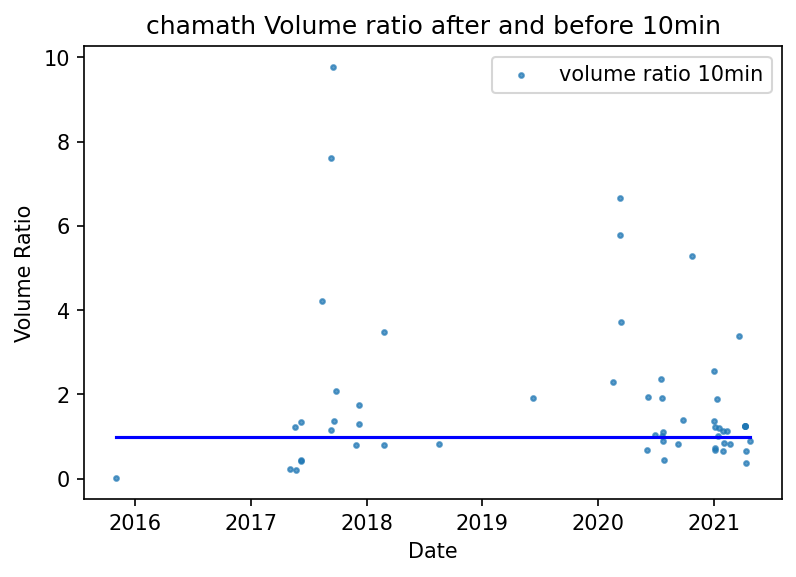

In [68]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volume ratio after and before 10min")
fig.show()

<ipython-input-69-6a3b64194727>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


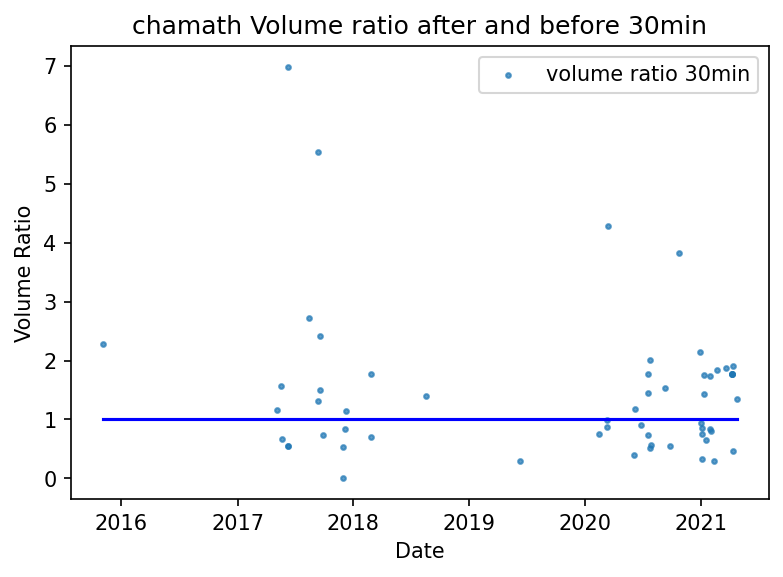

In [69]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volume ratio after and before 30min")
fig.show()

<ipython-input-70-061978dac2ec>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


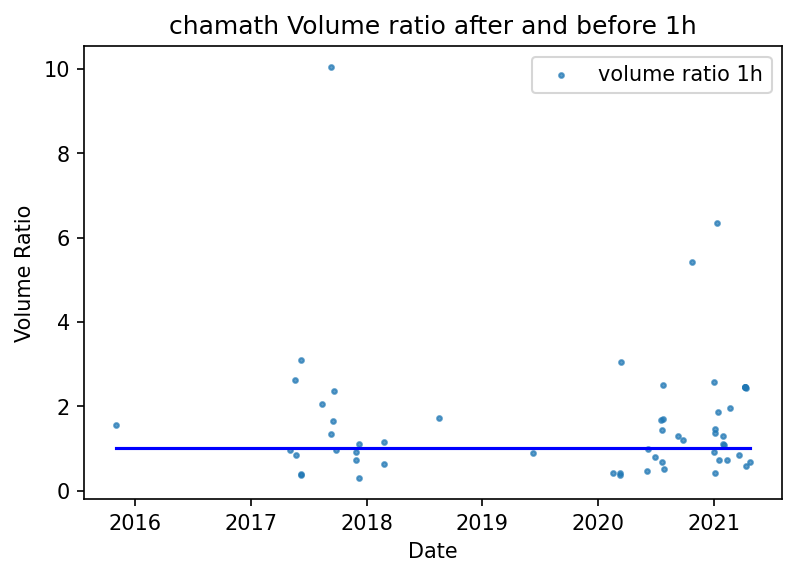

In [70]:
chamath2 = chamath_full #copy
x = chamath2["date"] #x axis
y1 = chamath2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("chamath Volume ratio after and before 1h")
fig.show()

# LilMoonLambo
## Scatter plot (time vs Return% / Volatility)

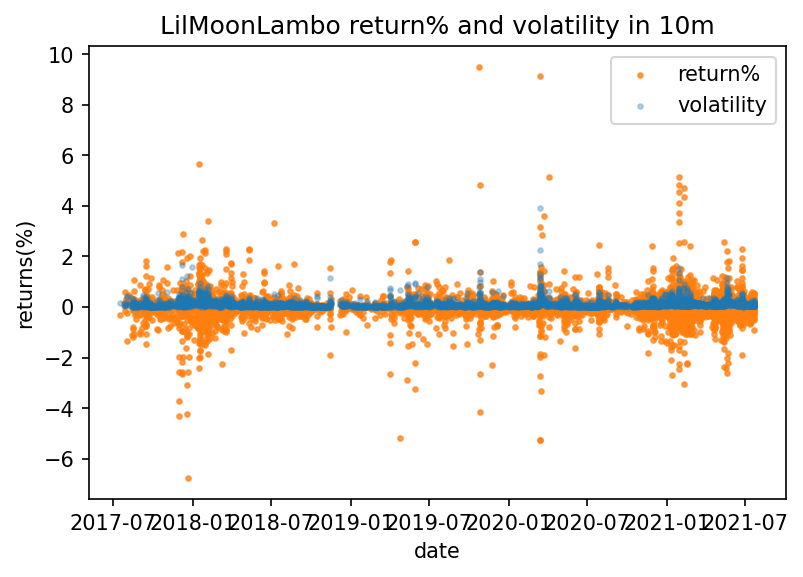

In [71]:
# LilMoonLambo  10min return and volat
LilMoonLambo_scatter('return% 10m','volat 10m','LilMoonLambo return% and volatility in 10m')

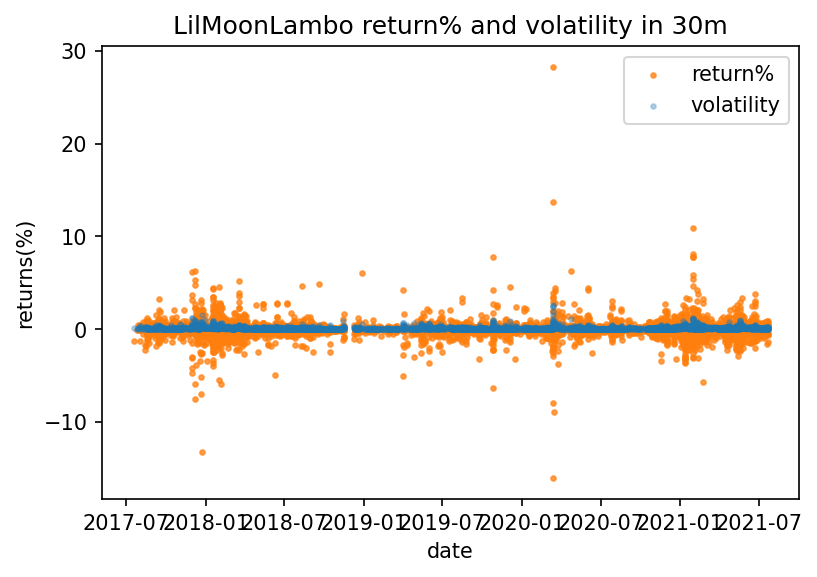

In [72]:
# LilMoonLambo  30min return and volat
LilMoonLambo_scatter('return% 30m','volat 30m','LilMoonLambo return% and volatility in 30m')

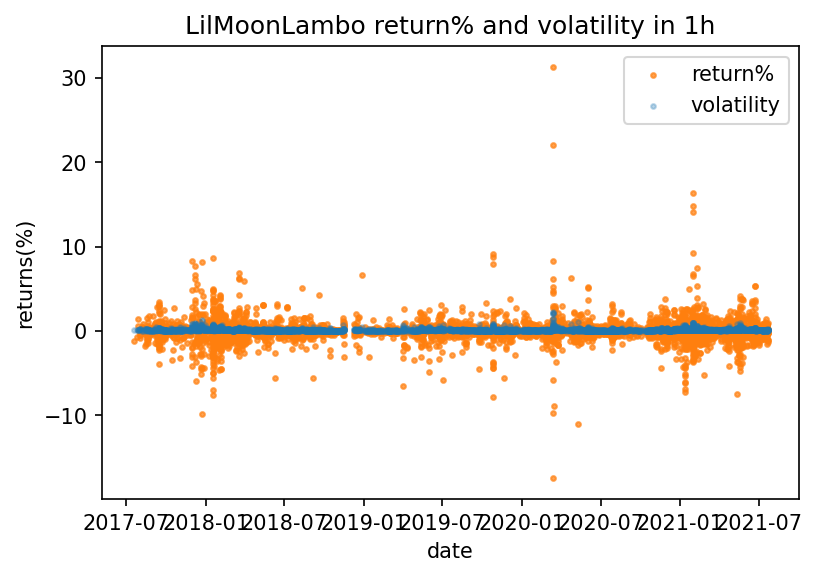

In [73]:
# LilMoonLambo  1h return and volat
LilMoonLambo_scatter('return% 1h','volat 1h','LilMoonLambo return% and volatility in 1h')

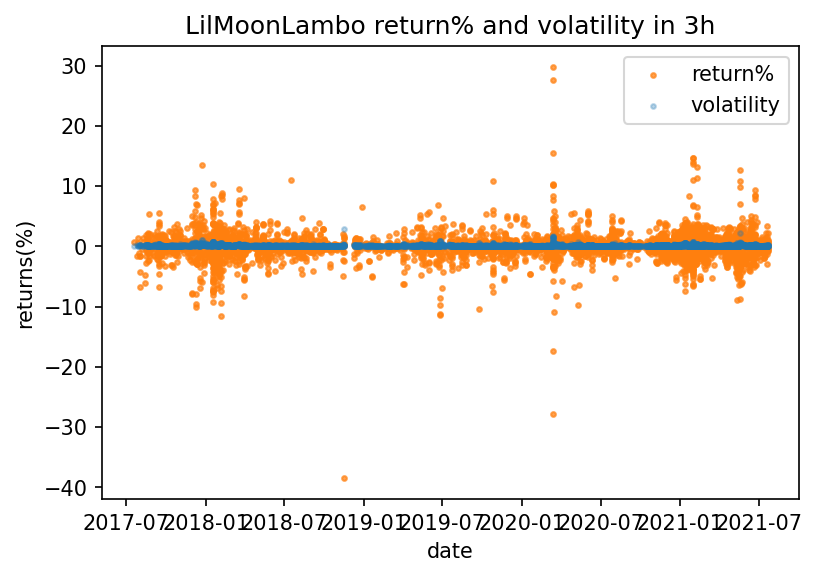

In [74]:
LilMoonLambo_scatter('return% 3h','volat 3h','LilMoonLambo return% and volatility in 3h')

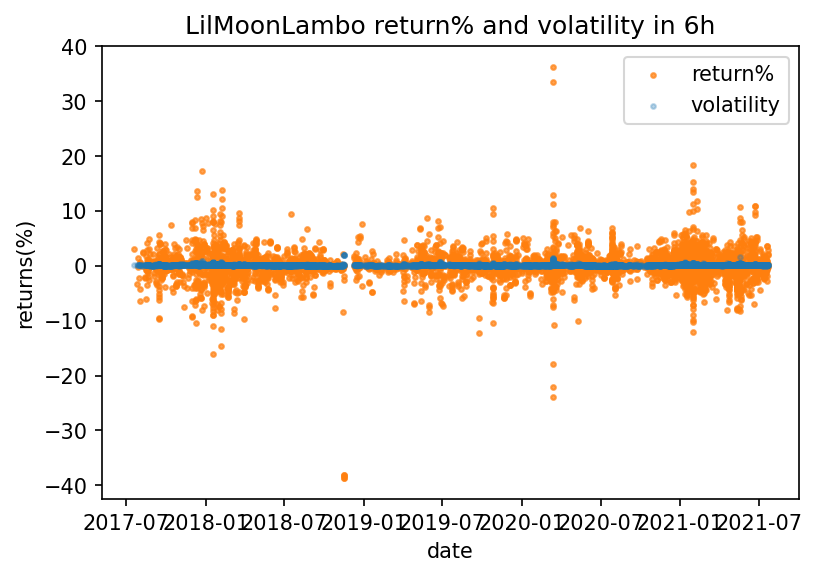

In [75]:
LilMoonLambo_scatter('return% 6h','volat 6h','LilMoonLambo return% and volatility in 6h')

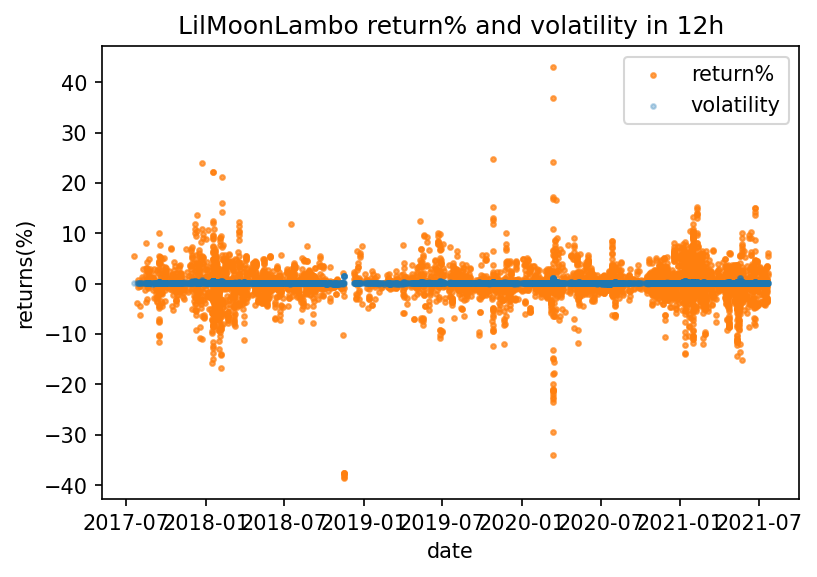

In [76]:
LilMoonLambo_scatter('return% 12h','volat 12h','LilMoonLambo return% and volatility in 12h')

## Volume Graph

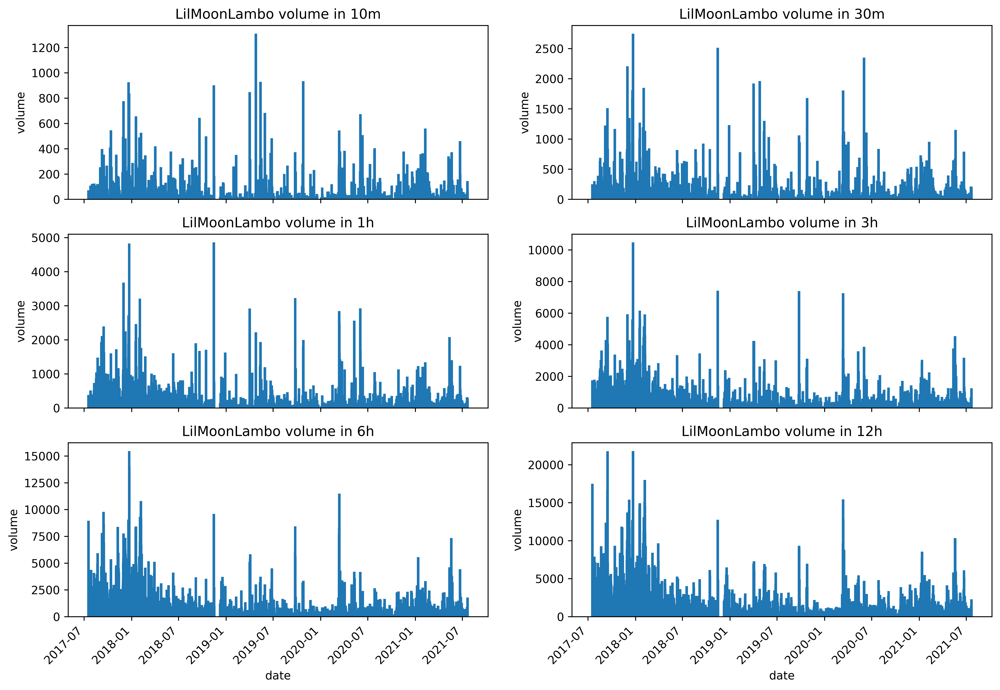

In [77]:
fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
LilMoonLamboBAR('volume 10m', 'LilMoonLambo volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
LilMoonLamboBAR('volume 30m', 'LilMoonLambo volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
LilMoonLamboBAR('volume 1h', 'LilMoonLambo volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
LilMoonLamboBAR('volume 3h', 'LilMoonLambo volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
LilMoonLamboBAR('volume 6h', 'LilMoonLambo volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
LilMoonLamboBAR('volume 12h', 'LilMoonLambo volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merged Graph

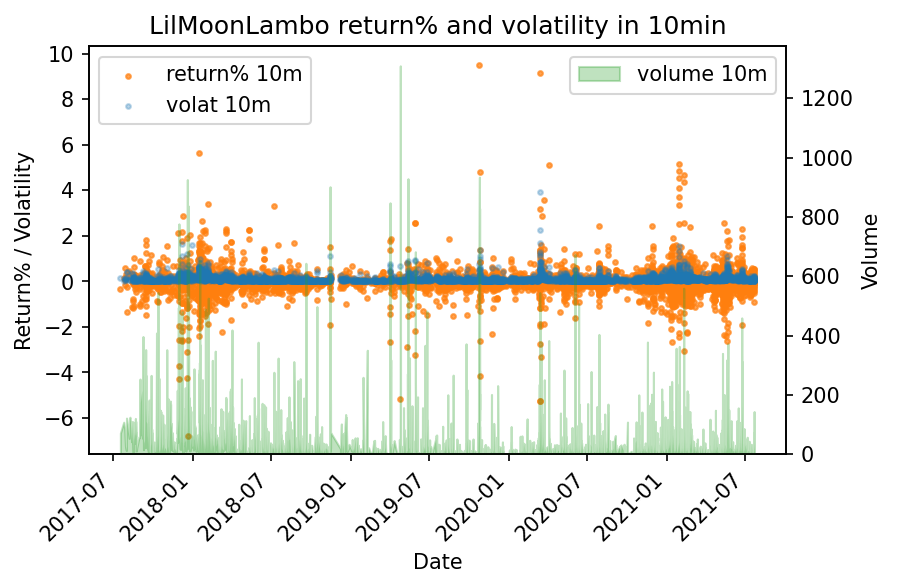

In [78]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 10m"]
y2 = LilMoonLambo2["volat 10m"]
y3 = LilMoonLambo2["volume 10m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 10min")
plt.show()

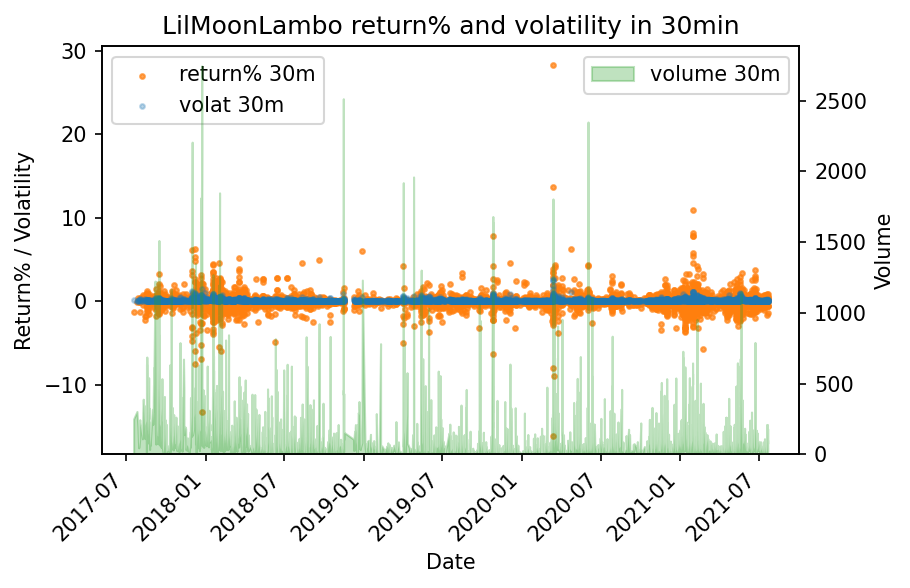

In [79]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 30m"]
y2 = LilMoonLambo2["volat 30m"]
y3 = LilMoonLambo2["volume 30m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 30min")
plt.show()

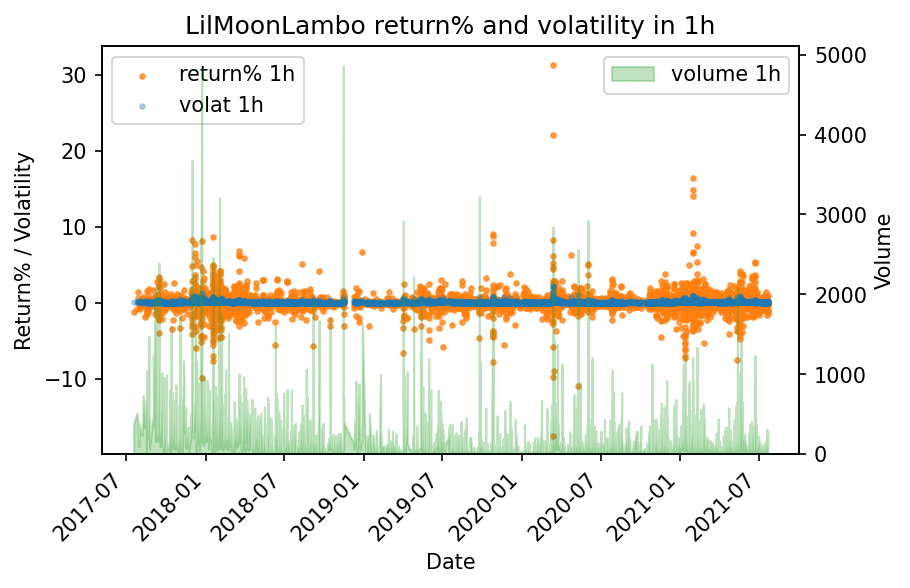

In [80]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 1h"]
y2 = LilMoonLambo2["volat 1h"]
y3 = LilMoonLambo2["volume 1h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 1h")
plt.show()

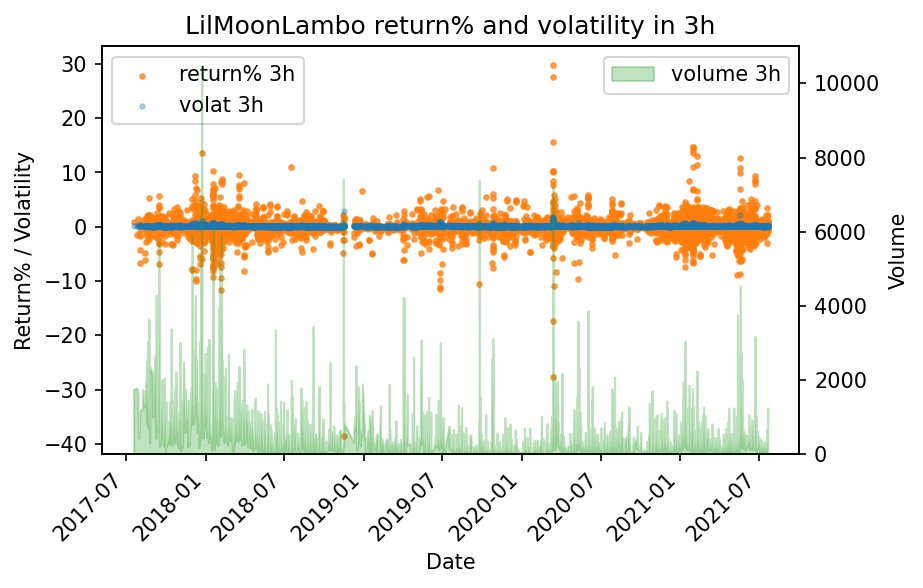

In [81]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 3h"]
y2 = LilMoonLambo2["volat 3h"]
y3 = LilMoonLambo2["volume 3h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 3h")
plt.show()

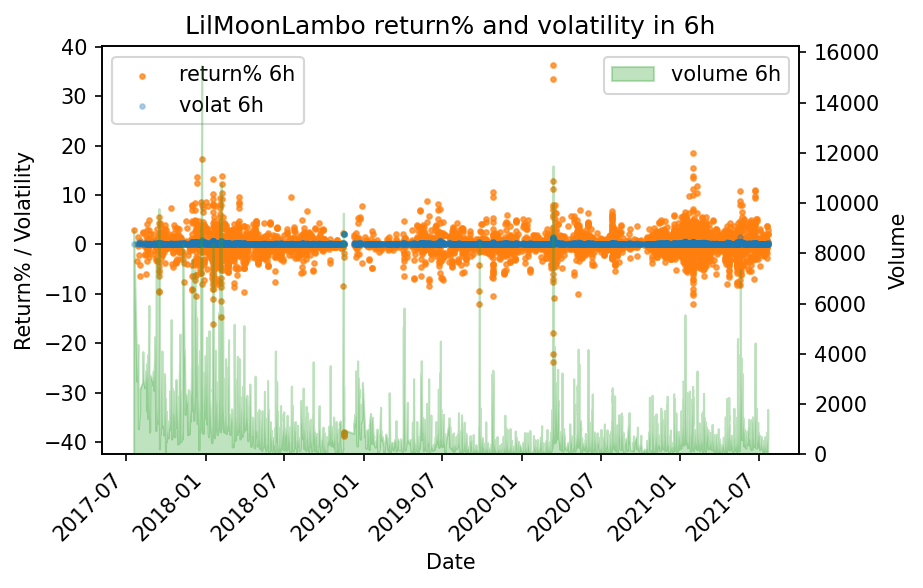

In [82]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 6h"]
y2 = LilMoonLambo2["volat 6h"]
y3 = LilMoonLambo2["volume 6h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 6h")
plt.show()

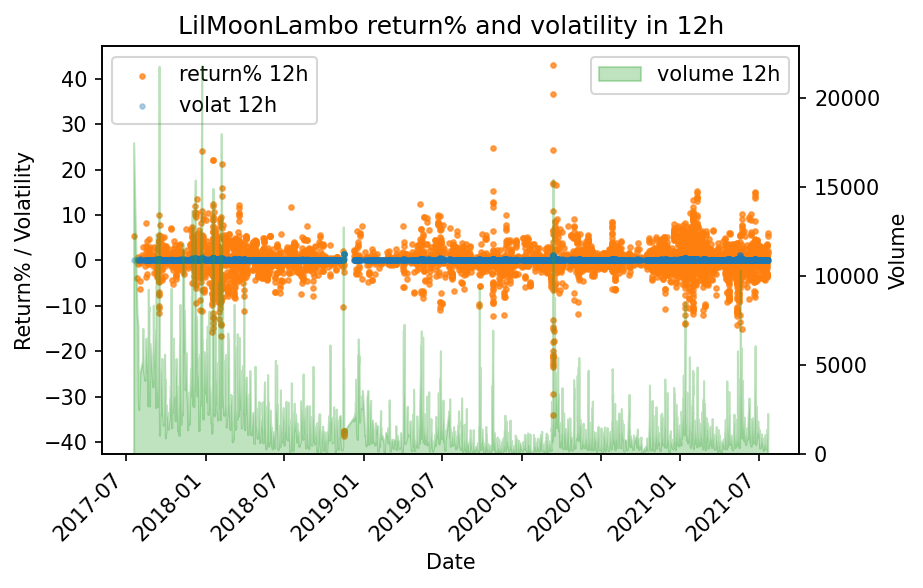

In [83]:
LilMoonLambo2 = LilMoonLambo
x = LilMoonLambo2["date"]
y1 = LilMoonLambo2["return% 12h"]
y2 = LilMoonLambo2["volat 12h"]
y3 = LilMoonLambo2["volume 12h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo return% and volatility in 12h")
plt.show()

## Volatility Ratio Graph

In [84]:
LilMoonLambo_full['volat ratio 10min'] = LilMoonLambo_full['volat 10m'] / LilMoonLambo_full['volat 10m_r'] #Make ratio column for volatility
LilMoonLambo_full['volat ratio 30min'] = LilMoonLambo_full['volat 30m'] / LilMoonLambo_full['volat 30m_r']
LilMoonLambo_full['volat ratio 1h'] = LilMoonLambo_full['volat 1h'] / LilMoonLambo_full['volat 1h_r']
LilMoonLambo_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,82,2021-07-21 23:20:00,@callumth11 @MistNft @PopDoge_BSC bro you're u...,44,32055.73,0.019061,-0.057213,0.084291,0.294113,...,3122.355762,0.0,0.124240,0.100475,0.094067,0.100553,0.174304,0.423838,0.563898,NaN
1,1,90,2021-07-21 20:55:00,@elonmusk @therationalroot It's coming to #Bit...,189,31923.99,16.293767,-0.143998,-0.513626,-0.574270,...,3150.828443,0.0,0.196914,0.151775,0.129312,0.229090,0.179310,0.401336,0.478542,0.665317
2,2,95,2021-07-21 19:01:00,Anyone else notice the #Bitcoin tee Elon Musk ...,303,31931.14,3.027500,0.212081,-0.903194,-0.518459,...,3022.703138,0.0,0.173917,0.157447,0.339564,0.220980,0.164302,1.264478,1.216161,0.463676
3,3,97,2021-07-21 18:52:00,when you short the #Bitcoin bottom before the ...,312,32137.74,5.339670,-0.110898,-0.432140,-0.536565,...,2957.944746,0.0,0.095952,0.308100,0.333763,0.217048,0.161676,2.016272,0.652316,0.512710
4,4,98,2021-07-21 18:40:00,“Tesla will resume accepting BTC” - Elon Musk 🚀,324,32118.30,3.937231,0.082850,0.169779,-1.357544,...,2901.307146,0.0,0.191728,0.454760,0.334519,0.216636,0.161071,0.494219,0.388584,0.494077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5766,5766,30504,2017-07-30 02:53:00,"coinbase if messing up with my $btc purchases,...",1987472,2700.39,7.761819,0.193676,-0.166272,-0.061102,...,7394.930253,0.0,0.060782,0.061403,0.073056,0.103795,0.108900,2.591437,2.174922,1.332822
5767,5767,30508,2017-07-29 05:03:00,"@XryptoWolfe Good to know, I do see btc riding...",1988782,2713.13,1.148276,0.046072,0.053444,0.043861,...,12581.993045,0.0,0.128319,0.141192,0.182059,0.136478,0.112893,0.724961,0.387116,0.367568
5768,5768,30516,2017-07-28 07:50:00,"Sold all my alts for $btc, this storm is too u...",1990055,2720.24,0.121437,0.045952,0.576787,0.430109,...,10563.487615,0.0,0.050113,0.056908,0.052129,0.043968,0.048079,1.602687,1.513303,2.083203
5769,5769,30528,2017-07-26 01:40:00,"@crypto_hodler BTC but if not that, AntShares ...",1993305,2557.05,3.145310,0.000000,0.156039,-0.070003,...,23280.259362,0.0,0.054570,0.062061,0.077583,0.101149,0.154589,0.653057,0.861399,1.764573


<ipython-input-85-3dba41f71e1f>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


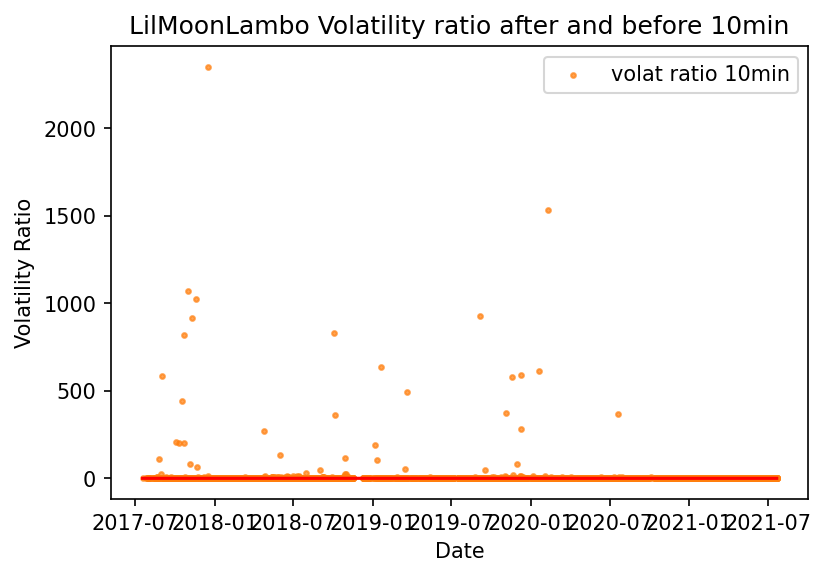

In [85]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volatility ratio after and before 10min")
fig.show()

<ipython-input-86-b29aeb95e112>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


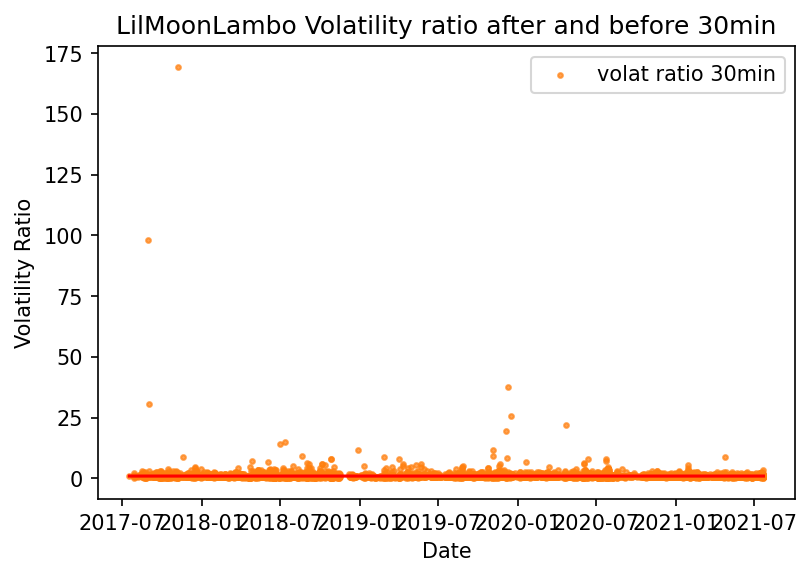

In [86]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volatility ratio after and before 30min")
fig.show()

<ipython-input-87-bcc649a50e46>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


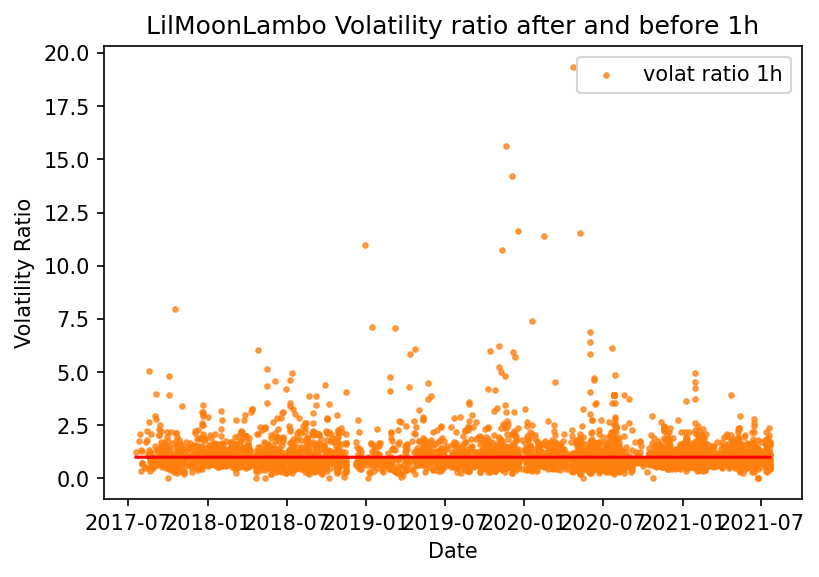

In [87]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [88]:
LilMoonLambo_full['volume ratio 10min'] = LilMoonLambo_full['volume 10m'] / LilMoonLambo_full['volume 10m_r'] #Make ratio column for volume
LilMoonLambo_full['volume ratio 30min'] = LilMoonLambo_full['volume 30m'] / LilMoonLambo_full['volume 30m_r']
LilMoonLambo_full['volume ratio 1h'] = LilMoonLambo_full['volume 1h'] / LilMoonLambo_full['volume 1h_r']
LilMoonLambo_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,82,2021-07-21 23:20:00,@callumth11 @MistNft @PopDoge_BSC bro you're u...,44,32055.73,0.019061,-0.057213,0.084291,0.294113,...,0.100475,0.094067,0.100553,0.174304,0.423838,0.563898,NaN,0.102431,0.668564,NaN
1,1,90,2021-07-21 20:55:00,@elonmusk @therationalroot It's coming to #Bit...,189,31923.99,16.293767,-0.143998,-0.513626,-0.574270,...,0.151775,0.129312,0.229090,0.179310,0.401336,0.478542,0.665317,0.993357,0.761628,0.606002
2,2,95,2021-07-21 19:01:00,Anyone else notice the #Bitcoin tee Elon Musk ...,303,31931.14,3.027500,0.212081,-0.903194,-0.518459,...,0.157447,0.339564,0.220980,0.164302,1.264478,1.216161,0.463676,0.564687,0.461530,0.226357
3,3,97,2021-07-21 18:52:00,when you short the #Bitcoin bottom before the ...,312,32137.74,5.339670,-0.110898,-0.432140,-0.536565,...,0.308100,0.333763,0.217048,0.161676,2.016272,0.652316,0.512710,1.232506,0.405476,0.298880
4,4,98,2021-07-21 18:40:00,“Tesla will resume accepting BTC” - Elon Musk 🚀,324,32118.30,3.937231,0.082850,0.169779,-1.357544,...,0.454760,0.334519,0.216636,0.161071,0.494219,0.388584,0.494077,0.273343,0.242588,0.356601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5766,5766,30504,2017-07-30 02:53:00,"coinbase if messing up with my $btc purchases,...",1987472,2700.39,7.761819,0.193676,-0.166272,-0.061102,...,0.061403,0.073056,0.103795,0.108900,2.591437,2.174922,1.332822,2.001980,1.154568,1.142145
5767,5767,30508,2017-07-29 05:03:00,"@XryptoWolfe Good to know, I do see btc riding...",1988782,2713.13,1.148276,0.046072,0.053444,0.043861,...,0.141192,0.182059,0.136478,0.112893,0.724961,0.387116,0.367568,1.110253,0.565056,0.277049
5768,5768,30516,2017-07-28 07:50:00,"Sold all my alts for $btc, this storm is too u...",1990055,2720.24,0.121437,0.045952,0.576787,0.430109,...,0.056908,0.052129,0.043968,0.048079,1.602687,1.513303,2.083203,1.658142,1.065599,1.518747
5769,5769,30528,2017-07-26 01:40:00,"@crypto_hodler BTC but if not that, AntShares ...",1993305,2557.05,3.145310,0.000000,0.156039,-0.070003,...,0.062061,0.077583,0.101149,0.154589,0.653057,0.861399,1.764573,1.120887,1.840005,1.369416


<ipython-input-89-ba3925f4cdc6>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


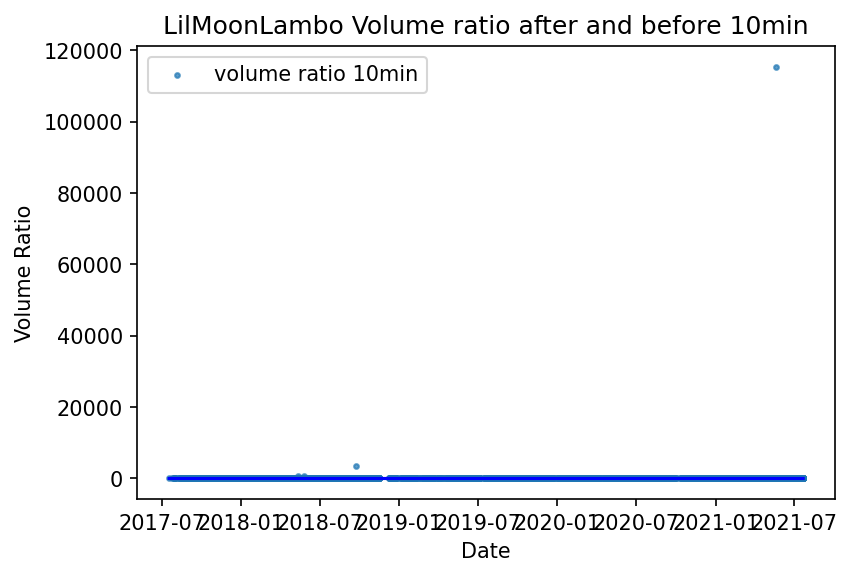

In [89]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volume ratio after and before 10min")
fig.show()

<ipython-input-90-e842c3e1928b>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


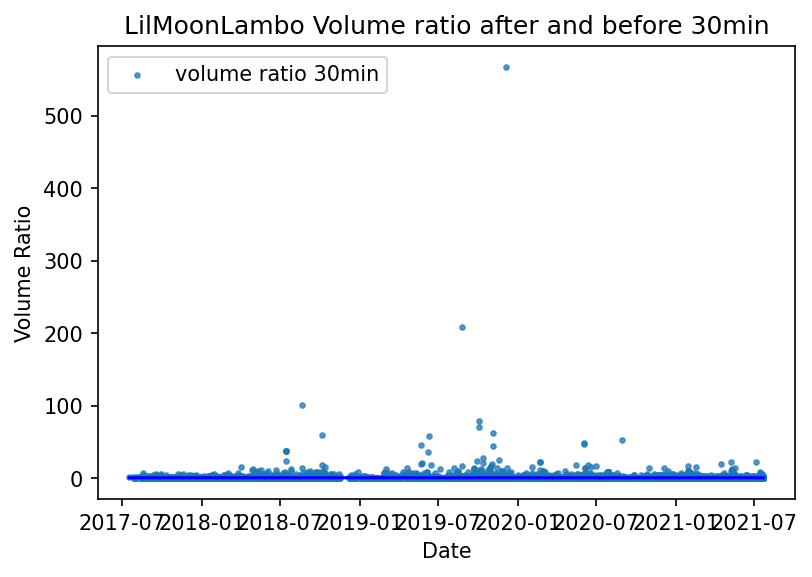

In [90]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volume ratio after and before 30min")
fig.show()

<ipython-input-91-3ff43f50eb4d>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


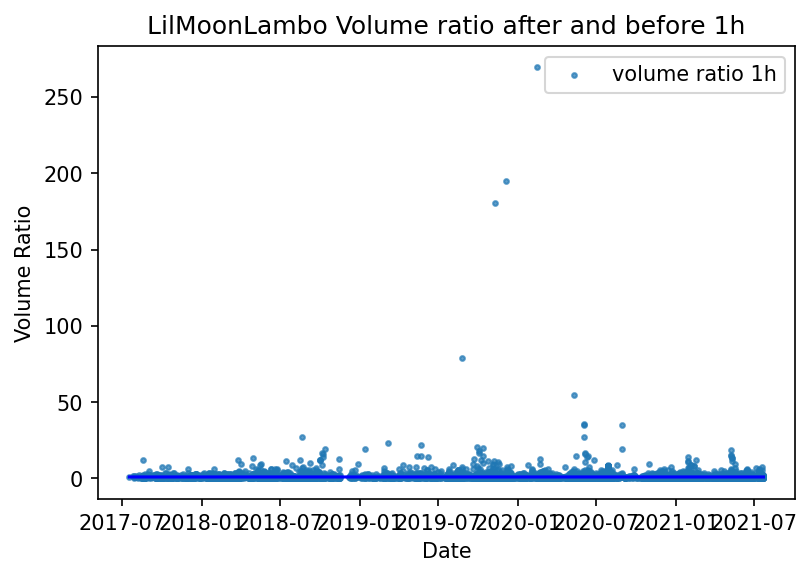

In [91]:
LilMoonLambo2 = LilMoonLambo_full #copy
x = LilMoonLambo2["date"] #x axis
y1 = LilMoonLambo2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("LilMoonLambo Volume ratio after and before 1h")
fig.show()

# Tyler
## Scatter plot (time vs Return% / Volatility)

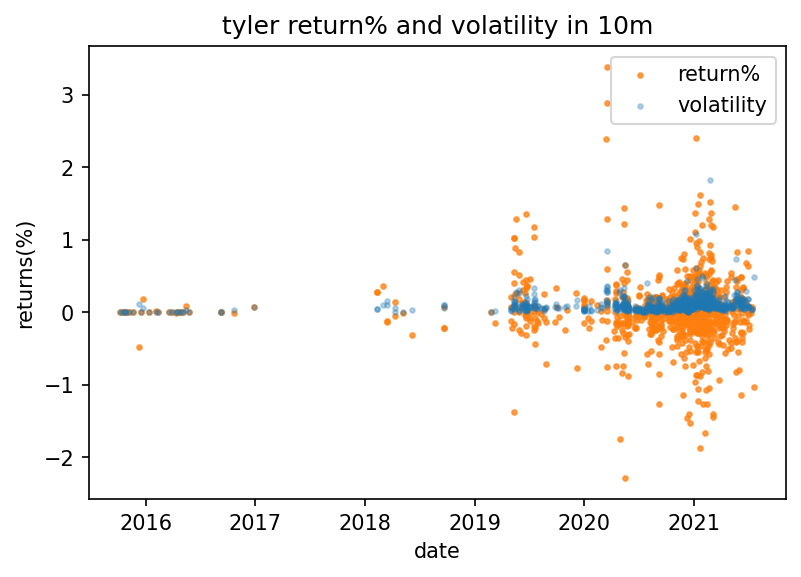

In [92]:
# tyler  10min return and volat
tyler_scatter('return% 10m','volat 10m','tyler return% and volatility in 10m')

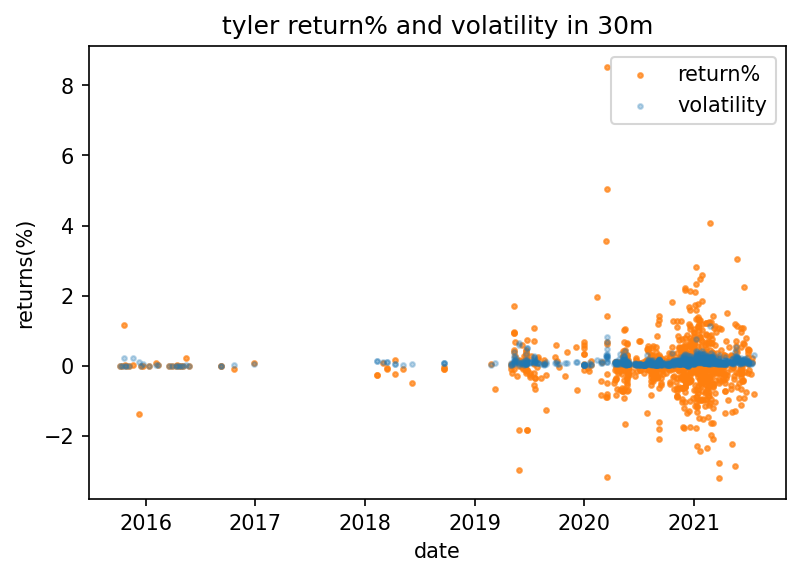

In [93]:
# tyler  30min return and volat
tyler_scatter('return% 30m','volat 30m','tyler return% and volatility in 30m')

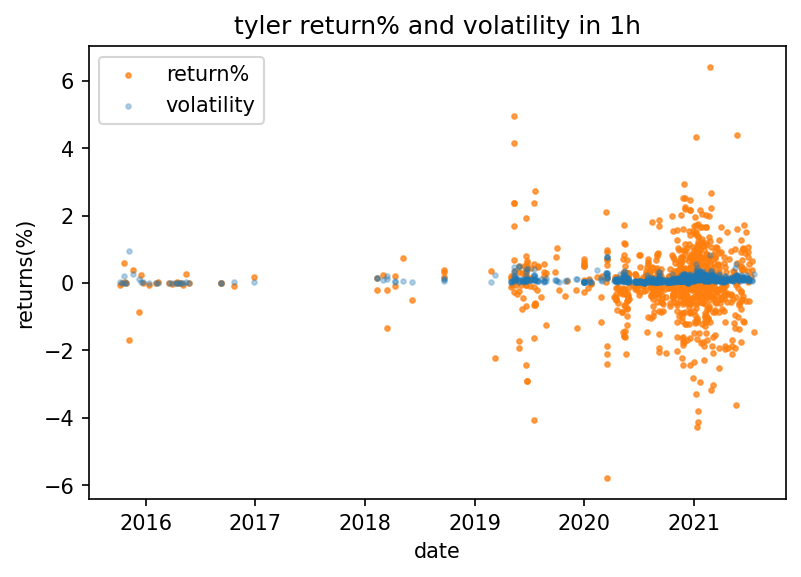

In [94]:
# tyler  1h return and volat
tyler_scatter('return% 1h','volat 1h','tyler return% and volatility in 1h')

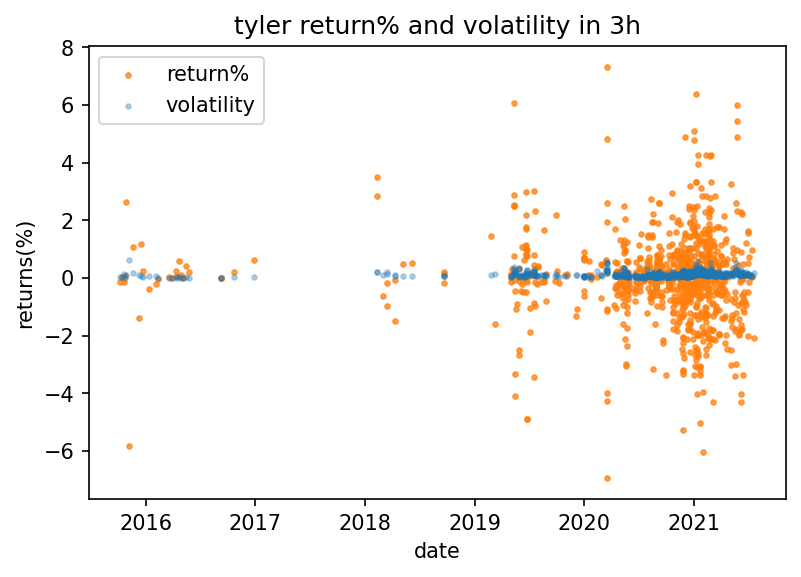

In [95]:

tyler_scatter('return% 3h','volat 3h','tyler return% and volatility in 3h')

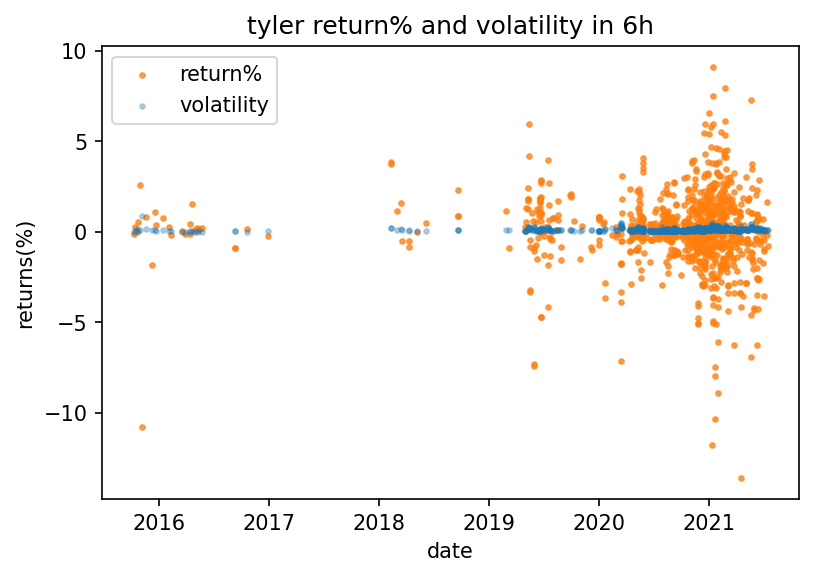

In [96]:

tyler_scatter('return% 6h','volat 6h','tyler return% and volatility in 6h')

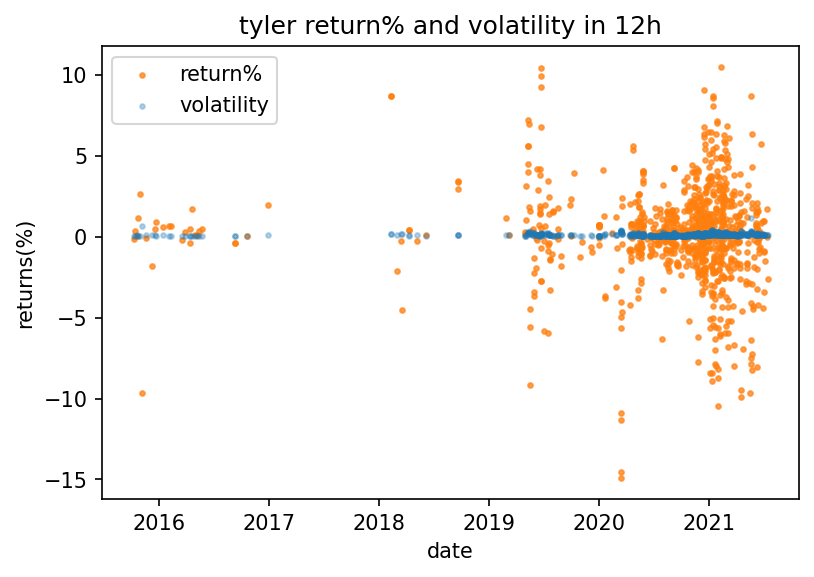

In [97]:

tyler_scatter('return% 12h','volat 12h','tyler return% and volatility in 12h')

## Volume Graph

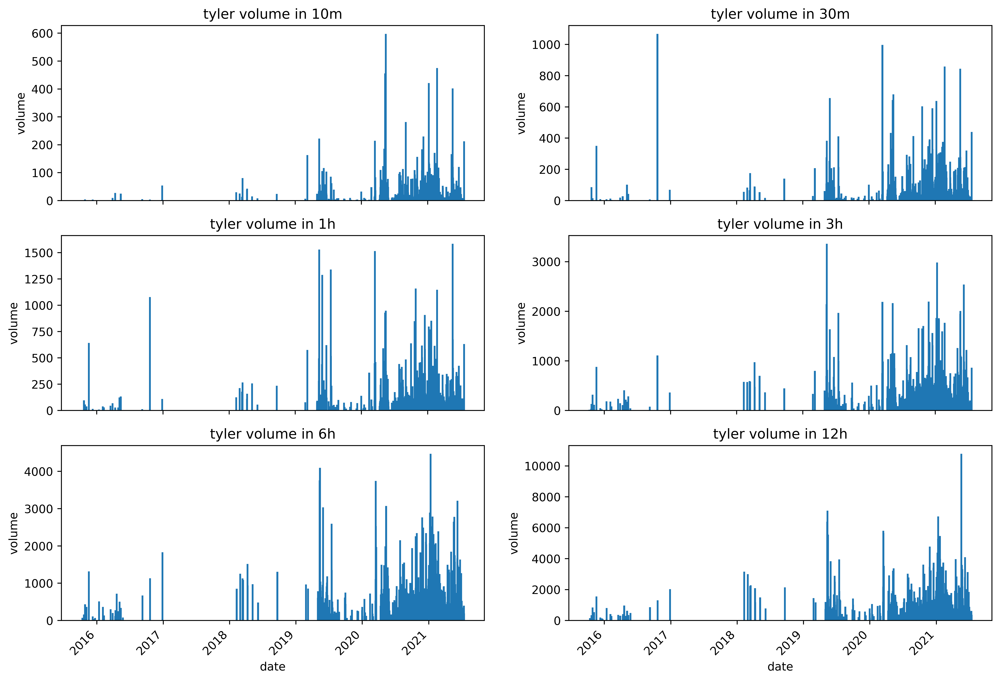

In [98]:
fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
tylerBAR('volume 10m', 'tyler volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
tylerBAR('volume 30m', 'tyler volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
tylerBAR('volume 1h', 'tyler volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
tylerBAR('volume 3h', 'tyler volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
tylerBAR('volume 6h', 'tyler volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
tylerBAR('volume 12h', 'tyler volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

# Merge Graph

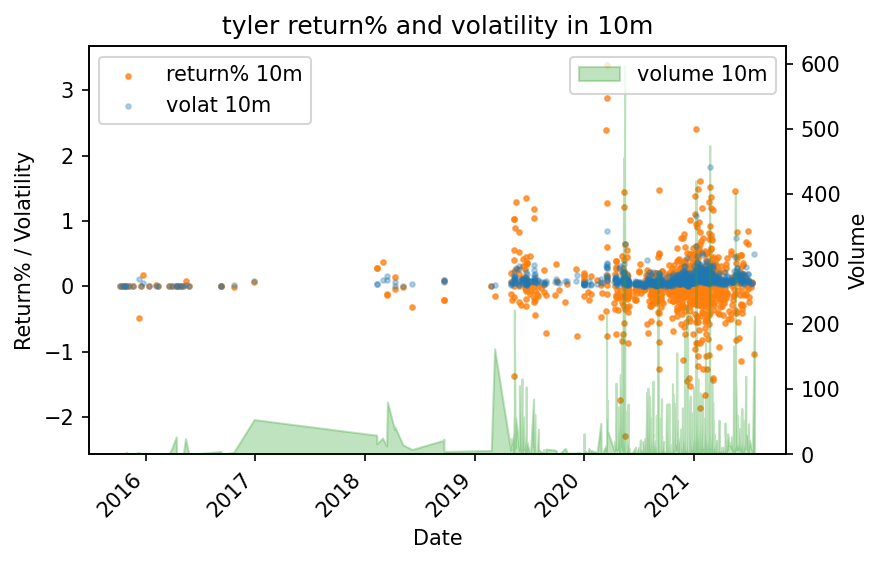

In [99]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 10m"]
y2 = tyler2["volat 10m"]
y3 = tyler2["volume 10m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 10m")
plt.show()

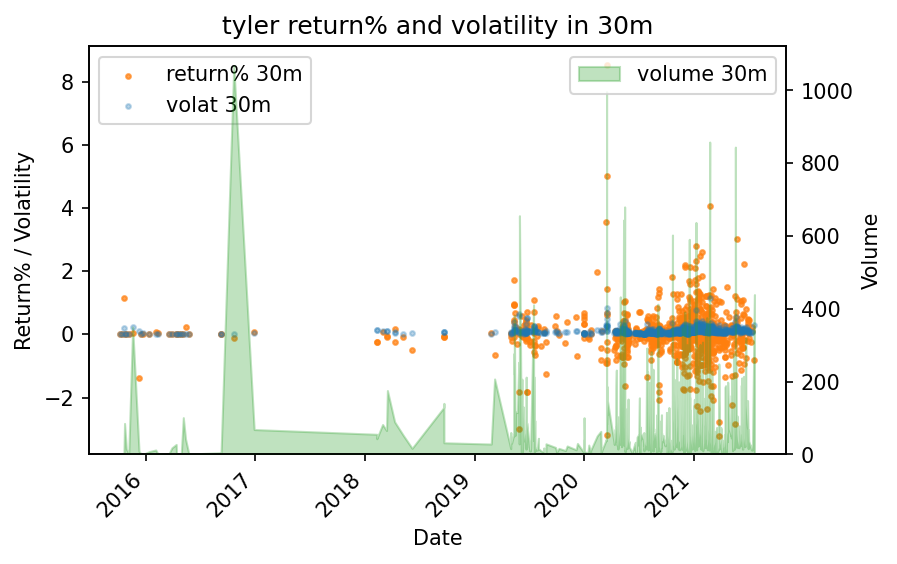

In [100]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 30m"]
y2 = tyler2["volat 30m"]
y3 = tyler2["volume 30m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 30m")
plt.show()

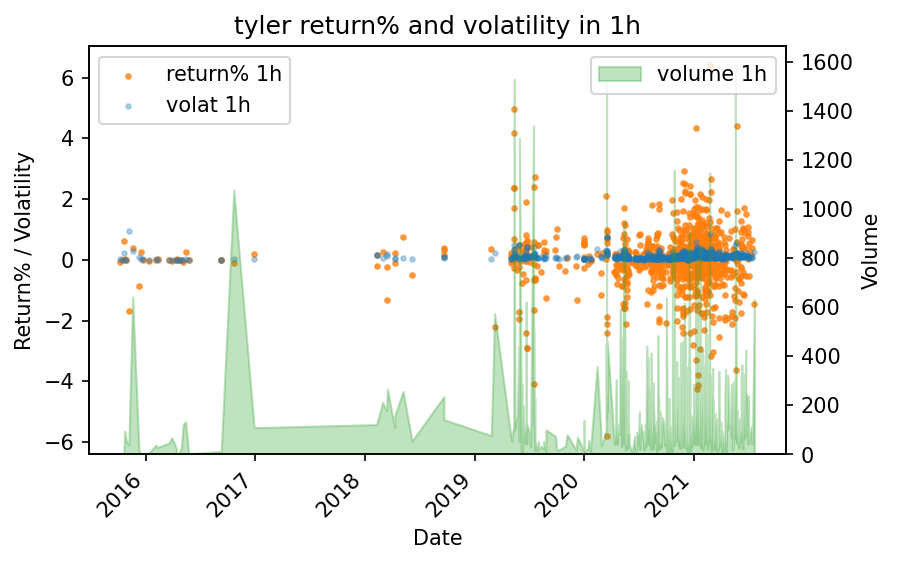

In [101]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 1h"]
y2 = tyler2["volat 1h"]
y3 = tyler2["volume 1h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 1h")
plt.show()

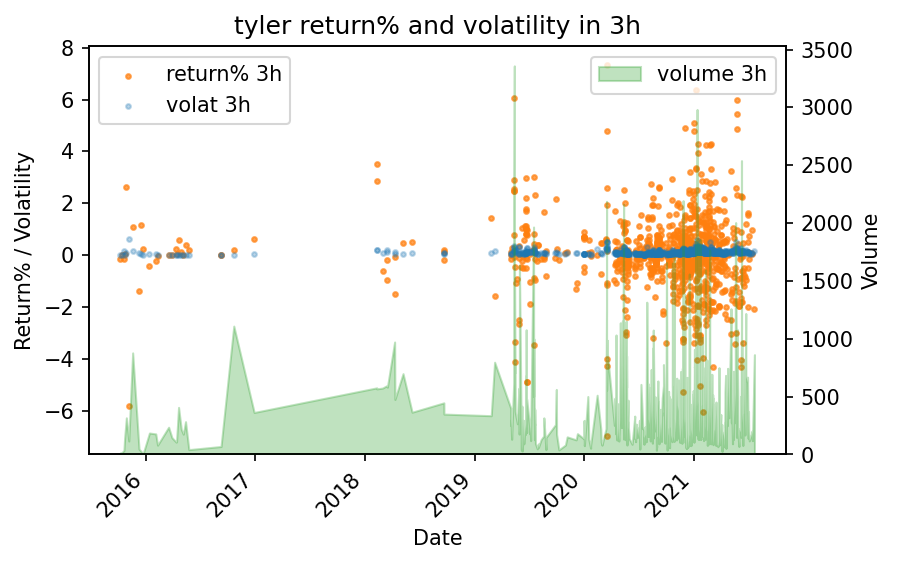

In [102]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 3h"]
y2 = tyler2["volat 3h"]
y3 = tyler2["volume 3h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 3h")
plt.show()

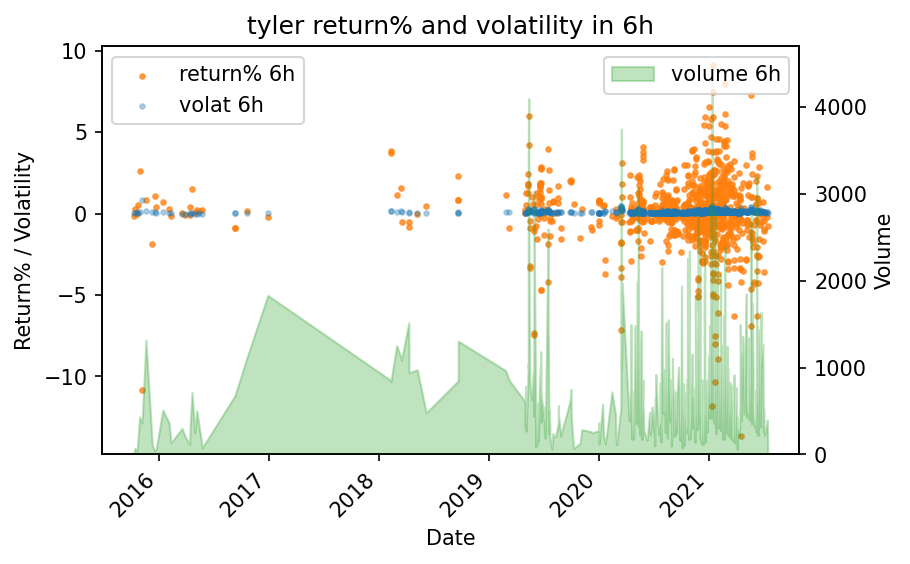

In [103]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 6h"]
y2 = tyler2["volat 6h"]
y3 = tyler2["volume 6h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 6h")
plt.show()

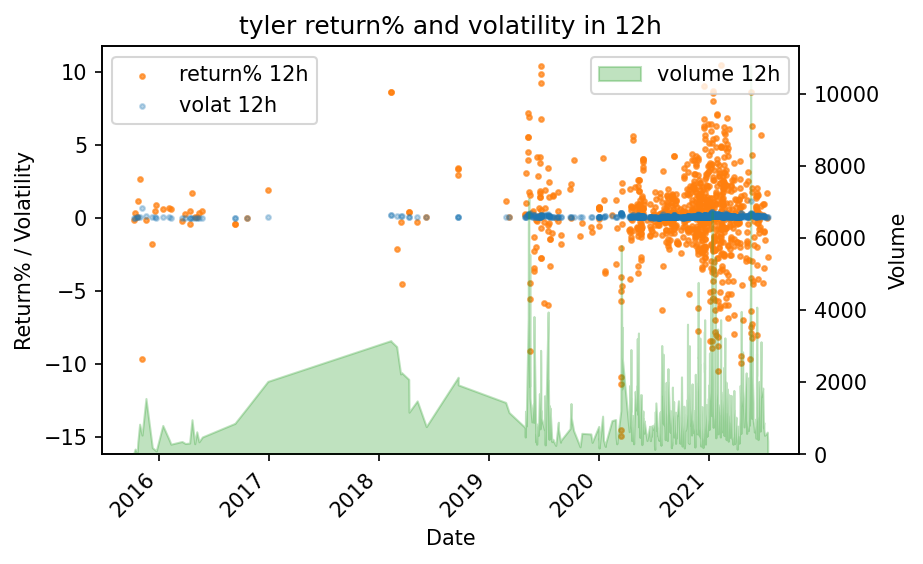

In [104]:
tyler2 = tyler
x = tyler2["date"]
y1 = tyler2["return% 12h"]
y2 = tyler2["volat 12h"]
y3 = tyler2["volume 12h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler return% and volatility in 12h")
plt.show()

## Volatility Ratio Graph

In [105]:
tyler_full['volat ratio 10min'] = tyler_full['volat 10m'] / tyler_full['volat 10m_r'] #Make ratio column for volatility
tyler_full['volat ratio 30min'] = tyler_full['volat 30m'] / tyler_full['volat 30m_r']
tyler_full['volat ratio 1h'] = tyler_full['volat 1h'] / tyler_full['volat 1h_r']
tyler_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,25,2021-07-21 18:21:00,"Elon, Tesla, and SpaceX own #Bitcoin",343,32426.36,1.731057,-0.258154,-1.032339,-0.802588,...,2524.472670,0.0,0.565246,0.353972,0.258639,0.178184,0.134900,0.874641,0.882029,1.015594
1,1,32,2021-07-14 23:54:00,A US digital currency won't make bitcoin obsol...,10084,32777.06,0.175556,0.106568,0.071452,0.119016,...,1226.602478,0.0,0.035103,0.069811,0.063791,0.062527,0.065283,1.499374,1.005054,1.336144
2,2,35,2021-07-13 14:16:00,REMINDER: #Bitcoin is the best protection in t...,12102,32504.85,2.497010,0.087433,0.048485,0.232488,...,1432.501486,0.0,0.072135,0.099547,0.082729,0.093227,0.074071,0.719785,0.666762,0.755975
3,3,36,2021-07-11 15:51:00,Gold is not scarce. #Bitcoin is the only fixed...,14887,33927.68,0.360530,0.000000,-0.006013,-0.225892,...,727.446644,0.0,0.048699,0.040968,0.048029,0.052871,0.052511,0.738089,1.314430,1.772848
4,4,50,2021-07-04 12:08:00,Fiat money is government truth. #Bitcoin is cr...,25186,35519.01,1.594926,0.011459,-0.171880,-0.124215,...,671.944584,0.0,0.046337,0.042002,0.038808,0.054579,0.066936,1.553627,1.311619,1.745649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951,951,4622,2015-10-28 19:43:00,Winklevoss Q&amp;A: What Professional Investor...,2909502,299.20,0.360000,0.000000,0.000000,0.000000,...,1137.704298,0.0,0.001495,0.000863,0.000610,0.206143,0.149205,0.000000,0.000000,0.000000
952,952,4623,2015-10-22 19:47:00,"Bitcoin is Exempt from VAT, Rules European Cou...",2918138,276.74,0.000000,0.000000,0.000000,0.021681,...,618.302376,0.0,0.000000,0.000649,0.000463,0.056438,0.051689,NaN,4.168624,6.454881
953,953,4624,2015-10-20 19:03:00,Kaye Scholer Holds Bitcoin Seminar with Winkle...,2921062,272.35,0.000000,0.000000,0.000000,1.156600,...,186.579983,0.0,0.000000,0.000000,0.211799,0.198121,0.201115,NaN,inf,1.030068
954,954,4625,2015-10-13 21:18:00,Billion Dollar Mexican Retail Company Famsa Ac...,2931007,250.35,0.000000,0.000000,0.000000,0.000000,...,102.701756,0.0,0.000000,0.005736,0.004436,0.013837,0.017923,NaN,0.000000,0.000000


<ipython-input-106-167463173516>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


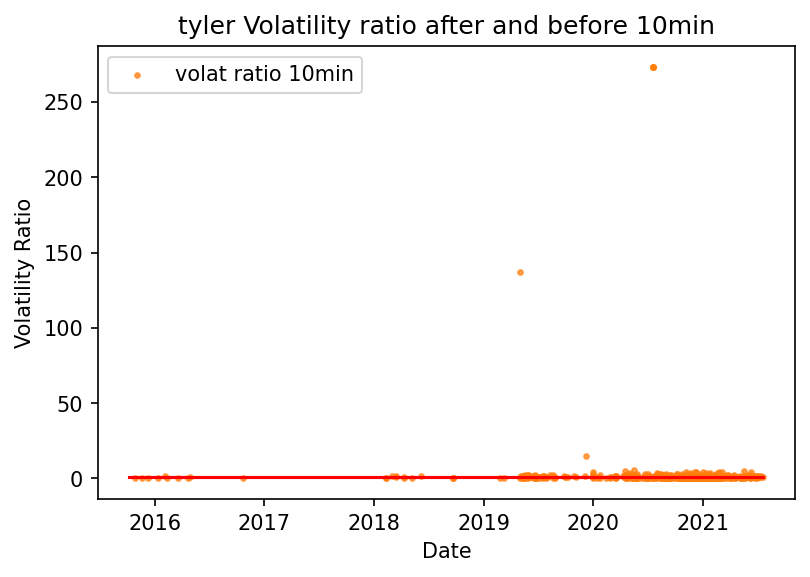

In [106]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volatility ratio after and before 10min")
fig.show()

<ipython-input-107-fe139584ce89>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


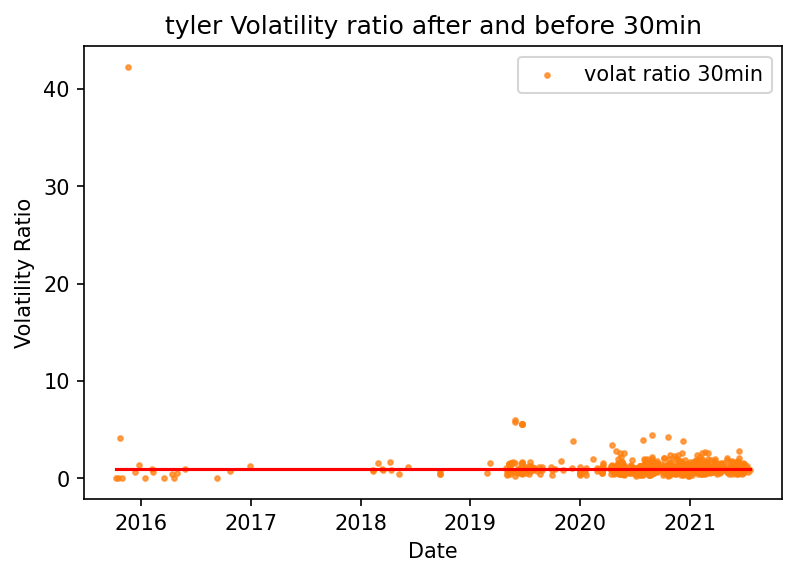

In [107]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volatility ratio after and before 30min")
fig.show()

<ipython-input-108-9bbbf7861588>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


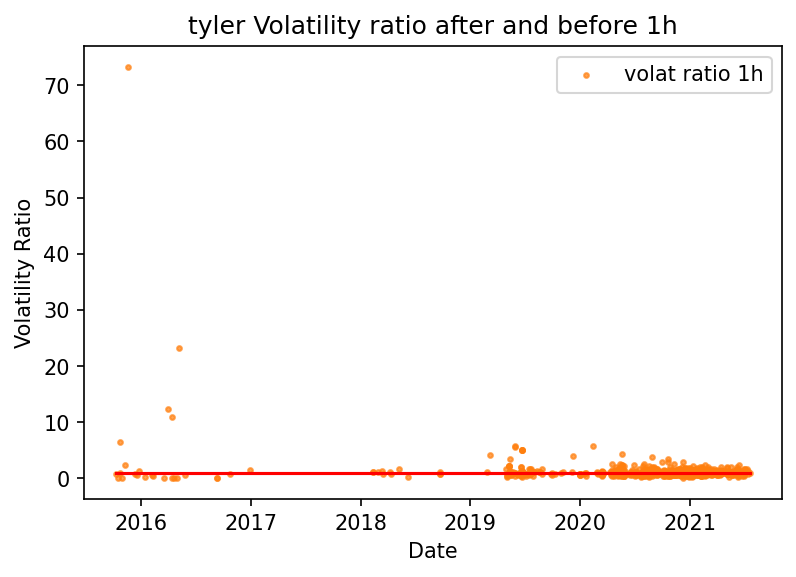

In [108]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [109]:
tyler_full['volume ratio 10min'] = tyler_full['volume 10m'] / tyler_full['volume 10m_r'] #Make ratio column for volume
tyler_full['volume ratio 30min'] = tyler_full['volume 30m'] / tyler_full['volume 30m_r']
tyler_full['volume ratio 1h'] = tyler_full['volume 1h'] / tyler_full['volume 1h_r']
tyler_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,25,2021-07-21 18:21:00,"Elon, Tesla, and SpaceX own #Bitcoin",343,32426.36,1.731057,-0.258154,-1.032339,-0.802588,...,0.353972,0.258639,0.178184,0.134900,0.874641,0.882029,1.015594,0.890985,1.236212,1.458406
1,1,32,2021-07-14 23:54:00,A US digital currency won't make bitcoin obsol...,10084,32777.06,0.175556,0.106568,0.071452,0.119016,...,0.069811,0.063791,0.062527,0.065283,1.499374,1.005054,1.336144,0.400529,0.689993,1.656183
2,2,35,2021-07-13 14:16:00,REMINDER: #Bitcoin is the best protection in t...,12102,32504.85,2.497010,0.087433,0.048485,0.232488,...,0.099547,0.082729,0.093227,0.074071,0.719785,0.666762,0.755975,1.121751,0.666880,0.687914
3,3,36,2021-07-11 15:51:00,Gold is not scarce. #Bitcoin is the only fixed...,14887,33927.68,0.360530,0.000000,-0.006013,-0.225892,...,0.040968,0.048029,0.052871,0.052511,0.738089,1.314430,1.772848,3.709203,2.335795,8.203356
4,4,50,2021-07-04 12:08:00,Fiat money is government truth. #Bitcoin is cr...,25186,35519.01,1.594926,0.011459,-0.171880,-0.124215,...,0.042002,0.038808,0.054579,0.066936,1.553627,1.311619,1.745649,3.735049,1.441318,1.268696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951,951,4622,2015-10-28 19:43:00,Winklevoss Q&amp;A: What Professional Investor...,2909502,299.20,0.360000,0.000000,0.000000,0.000000,...,0.000863,0.000610,0.206143,0.149205,0.000000,0.000000,0.000000,0.137095,0.539650,1.920818
952,952,4623,2015-10-22 19:47:00,"Bitcoin is Exempt from VAT, Rules European Cou...",2918138,276.74,0.000000,0.000000,0.000000,0.021681,...,0.000649,0.000463,0.056438,0.051689,NaN,4.168624,6.454881,0.000000,118.668404,96.210393
953,953,4624,2015-10-20 19:03:00,Kaye Scholer Holds Bitcoin Seminar with Winkle...,2921062,272.35,0.000000,0.000000,0.000000,1.156600,...,0.000000,0.211799,0.198121,0.201115,NaN,inf,1.030068,NaN,inf,34.158101
954,954,4625,2015-10-13 21:18:00,Billion Dollar Mexican Retail Company Famsa Ac...,2931007,250.35,0.000000,0.000000,0.000000,0.000000,...,0.005736,0.004436,0.013837,0.017923,NaN,0.000000,0.000000,NaN,0.000000,0.000000


<ipython-input-110-2acd51ad7880>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


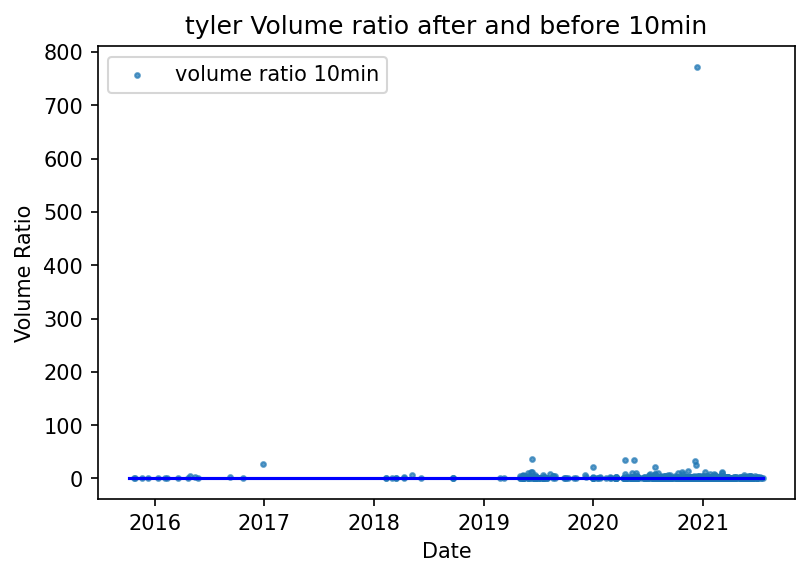

In [110]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volume ratio after and before 10min")
fig.show()

<ipython-input-111-ce368bea3571>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


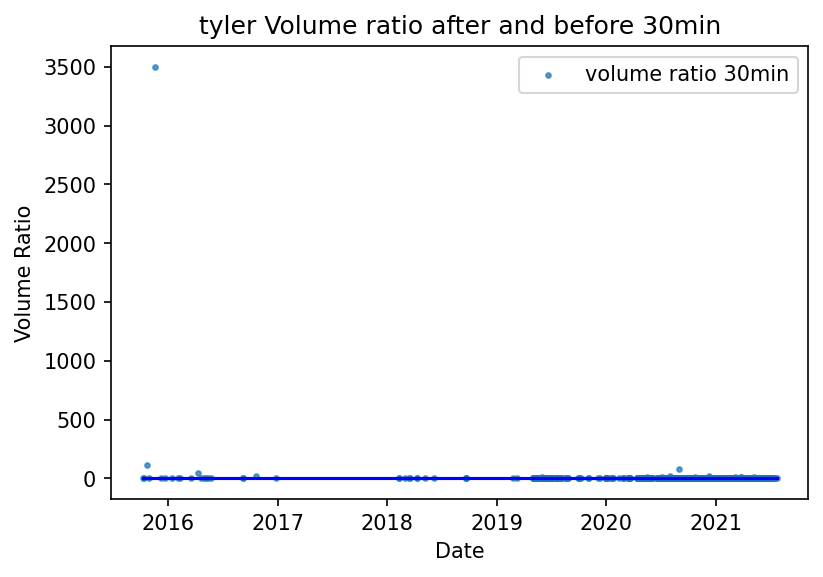

In [111]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volume ratio after and before 30min")
fig.show()

<ipython-input-112-bcd519028fba>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


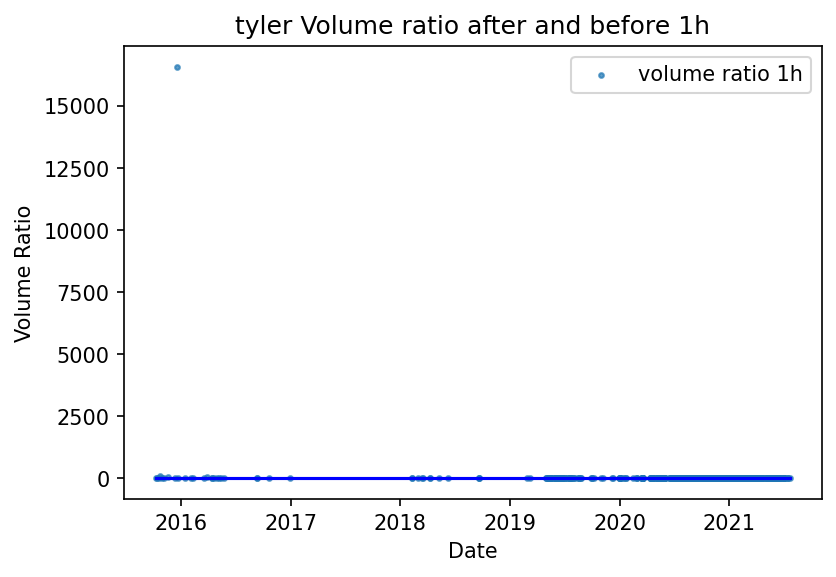

In [112]:
tyler2 = tyler_full #copy
x = tyler2["date"] #x axis
y1 = tyler2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("tyler Volume ratio after and before 1h")
fig.show()

# UniswapD
## Scatter plot (time vs Return% / Volatility)

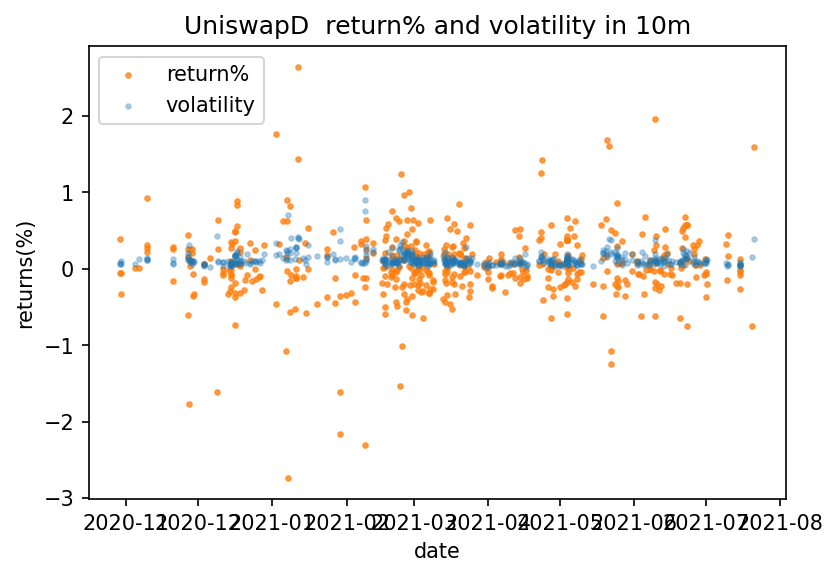

In [113]:
# UniswapD  10min return and volat
UniswapD_scatter('return% 10m','volat 10m','UniswapD  return% and volatility in 10m')

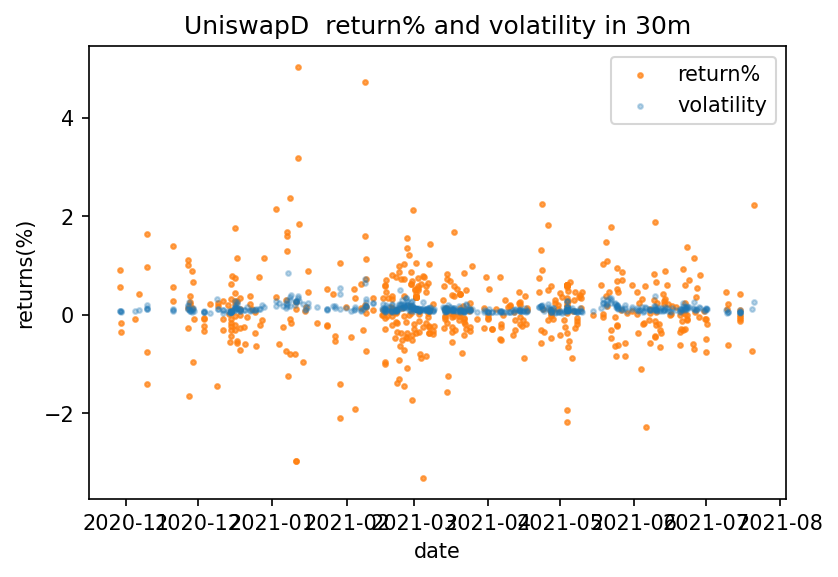

In [114]:
# UniswapD  30min return and volat
UniswapD_scatter('return% 30m','volat 30m','UniswapD  return% and volatility in 30m')

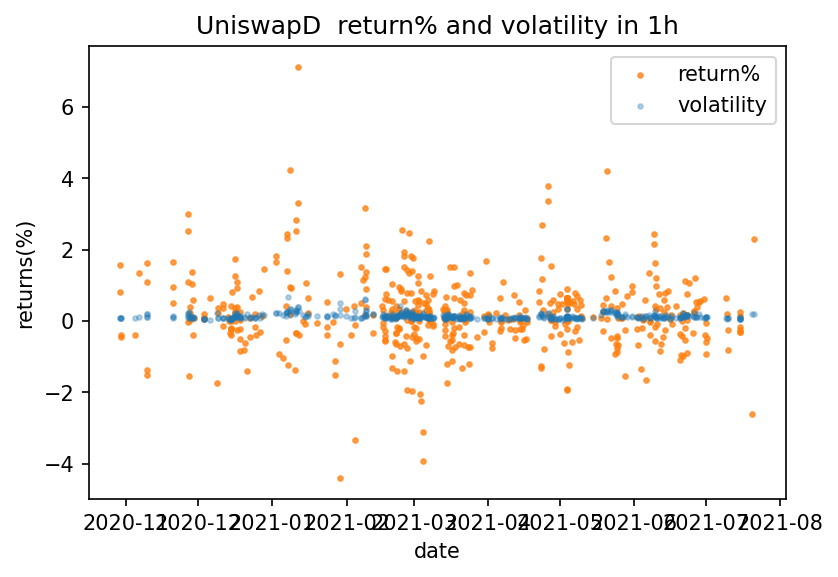

In [115]:
# UniswapD  1h return and volat
UniswapD_scatter('return% 1h','volat 1h','UniswapD  return% and volatility in 1h')

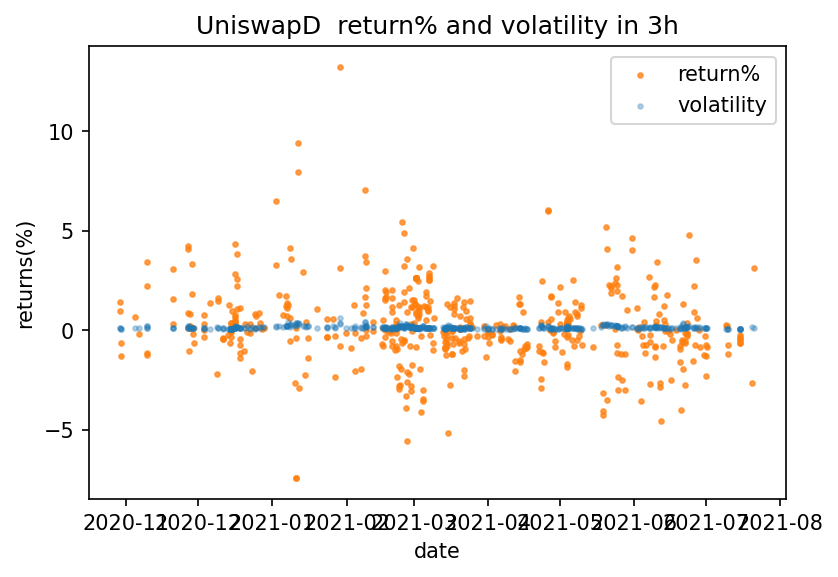

In [116]:
UniswapD_scatter('return% 3h','volat 3h','UniswapD  return% and volatility in 3h')

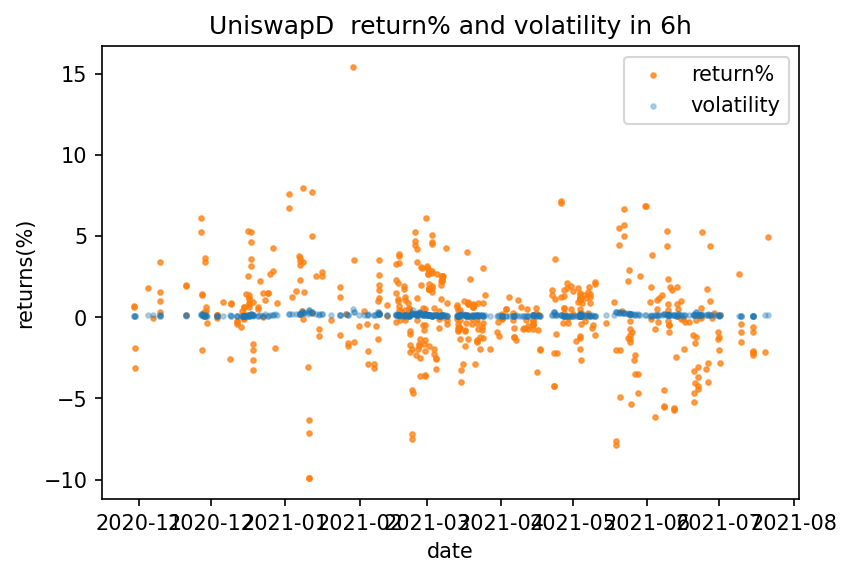

In [117]:
UniswapD_scatter('return% 6h','volat 6h','UniswapD  return% and volatility in 6h')

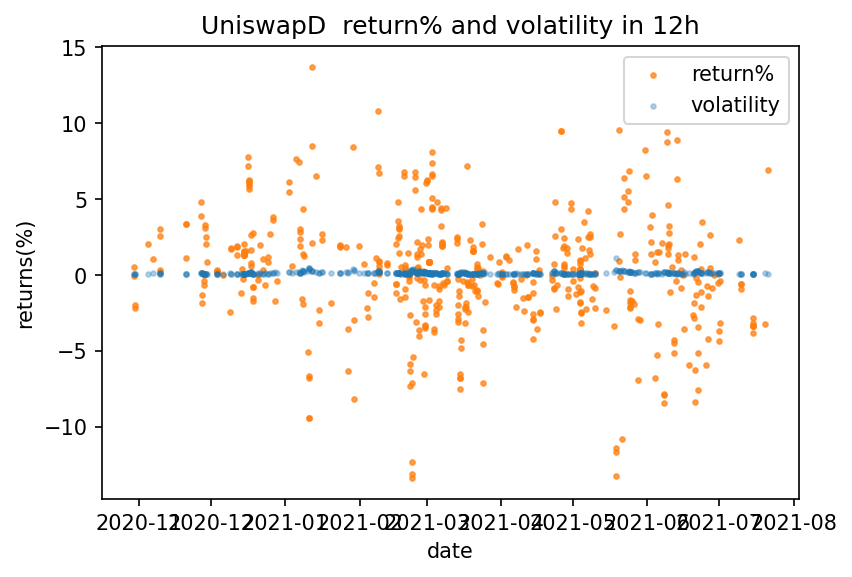

In [118]:
UniswapD_scatter('return% 12h','volat 12h','UniswapD  return% and volatility in 12h')

## Volume Graph

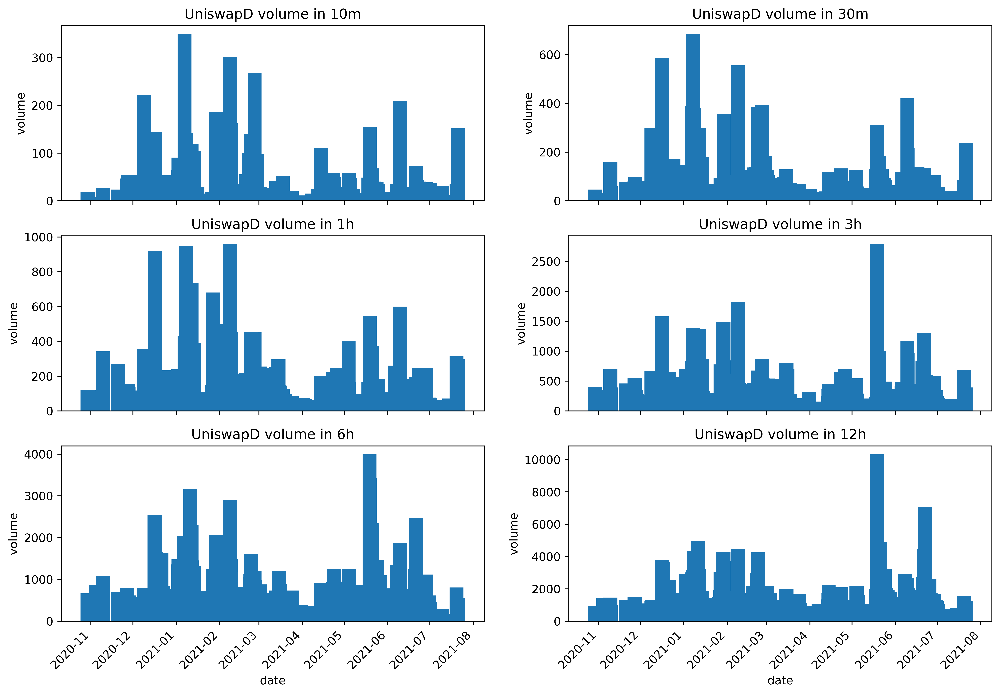

In [119]:
fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
UniswapDBAR('volume 10m', 'UniswapD volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
UniswapDBAR('volume 30m', 'UniswapD volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
UniswapDBAR('volume 1h', 'UniswapD volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
UniswapDBAR('volume 3h', 'UniswapD volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
UniswapDBAR('volume 6h', 'UniswapD volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
UniswapDBAR('volume 12h', 'UniswapD volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merged Graph

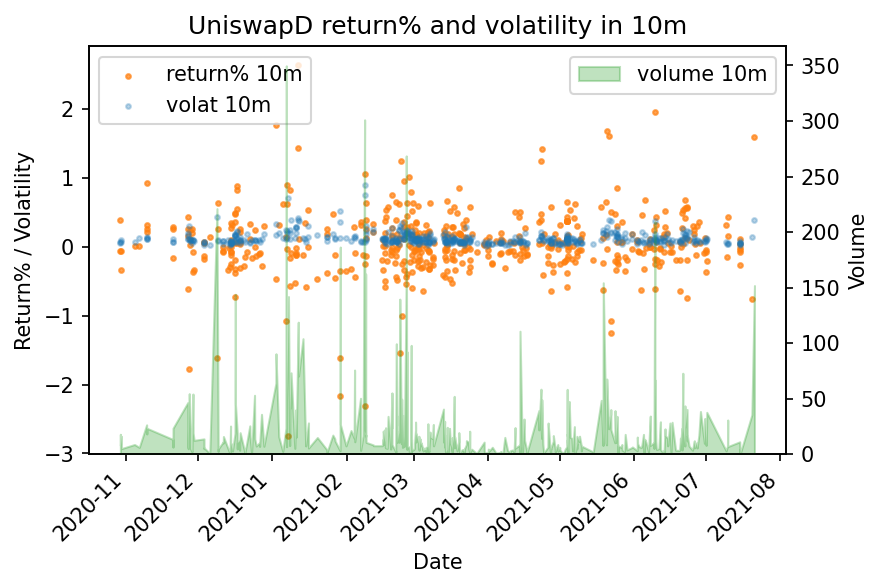

In [120]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 10m"]
y2 = UniswapD2["volat 10m"]
y3 = UniswapD2["volume 10m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 10m")
plt.show()

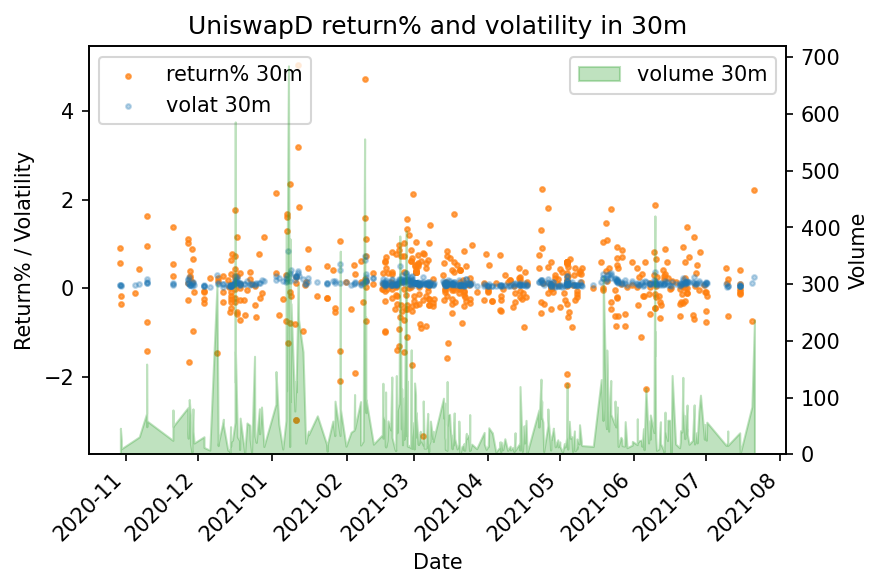

In [121]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 30m"]
y2 = UniswapD2["volat 30m"]
y3 = UniswapD2["volume 30m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 30m")
plt.show()

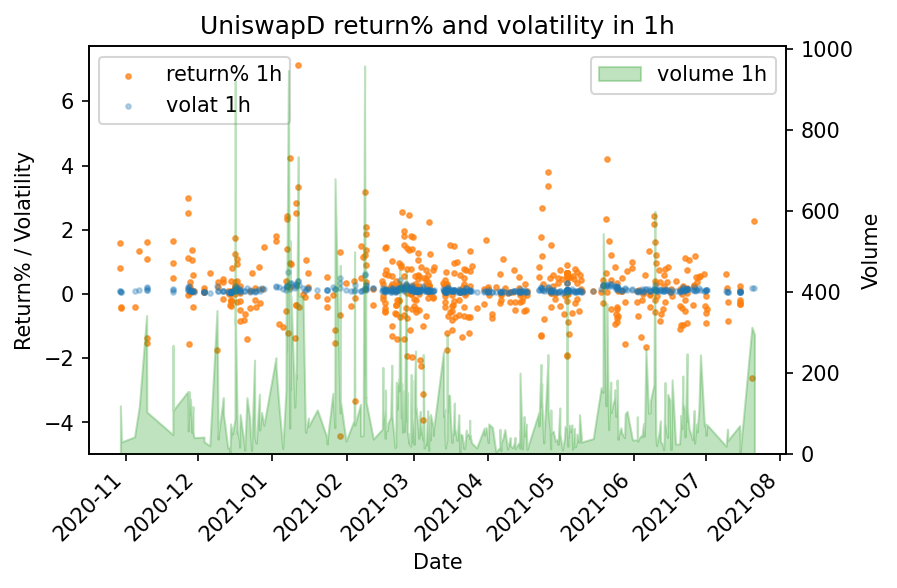

In [122]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 1h"]
y2 = UniswapD2["volat 1h"]
y3 = UniswapD2["volume 1h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 1h")
plt.show()

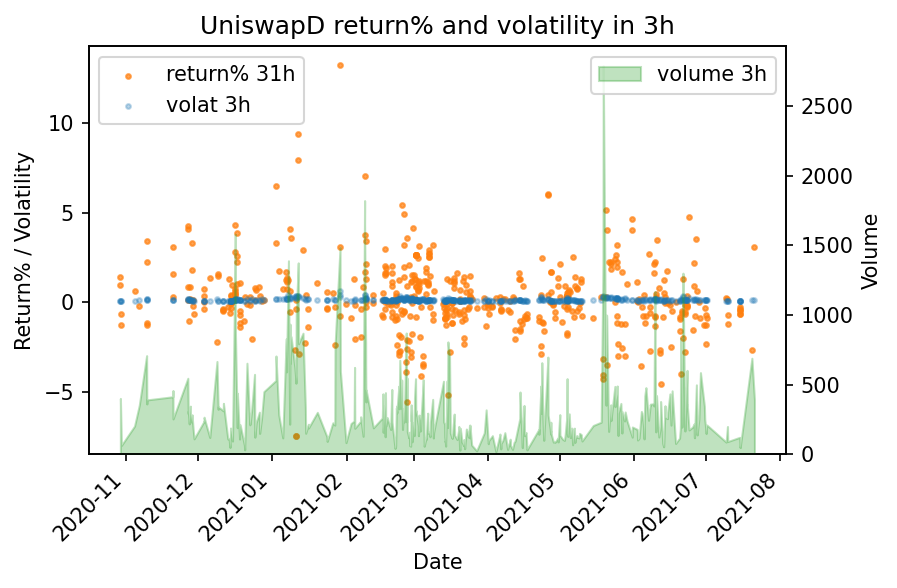

In [123]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 3h"]
y2 = UniswapD2["volat 3h"]
y3 = UniswapD2["volume 3h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 31h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 3h")
plt.show()

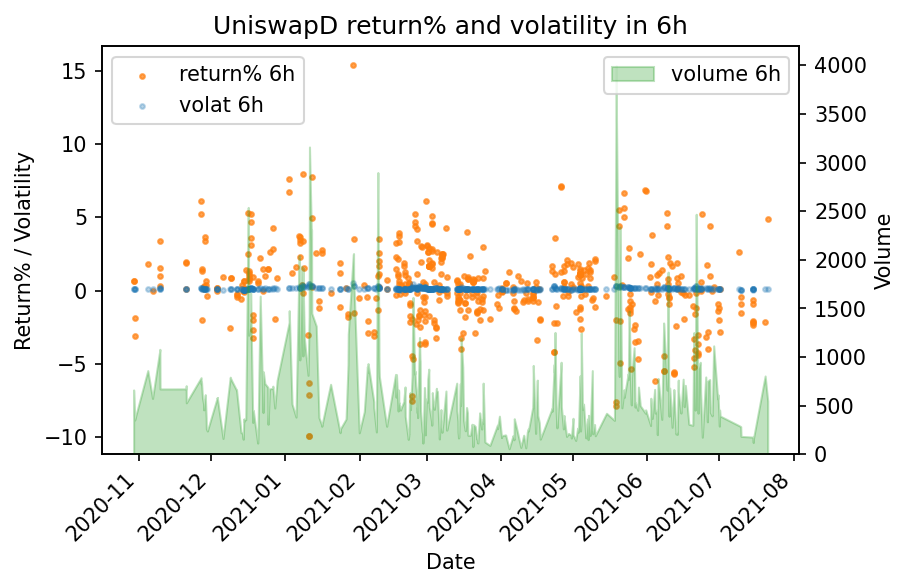

In [124]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 6h"]
y2 = UniswapD2["volat 6h"]
y3 = UniswapD2["volume 6h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 6h")
plt.show()

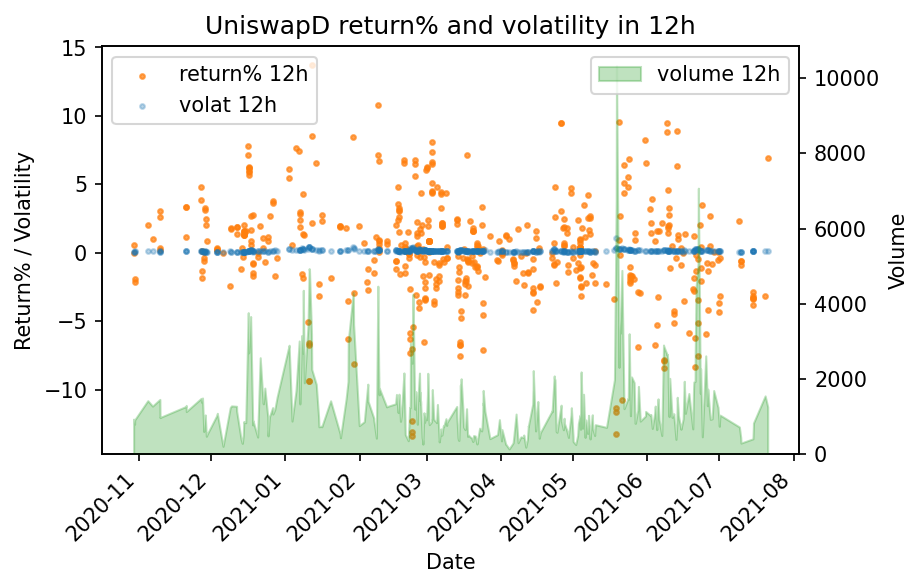

In [125]:
UniswapD2 = UniswapD
x = UniswapD2["date"]
y1 = UniswapD2["return% 12h"]
y2 = UniswapD2["volat 12h"]
y3 = UniswapD2["volume 12h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD return% and volatility in 12h")
plt.show()

## Volatility Ratio Graph

In [126]:
UniswapD_full['volat ratio 10min'] = UniswapD_full['volat 10m'] / UniswapD_full['volat 10m_r'] #Make ratio column for volatility
UniswapD_full['volat ratio 30min'] = UniswapD_full['volat 30m'] / UniswapD_full['volat 30m_r']
UniswapD_full['volat ratio 1h'] = UniswapD_full['volat 1h'] / UniswapD_full['volat 1h_r']
UniswapD_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,21,2021-07-21 04:07:00,@Bit_Lebowski Should have leveraged your mortg...,1197,29929.00,39.795465,-0.055431,1.599886,2.226169,...,2102.083960,0.0,0.069437,0.064318,0.068924,0.064936,0.069599,5.595151,4.005993,2.802855
1,1,36,2021-07-20 02:20:00,Life's a meme and dogs are a better store of v...,2744,30530.34,1.118394,0.037995,-0.754463,-0.743261,...,1707.938575,0.0,0.110044,0.088400,0.081576,0.076904,0.062235,1.344255,1.292862,2.283261
2,2,43,2021-07-15 05:15:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9763,32577.87,0.106210,0.028823,0.122384,-0.051630,...,1092.754351,0.0,0.040141,0.063669,0.066215,0.067458,0.073417,1.565971,0.839475,0.802141
3,3,44,2021-07-15 05:05:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9773,32593.13,0.004241,-0.067867,-0.046820,0.101647,...,1091.063592,0.0,0.062806,0.073980,0.068064,0.067772,0.074541,0.639042,0.676018,0.750136
4,4,46,2021-07-15 04:57:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9781,32652.42,0.163032,0.017426,-0.262400,-0.123727,...,1088.725156,0.0,0.074503,0.077437,0.086906,0.068305,0.074089,0.744379,0.710066,0.631637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650,650,8478,2020-11-04 13:33:00,@DexWatchdog Like $DOGE?,369204,13882.95,4.475611,0.009940,0.015703,-0.095585,...,2230.555690,0.0,0.084198,0.078771,0.073228,0.072158,0.089822,0.779992,0.849532,1.232220
651,651,8676,2020-10-30 02:06:00,When 1 $TABS = 1 $BTC? FEW understand. MANY ...,377091,13579.49,0.007214,-0.046983,-0.053389,-0.161346,...,1503.834675,0.0,0.084285,0.078378,0.089568,0.085935,0.081953,0.806012,0.667789,0.804529
652,652,8685,2020-10-30 01:30:00,- $TABS Have a new pool on the 4th with $TABS ...,377127,13617.75,0.010807,-0.157368,-0.333609,-0.358136,...,1526.401100,0.0,0.046286,0.087420,0.096097,0.083101,0.080559,2.294419,0.980882,0.787744
653,653,8735,2020-10-29 15:59:00,@bitcoin_brown @frombroke2bags @Crypto_Puppy_ ...,377698,13453.38,0.391929,0.002899,-0.061620,0.918877,...,2193.996965,0.0,0.099151,0.083642,0.081672,0.096218,0.091656,0.642361,0.889096,1.143454


<ipython-input-127-9ff6dbc3a711>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


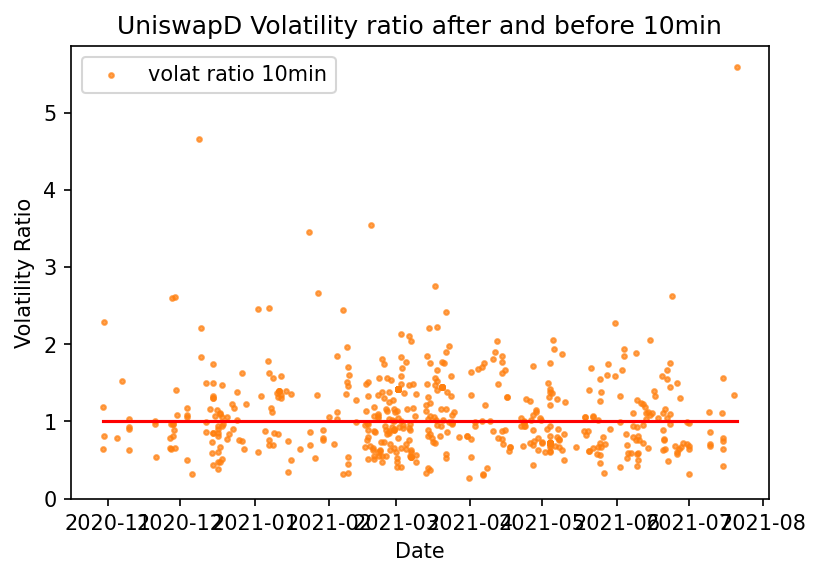

In [127]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volatility ratio after and before 10min")
fig.show()

<ipython-input-128-d8f3c304cd2f>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


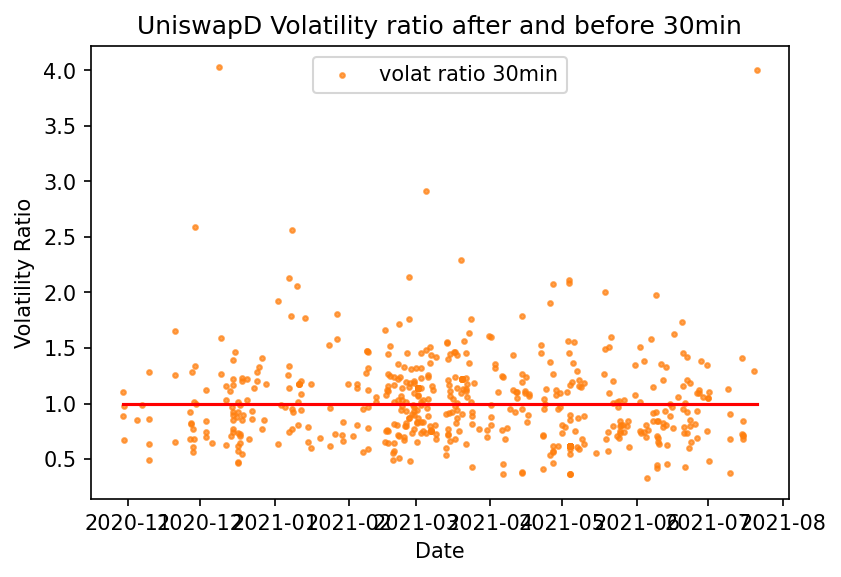

In [128]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volatility ratio after and before 30min")
fig.show()

<ipython-input-129-219a5870d751>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


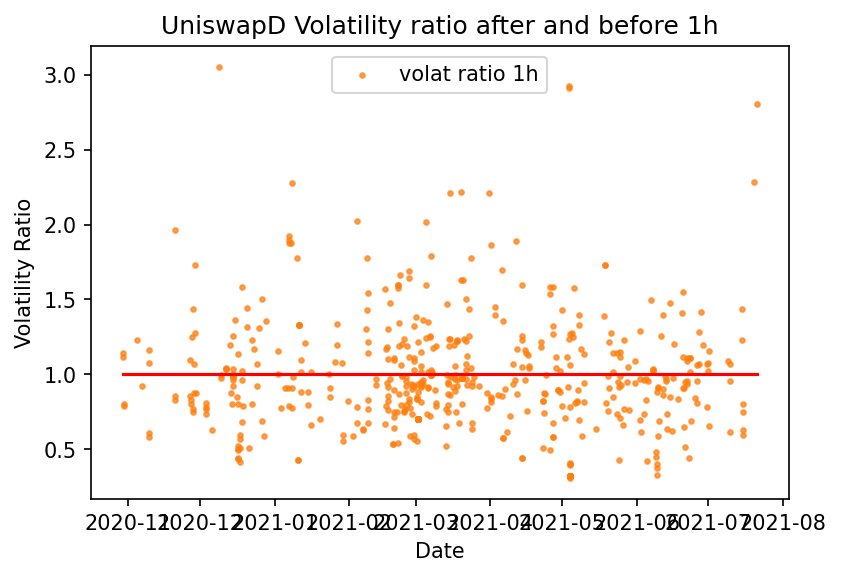

In [129]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [130]:
UniswapD_full['volume ratio 10min'] = UniswapD_full['volume 10m'] / UniswapD_full['volume 10m_r'] #Make ratio column for volume
UniswapD_full['volume ratio 30min'] = UniswapD_full['volume 30m'] / UniswapD_full['volume 30m_r']
UniswapD_full['volume ratio 1h'] = UniswapD_full['volume 1h'] / UniswapD_full['volume 1h_r']
UniswapD_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,21,2021-07-21 04:07:00,@Bit_Lebowski Should have leveraged your mortg...,1197,29929.00,39.795465,-0.055431,1.599886,2.226169,...,0.064318,0.068924,0.064936,0.069599,5.595151,4.005993,2.802855,3.026231,3.588584,3.096520
1,1,36,2021-07-20 02:20:00,Life's a meme and dogs are a better store of v...,2744,30530.34,1.118394,0.037995,-0.754463,-0.743261,...,0.088400,0.081576,0.076904,0.062235,1.344255,1.292862,2.283261,2.621539,3.786519,6.958003
2,2,43,2021-07-15 05:15:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9763,32577.87,0.106210,0.028823,0.122384,-0.051630,...,0.063669,0.066215,0.067458,0.073417,1.565971,0.839475,0.802141,0.203682,0.161395,0.341092
3,3,44,2021-07-15 05:05:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9773,32593.13,0.004241,-0.067867,-0.046820,0.101647,...,0.073980,0.068064,0.067772,0.074541,0.639042,0.676018,0.750136,0.509888,0.402444,0.423789
4,4,46,2021-07-15 04:57:00,@nyanloldoge @youngprepro @MrNoddy19982653 @mr...,9781,32652.42,0.163032,0.017426,-0.262400,-0.123727,...,0.077437,0.086906,0.068305,0.074089,0.744379,0.710066,0.631637,12.917515,1.448042,0.342293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650,650,8478,2020-11-04 13:33:00,@DexWatchdog Like $DOGE?,369204,13882.95,4.475611,0.009940,0.015703,-0.095585,...,0.078771,0.073228,0.072158,0.089822,0.779992,0.849532,1.232220,0.737955,1.597200,0.964924
651,651,8676,2020-10-30 02:06:00,When 1 $TABS = 1 $BTC? FEW understand. MANY ...,377091,13579.49,0.007214,-0.046983,-0.053389,-0.161346,...,0.078378,0.089568,0.085935,0.081953,0.806012,0.667789,0.804529,1.219955,0.789206,0.474755
652,652,8685,2020-10-30 01:30:00,- $TABS Have a new pool on the 4th with $TABS ...,377127,13617.75,0.010807,-0.157368,-0.333609,-0.358136,...,0.087420,0.096097,0.083101,0.080559,2.294419,0.980882,0.787744,4.621631,0.528257,0.537199
653,653,8735,2020-10-29 15:59:00,@bitcoin_brown @frombroke2bags @Crypto_Puppy_ ...,377698,13453.38,0.391929,0.002899,-0.061620,0.918877,...,0.083642,0.081672,0.096218,0.091656,0.642361,0.889096,1.143454,0.664488,0.891656,1.114366


<ipython-input-131-8a2dc9eb5760>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


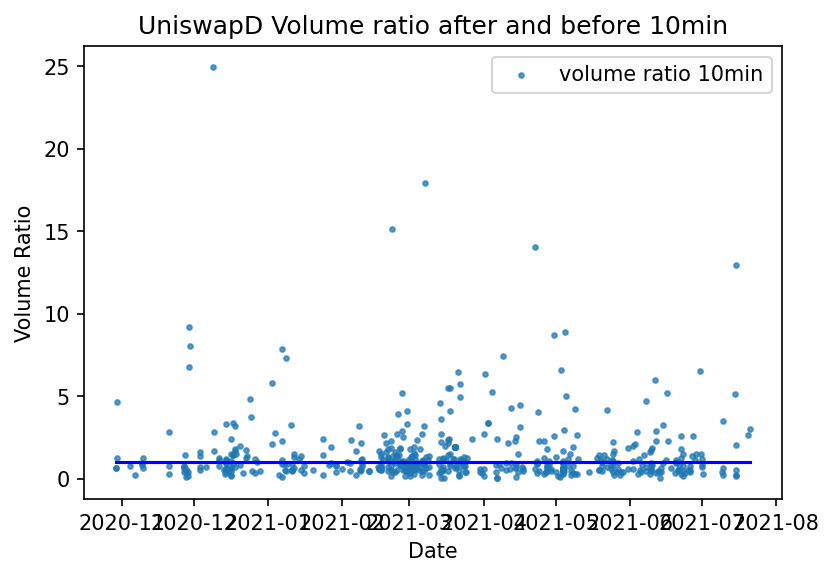

In [131]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volume ratio after and before 10min")
fig.show()

<ipython-input-132-29b288be73ea>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


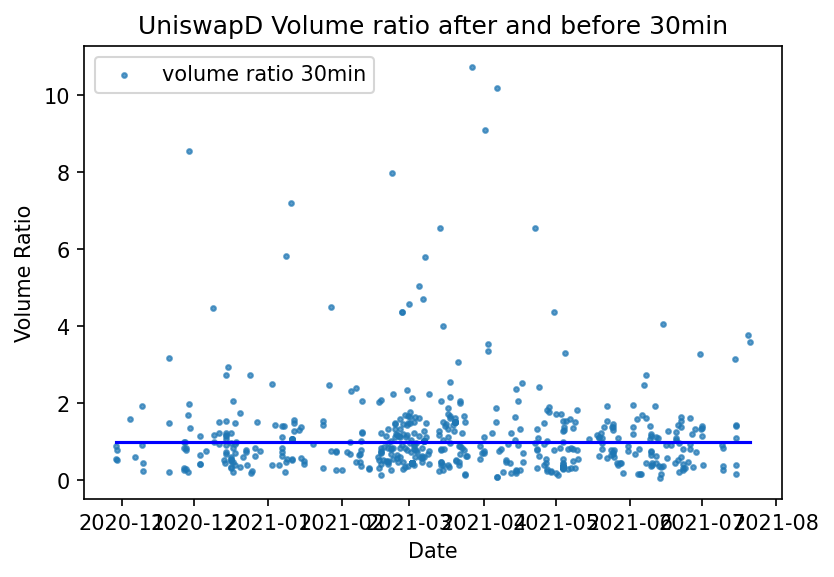

In [132]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volume ratio after and before 30min")
fig.show()

<ipython-input-133-b90277df7315>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


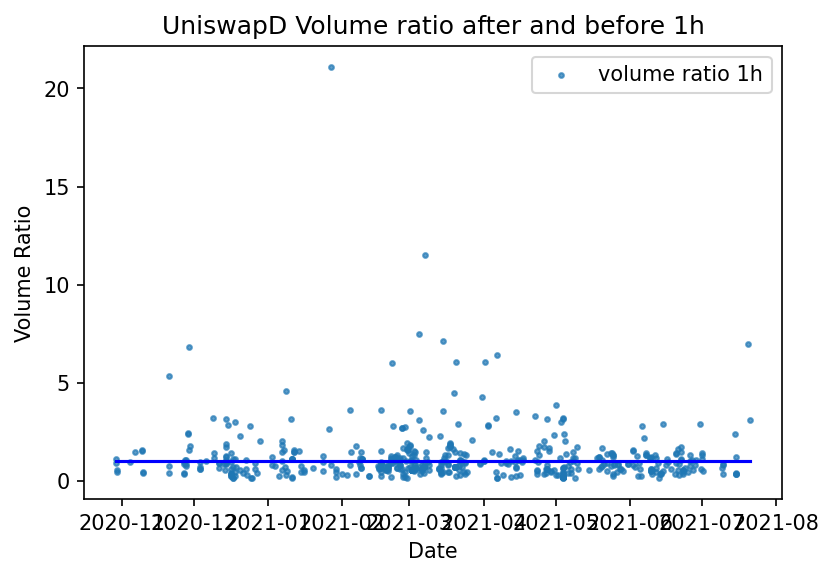

In [133]:
UniswapD2 = UniswapD_full #copy
x = UniswapD2["date"] #x axis
y1 = UniswapD2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("UniswapD Volume ratio after and before 1h")
fig.show()

# VitalikButerin
## Scatter plot (time vs Return% / Volatility)

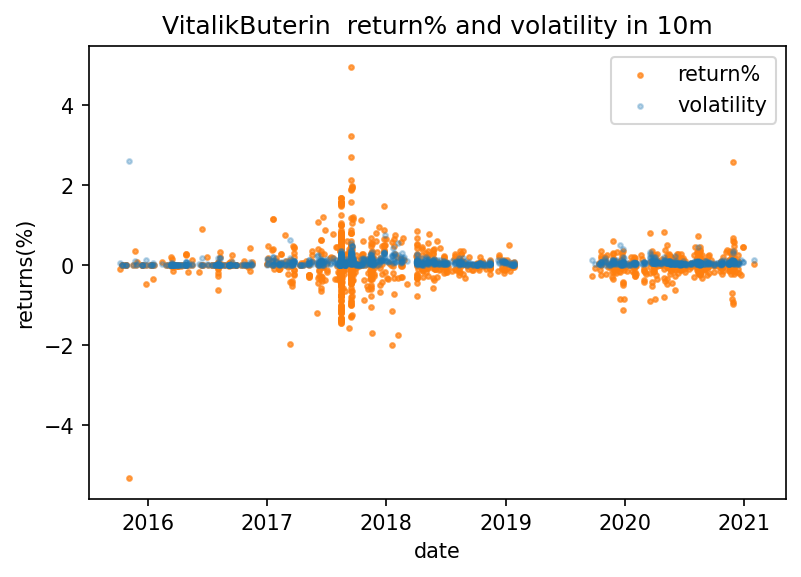

In [134]:
# VitalikButerin  10min return and volat
VitalikButerin_scatter('return% 10m','volat 10m','VitalikButerin  return% and volatility in 10m')

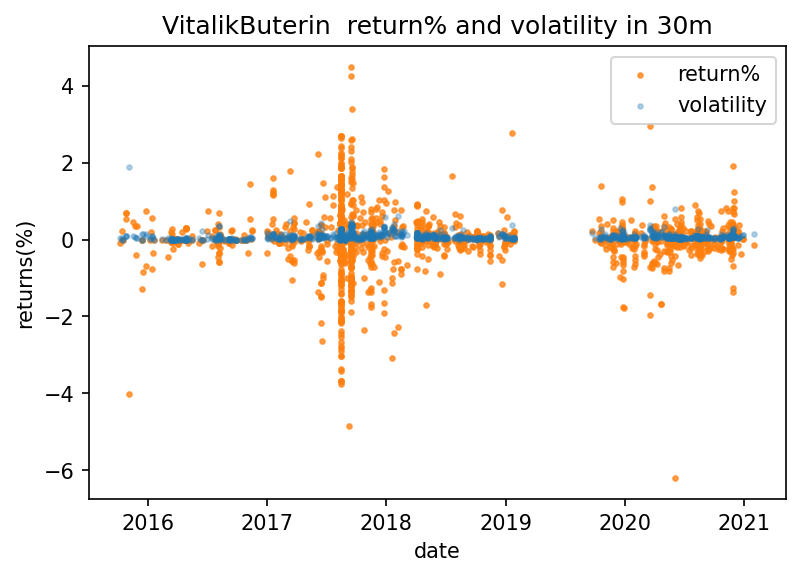

In [135]:
# VitalikButerin  30min return and volat
VitalikButerin_scatter('return% 30m','volat 30m','VitalikButerin  return% and volatility in 30m')

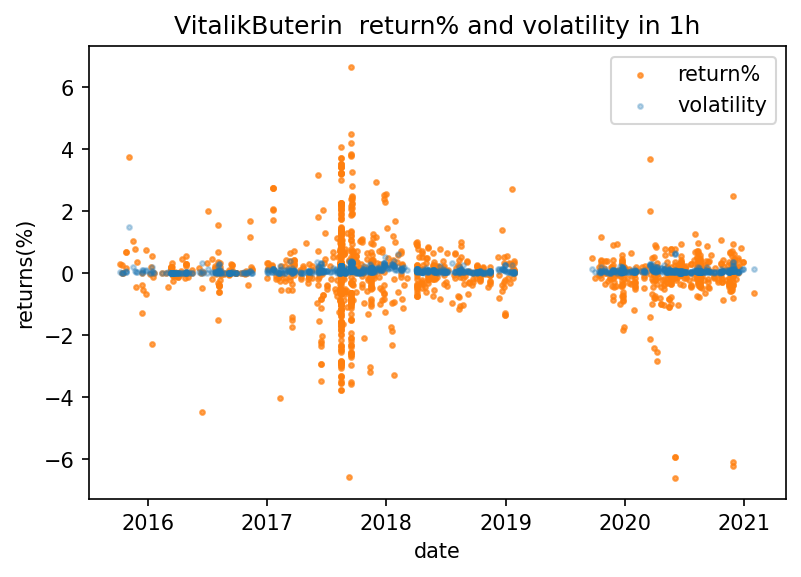

In [136]:
# VitalikButerin  1h return and volat
VitalikButerin_scatter('return% 1h','volat 1h','VitalikButerin  return% and volatility in 1h')

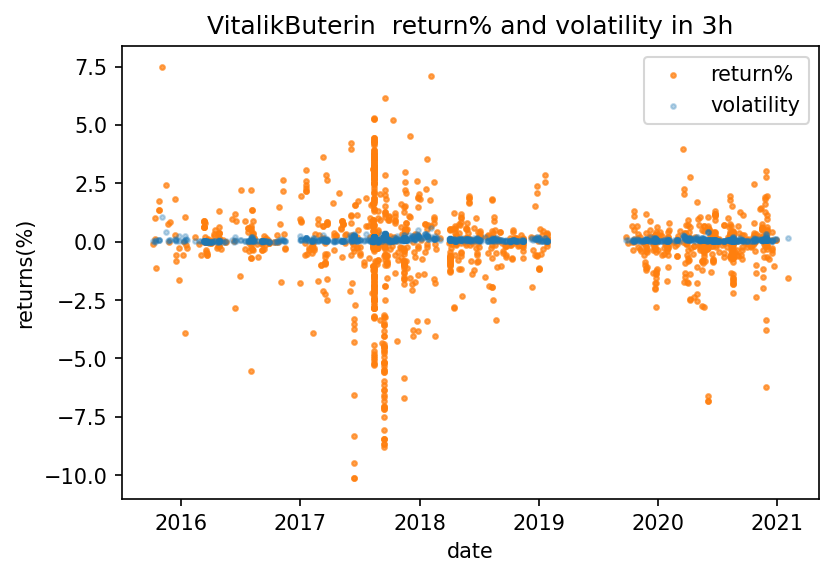

In [137]:
VitalikButerin_scatter('return% 3h','volat 3h','VitalikButerin  return% and volatility in 3h')

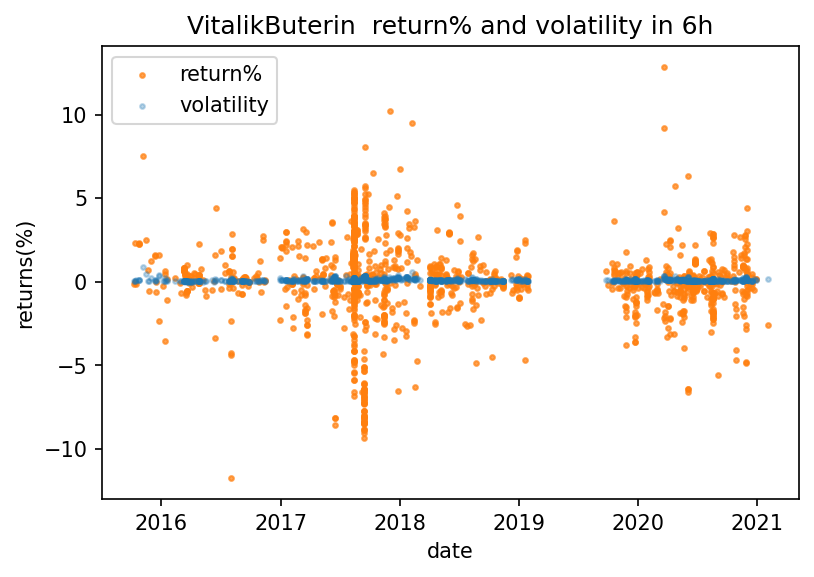

In [138]:
VitalikButerin_scatter('return% 6h','volat 6h','VitalikButerin  return% and volatility in 6h')

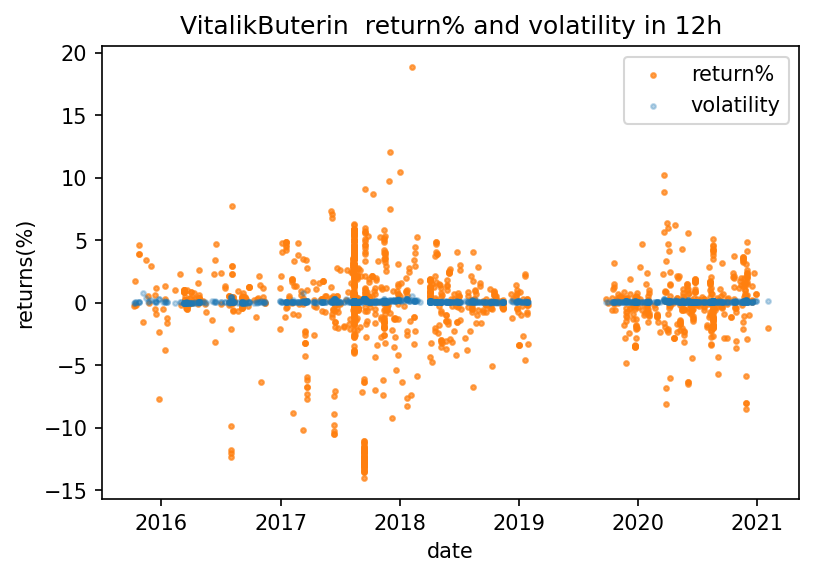

In [139]:
VitalikButerin_scatter('return% 12h','volat 12h','VitalikButerin  return% and volatility in 12h')

## Volume Graph

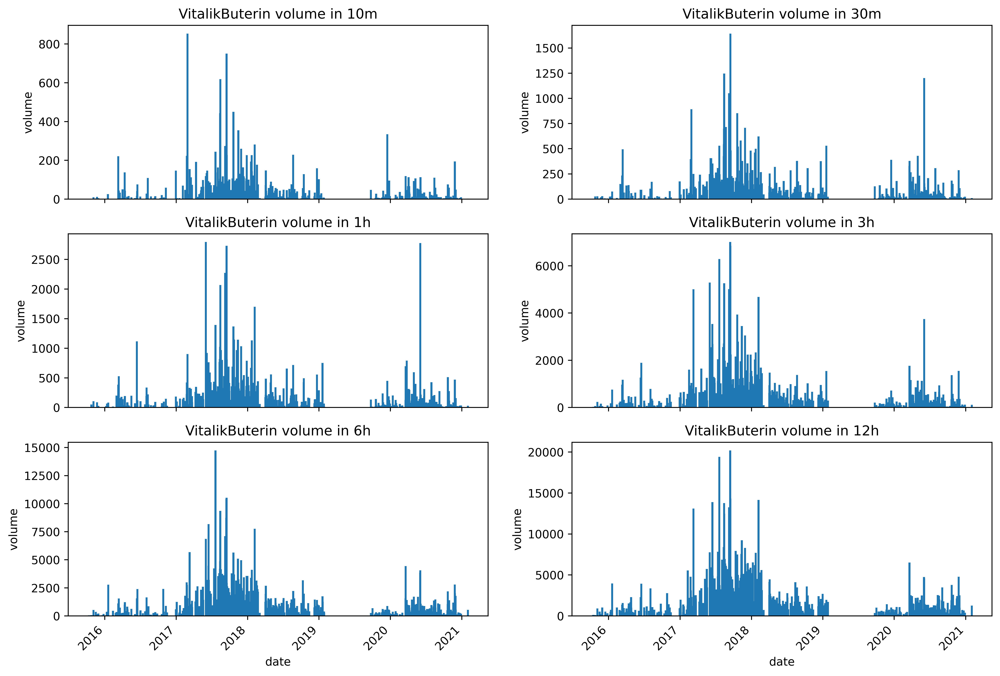

In [140]:
fig = plt.figure(dpi=600)
plt.subplots_adjust(bottom=0.5, right=2.0, top=2.0)
ax1 = fig.add_subplot(3, 2, 1)
VitalikButerinBAR('volume 10m', 'VitalikButerin volume in 10m')
plt.autoscale(enable=True, axis='both', tight=None)
ax2 = fig.add_subplot(3, 2, 2)
VitalikButerinBAR('volume 30m', 'VitalikButerin volume in 30m')
plt.autoscale(enable=True, axis='both', tight=None)
ax3 = fig.add_subplot(3, 2, 3)
VitalikButerinBAR('volume 1h', 'VitalikButerin volume in 1h')
plt.autoscale(enable=True, axis='both', tight=None)
ax4 = fig.add_subplot(3, 2, 4)
VitalikButerinBAR('volume 3h', 'VitalikButerin volume in 3h')
plt.autoscale(enable=True, axis='both', tight=None)
ax5 = fig.add_subplot(3, 2, 5)
VitalikButerinBAR('volume 6h', 'VitalikButerin volume in 6h')
plt.autoscale(enable=True, axis='both', tight=None)
ax6 = fig.add_subplot(3, 2, 6)
VitalikButerinBAR('volume 12h', 'VitalikButerin volume in 12h')
plt.autoscale(enable=True, axis='both', tight=None)

## Merge Graph

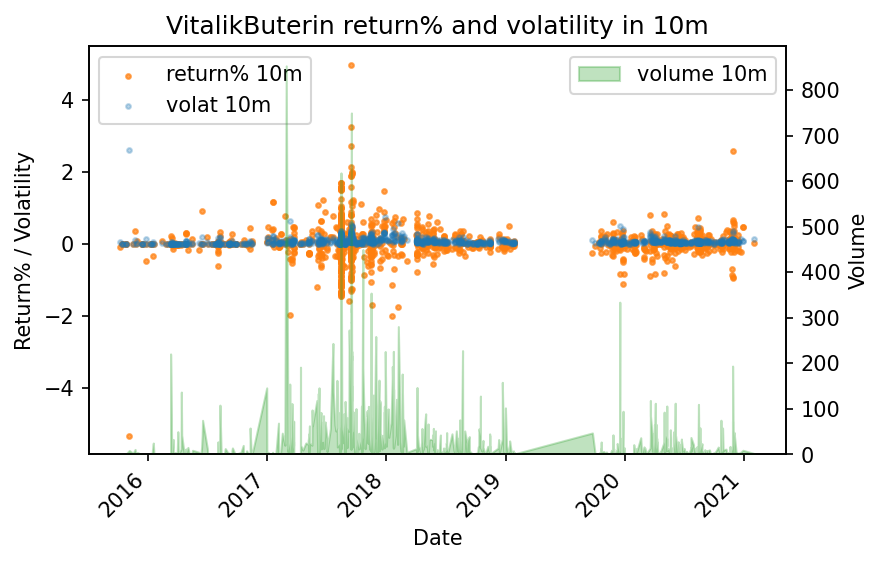

In [141]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 10m"]
y2 = VitalikButerin2["volat 10m"]
y3 = VitalikButerin2["volume 10m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 10m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 10m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 10m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 10m")
plt.show()

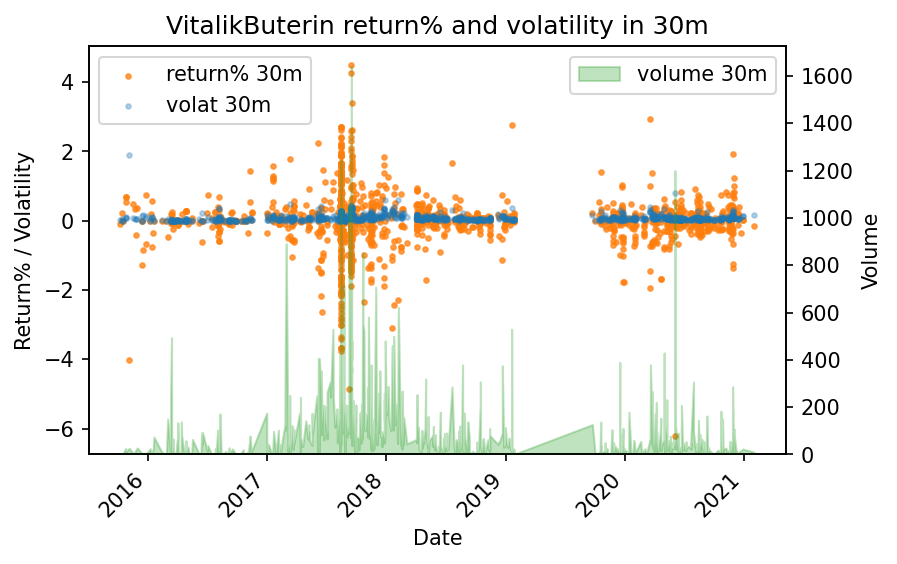

In [142]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 30m"]
y2 = VitalikButerin2["volat 30m"]
y3 = VitalikButerin2["volume 30m"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 30m')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 30m')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 30m'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 30m")
plt.show()

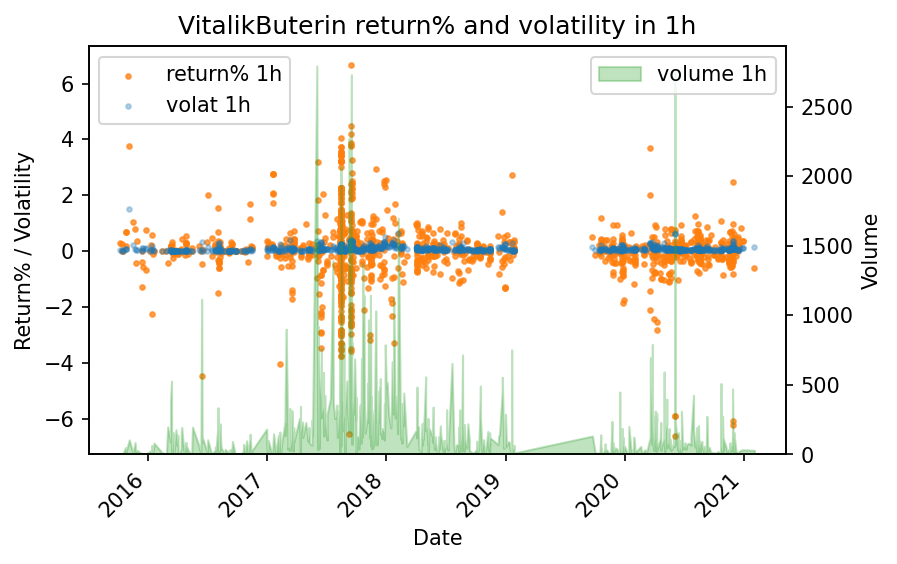

In [143]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 1h"]
y2 = VitalikButerin2["volat 1h"]
y3 = VitalikButerin2["volume 1h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 1h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 1h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 1h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 1h")
plt.show()

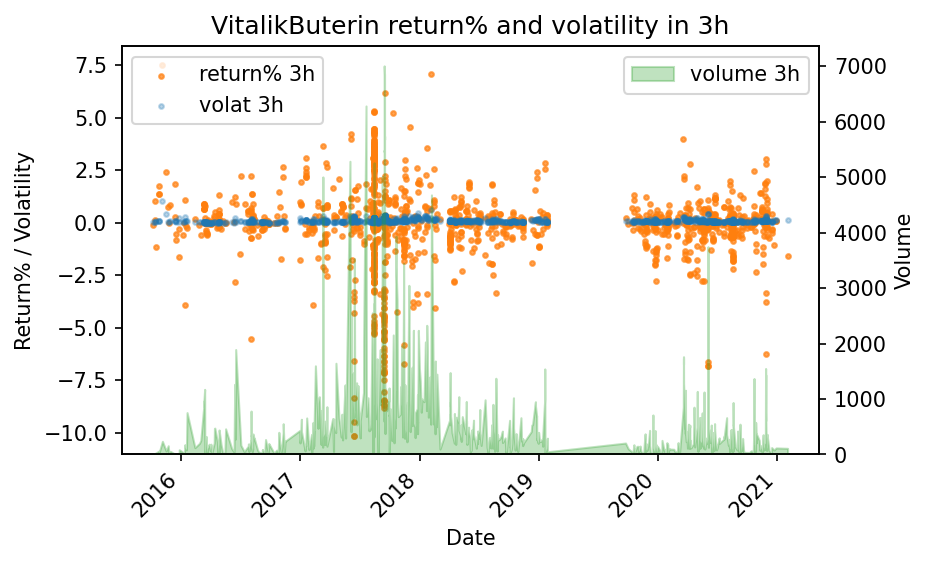

In [144]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 3h"]
y2 = VitalikButerin2["volat 3h"]
y3 = VitalikButerin2["volume 3h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 3h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 3h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 3h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 3h")
plt.show()

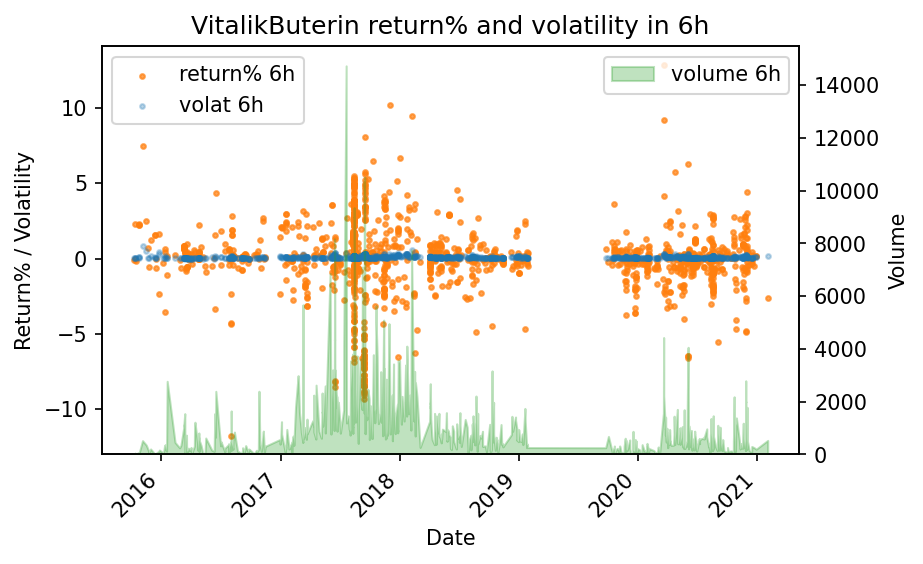

In [145]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 6h"]
y2 = VitalikButerin2["volat 6h"]
y3 = VitalikButerin2["volume 6h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 6h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 6h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 6h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 6h")
plt.show()

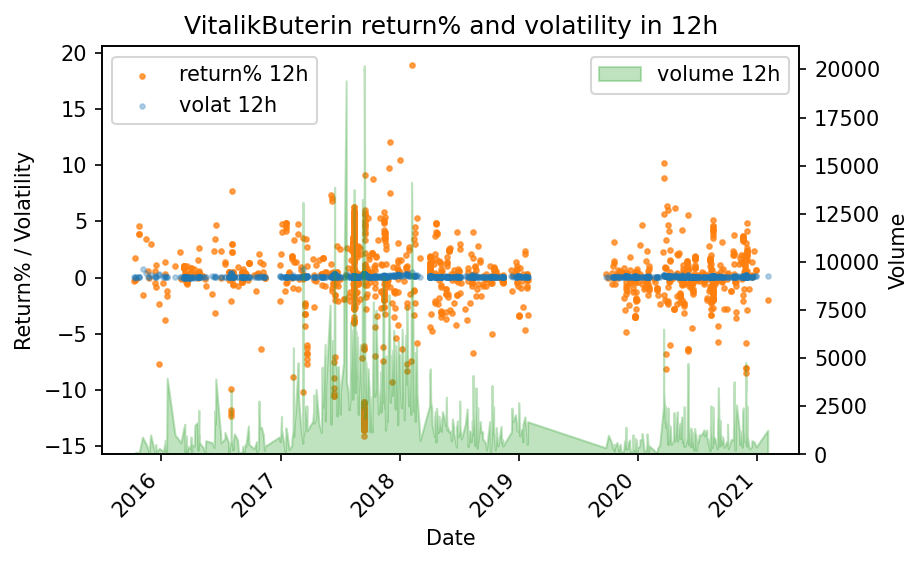

In [146]:
VitalikButerin2 = VitalikButerin
x = VitalikButerin2["date"]
y1 = VitalikButerin2["return% 12h"]
y2 = VitalikButerin2["volat 12h"]
y3 = VitalikButerin2["volume 12h"]

fig, ax1 = plt.subplots(dpi=150)
ax1.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='return% 12h')
ax1.scatter(x, y2,s=5,color='tab:blue', alpha=.3, label='volat 12h')
plt.ylabel('Return% / Volatility')
plt.xlabel('Date')
ax1.legend(loc='upper left')


ax2 = ax1.twinx()
ax2.stackplot(x, y3, color ='tab:green', alpha=.3, labels=['volume 12h'])
plt.ylabel('Volume')
ax2.legend(loc='upper right')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin return% and volatility in 12h")
plt.show()

## Volatility Ratio Graph

In [147]:
VitalikButerin_full['volat ratio 10min'] = VitalikButerin_full['volat 10m'] / VitalikButerin_full['volat 10m_r'] #Make ratio column for volatility
VitalikButerin_full['volat ratio 30min'] = VitalikButerin_full['volat 30m'] / VitalikButerin_full['volat 30m_r']
VitalikButerin_full['volat ratio 1h'] = VitalikButerin_full['volat 1h'] / VitalikButerin_full['volat 1h_r']
VitalikButerin_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volume 1d_r,volat 1m_r,volat 10m_r,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h
0,0,22,2021-02-01 09:47:00,I sent some! https://t.co/mfYrz35zjF You sho...,244161,34358.65,0.263807,0.042900,0.023895,-0.152480,...,1476.393471,0.0,0.089381,0.102430,0.149670,0.144197,0.177082,1.465493,1.505353,0.992938
1,1,84,2020-12-28 01:55:00,"@iamworld228 @BTCWillWin @Excellion Also, I ho...",295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,2553.399421,0.0,0.159665,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512
2,2,84,2020-12-28 01:55:00,"@iamworld228 @BTCWillWin @Excellion Also, I ho...",295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,2553.399421,0.0,0.159665,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512
3,3,85,2020-12-28 01:55:00,@iamworld228 @BTCWillWin @Excellion Or maybe y...,295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,2553.399421,0.0,0.159665,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512
4,4,85,2020-12-28 01:55:00,@iamworld228 @BTCWillWin @Excellion Or maybe y...,295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,2553.399421,0.0,0.159665,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1470,1470,14526,2015-10-24 21:26:00,@jimmyhomma @TakaoAsayama depends on your metr...,2915159,281.14,0.000000,0.000000,0.000000,0.533542,...,379.208394,0.0,0.000000,0.114290,0.081509,0.063999,0.054680,NaN,0.837989,1.019607
1471,1471,14530,2015-10-15 06:32:00,"https://t.co/vzAH3NEDOr ""A sidechain is a bch...",2929013,255.90,0.000000,0.000000,0.000000,0.000000,...,135.602069,0.0,0.000000,0.000000,0.065535,0.059672,0.053820,NaN,NaN,0.000000
1472,1472,14532,2015-10-13 06:21:00,"yay, #bruceschneier strawmanning bitcoin/crypt...",2931904,245.75,0.000000,0.000000,0.000000,0.223805,...,70.817743,0.0,0.000000,0.000000,0.000000,0.000000,0.029380,NaN,inf,inf
1473,1473,14533,2015-10-12 13:47:00,http://t.co/rNqTgKQhfI @nanok explains well ...,2932898,247.62,0.000000,0.000000,0.000000,0.000000,...,59.675364,0.0,0.000000,0.000000,0.004673,0.029812,0.021116,NaN,NaN,0.000000


<ipython-input-148-643df85b31d0>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


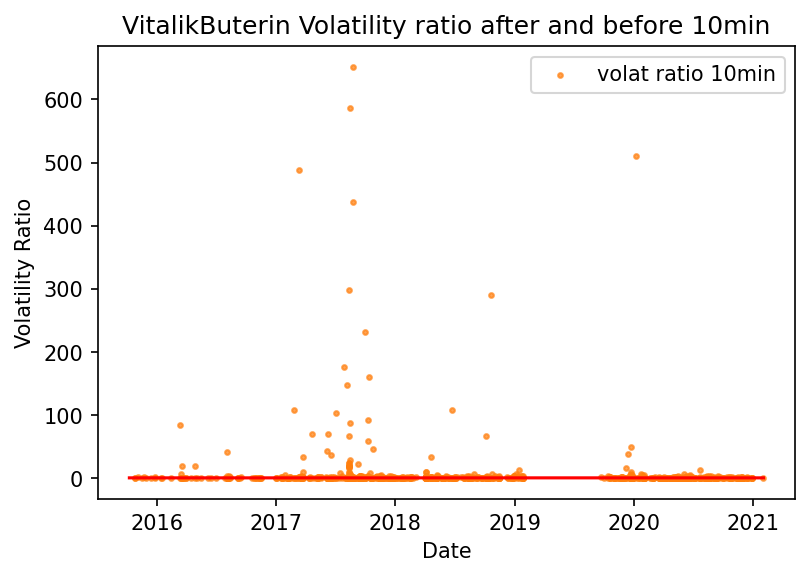

In [148]:
VitalikButerin2 = VitalikButerin_full #copy
x = VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volat ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 10min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volatility ratio after and before 10min")
fig.show()

<ipython-input-149-8c9192259141>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


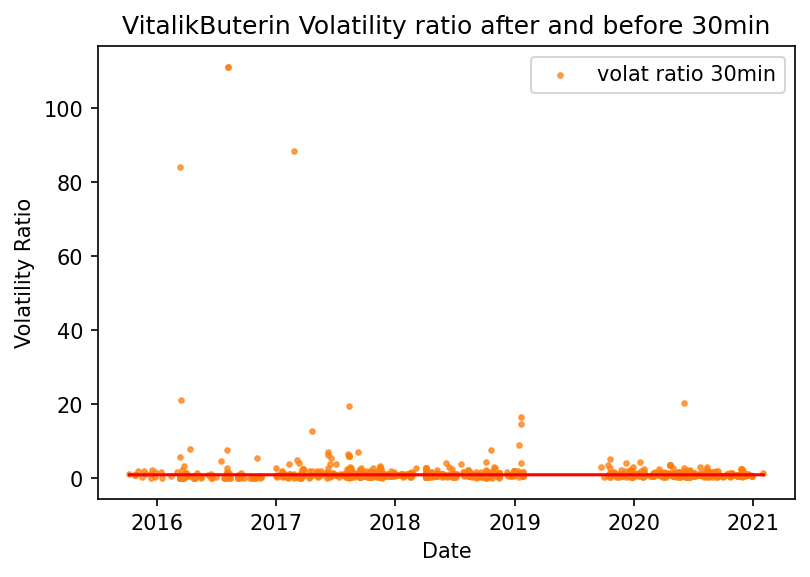

In [149]:
VitalikButerin2 = VitalikButerin_full #copy
x = VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volat ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 30min') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volatility ratio after and before 30min")
fig.show()

<ipython-input-150-1e02a80bde13>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


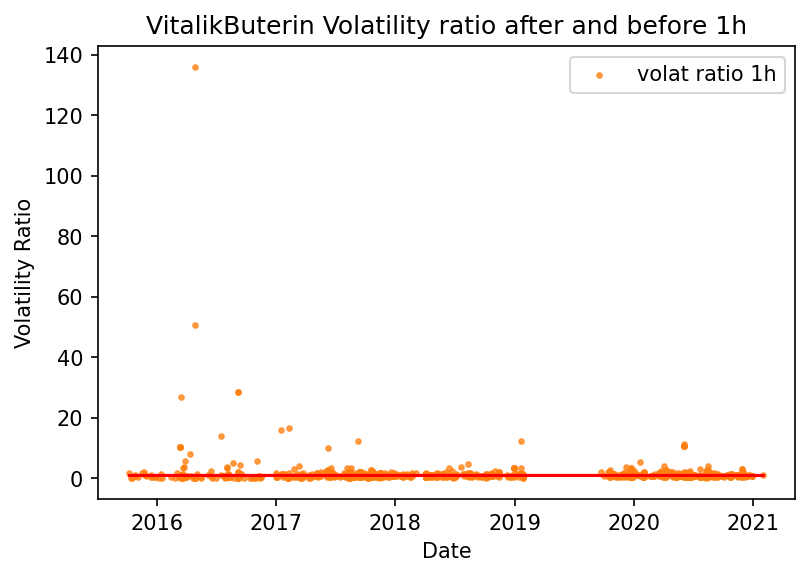

In [150]:
VitalikButerin2 = VitalikButerin_full #copy
x = VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volat ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='r', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:orange', alpha=.7,label='volat ratio 1h') #draw scatter graph for return%
plt.ylabel('Volatility Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volatility ratio after and before 1h")
fig.show()

## Volume Ratio Graph

In [151]:
VitalikButerin_full['volume ratio 10min'] = VitalikButerin_full['volume 10m'] / VitalikButerin_full['volume 10m_r'] #Make ratio column for volume
VitalikButerin_full['volume ratio 30min'] = VitalikButerin_full['volume 30m'] / VitalikButerin_full['volume 30m_r']
VitalikButerin_full['volume ratio 1h'] = VitalikButerin_full['volume 1h'] / VitalikButerin_full['volume 1h_r']
VitalikButerin_full

,Unnamed: 0,Unnamed: 0_x_x,date,tweet_x,Unnamed: 0_y_x,Close_x,Volume_x,return% 1m,return% 10m,return% 30m,...,volat 30m_r,volat 1h_r,volat 3h_r,volat 6h_r,volat ratio 10min,volat ratio 30min,volat ratio 1h,volume ratio 10min,volume ratio 30min,volume ratio 1h
0,0,22,2021-02-01 09:47:00,I sent some! https://t.co/mfYrz35zjF You sho...,244161,34358.65,0.263807,0.042900,0.023895,-0.152480,...,0.102430,0.149670,0.144197,0.177082,1.465493,1.505353,0.992938,0.134122,0.331731,0.356122
1,1,84,2020-12-28 01:55:00,"@iamworld228 @BTCWillWin @Excellion Also, I ho...",295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512,1.080867,0.570813,0.310927
2,2,84,2020-12-28 01:55:00,"@iamworld228 @BTCWillWin @Excellion Also, I ho...",295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512,1.080867,0.570813,0.310927
3,3,85,2020-12-28 01:55:00,@iamworld228 @BTCWillWin @Excellion Or maybe y...,295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512,1.080867,0.570813,0.310927
4,4,85,2020-12-28 01:55:00,@iamworld228 @BTCWillWin @Excellion Or maybe y...,295024,26999.00,2.360446,-0.080818,0.454165,0.016149,...,0.170695,0.164002,0.174497,0.192045,0.574507,0.749617,0.774512,1.080867,0.570813,0.310927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1470,1470,14526,2015-10-24 21:26:00,@jimmyhomma @TakaoAsayama depends on your metr...,2915159,281.14,0.000000,0.000000,0.000000,0.533542,...,0.114290,0.081509,0.063999,0.054680,NaN,0.837989,1.019607,NaN,195.965018,391.930035
1471,1471,14530,2015-10-15 06:32:00,"https://t.co/vzAH3NEDOr ""A sidechain is a bch...",2929013,255.90,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.065535,0.059672,0.053820,NaN,NaN,0.000000,NaN,NaN,0.000000
1472,1472,14532,2015-10-13 06:21:00,"yay, #bruceschneier strawmanning bitcoin/crypt...",2931904,245.75,0.000000,0.000000,0.000000,0.223805,...,0.000000,0.000000,0.000000,0.029380,NaN,inf,inf,NaN,inf,inf
1473,1473,14533,2015-10-12 13:47:00,http://t.co/rNqTgKQhfI @nanok explains well ...,2932898,247.62,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.004673,0.029812,0.021116,NaN,NaN,0.000000,NaN,0.518519,0.016382


<ipython-input-152-32ff2a3bb090>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


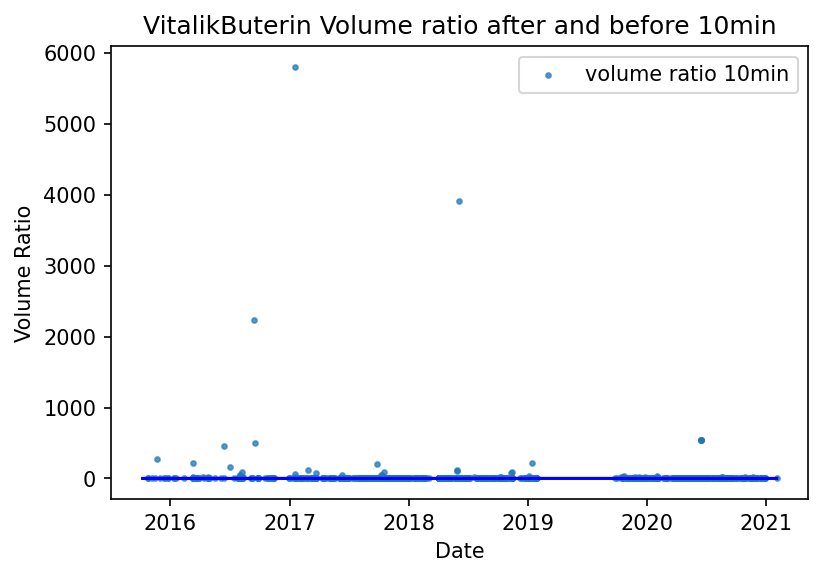

In [152]:
VitalikButerin2 = VitalikButerin_full #copy
x =VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volume ratio 10min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 10min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volume ratio after and before 10min")
fig.show()

<ipython-input-153-031745dccfb7>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


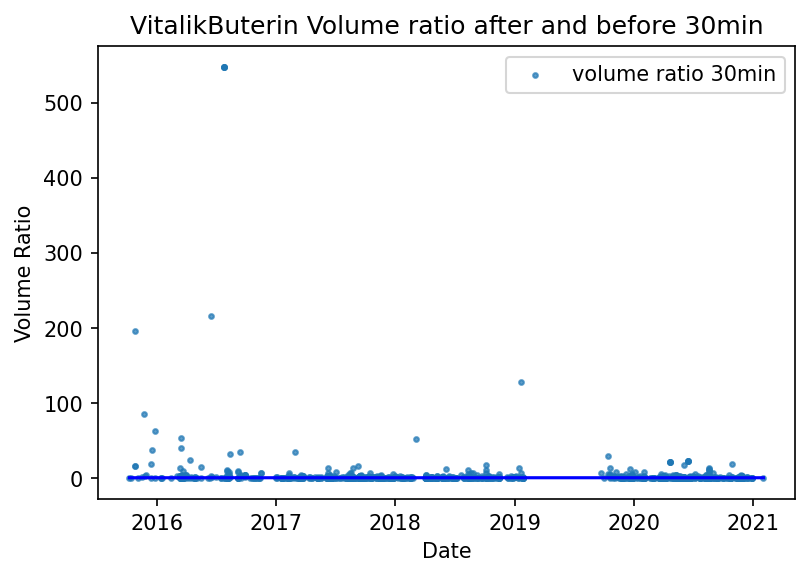

In [153]:
VitalikButerin2 = VitalikButerin_full #copy
x = VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volume ratio 30min"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 30min') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volume ratio after and before 30min")
fig.show()

<ipython-input-154-b3eef1eabaa5>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


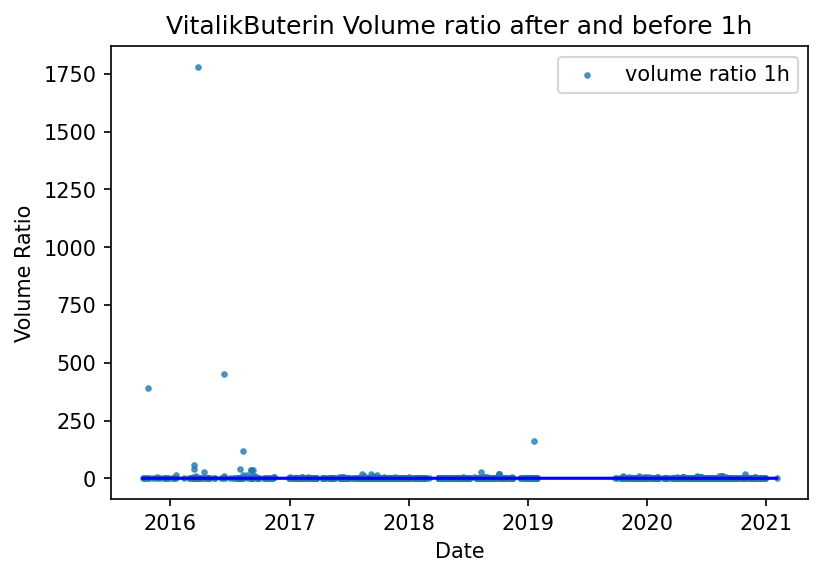

In [154]:
VitalikButerin2 = VitalikButerin_full #copy
x = VitalikButerin2["date"] #x axis
y1 = VitalikButerin2["volume ratio 1h"] #return y-axis
y2 = [1] * len(x) #for drawing y = 1 graph

plt.figure(dpi=150)

plt.plot(x, y2, color='b', linestyle='-') # draw y =1 graph with red line
plt.scatter(x, y1,s=5,color='tab:blue', alpha=.7,label='volume ratio 1h') #draw scatter graph for return%
plt.ylabel('Volume Ratio')
plt.xlabel('Date')
plt.legend(loc='best')

plt.autoscale(enable=True, axis='x')
fig.autofmt_xdate(rotation=45) #rotate the date string by 45
plt.title("VitalikButerin Volume ratio after and before 1h")
fig.show()

# Trendline Graph (opdtional)

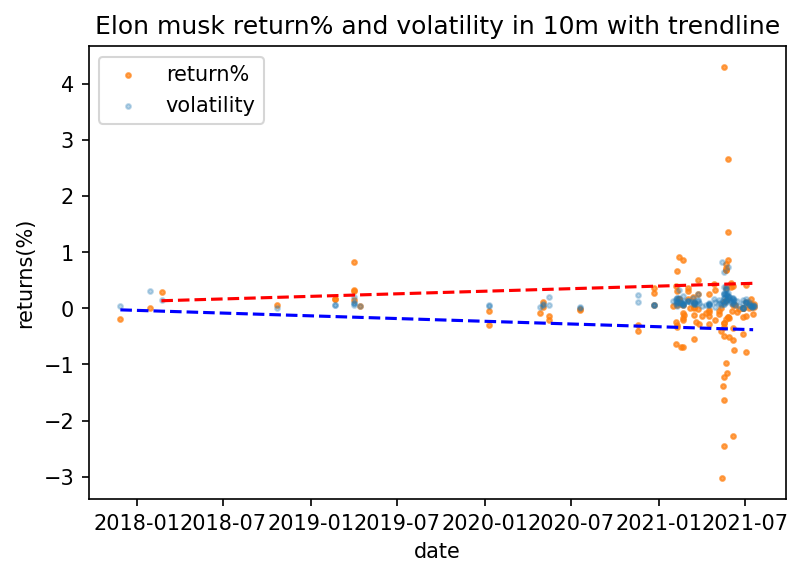

In [155]:
y1 = []
y2 = []

for i in range(len(elon["return% 10m"])):#divide into positive and negative, type:List
    if elon["return% 10m"][i] > 0:
        y1.append(elon["return% 10m"][i])
        #y1=pd.DataFrame({'return% 10m': elon["return% 10m"][i], 'count': i})
    else:
        y2.append(elon["return% 10m"][i])

        
        
y1_df = pd.DataFrame(y1, columns=['return% 10m']) #Change list to data table
y2_df = pd.DataFrame(y2, columns=['return% 10m']) #Change list to data table

        
positive_elon = pd.merge(elon, y1_df, on='return% 10m') #merge divided data and date
negative_elon = pd.merge(elon, y2_df, on='return% 10m') #merge divided data and date




positive_elon['date'] = pd.to_datetime(positive_elon['date']) #convert datetime into integer tpye due to error
positive_elon['date']=positive_elon['date'].map(dt.datetime.toordinal)
x1_reg = positive_elon["date"]
y1_reg = positive_elon['return% 10m']

negative_elon['date'] = pd.to_datetime(negative_elon['date']) #convert datetime into integer tpye due to error
negative_elon['date']=negative_elon['date'].map(dt.datetime.toordinal)
x2_reg = negative_elon["date"]
y2_reg = negative_elon['return% 10m']


def func(x, a, c, d):#exponential trend
    return a*np.exp(-c*x)+d

#ax^2+bx+c
def func2(x, a, b, c):
    return a*pow(x,2)+b*x+c


plt.figure(dpi=150)
t = elon["date"]
l1=plt.scatter(t,np.array(elon['return% 10m']),s=5,color='tab:orange', alpha=.7)
l2=plt.scatter(t,np.array(elon['volat 10m']),s=5,color='tab:blue', alpha=.3, label='volat 10m')




popt, pcov = curve_fit(func, x1_reg, y1_reg, p0=(1, 1e-6, 1))
xx = np.linspace(min(x1_reg), max(x1_reg))
yy = func(xx, *popt)
plt.plot(xx, yy,c='r',linestyle='--', label='positive')
     


popt, pcov = curve_fit(func, x2_reg, y2_reg, p0=(1, 1e-6, 1))
xx = np.linspace(min(x2_reg), max(x2_reg))
yy = func(xx, *popt)
plt.plot(xx, yy,c='b',linestyle='--',label='negative')



plt.xlabel("date")
plt.ylabel('returns(%)')
plt.title('Elon musk return% and volatility in 10m with trendline')
plt.legend(handles=[l1,l2],labels=['return%','volatility'],loc='best')
plt.autoscale(enable=True, axis='x')


plt.show()